In [1]:
#%%script false --no-raise-error
import re,itertools
import scanpy as sc
import diffxpy.api as de
import utility_functions as utils
import seaborn as sns, pandas as pd, numpy as np
from os import path, scandir
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
import os
os.environ['CONDA_DEFAULT_ENV']=='covid_sc_immuno'

True

In [3]:
# Set up essential directories and parameters

In [4]:
#%%script false --no-raise-error
#expt_figdir='../figure'
expt_figdir='../figures'
expt_dir='../datasets'
utils.safe_mkdir(expt_figdir)
utils.safe_mkdir(expt_dir)

#scanpy settings
sc.settings.figdir=expt_figdir
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)
sc.settings.writedir=expt_dir

Directory already exists
Directory already exists


In [5]:
path.abspath(expt_dir)

'/Users/mt1874ng/Documents/research/covid19/analysis/final_analysis/datasets'

In [6]:
#Global variables and parameters
ADE_GENES=['ACE2','CD300LF', 'ERVW-1','FCGR2A','FCGR2B','FUT8','IFNB1', 'IFNG','KLRC1','KLRD1','LIF',
 'LIFR','LILRB1','MYD88','NRP1','NRP2','TMPRSS2']
immunoregulatory_profibrotic_macrophages=['A2M','GPR183','CCL13','TREM2','TGFB1','SPP1']
chemokine_like_macrophages=['CCL2', 'CCL3', 'CXCL10']
peripheral_monocyte_like_macrophages=['S100A8','FCN1','CD14']
macrophages_subtypes_markers=['FCN1', 'SPP1', 'FABP4']
markers=['CD68', 'FCGR3B', 'CD1C', 'CLEC9A', 'LILRA4', 'KLRD1','CD3D', 'MS4A1', 'IGHG4', 'TPPP3', 'KRT18']
markers_dict={'CD68':'Macrophages', 'FCGR3B':'Neutrophils', 'CD1C':'mDCs', 'CLEC9A':'mDCs', 'LILRA4':'pDCs', 
              'KLRD1':'NK cells','CD3D':'T cells', 'MS4A1':'B cells', 'IGHG4':'Plasma cells', 
              'TPPP3':'Epithelial cells', 'KRT18':'Epithelial cells'}
#Palettes
LOUVAIN_SP_COLORS_DICT={0: '#0173b2', 1: '#de8f05', 2: '#029e73',3: '#d55e00', 4: '#cc78bc',
 5: '#ca9161',6: '#fbafe4', 7: '#949494', 8: '#ece133', 9: '#56b4e9', 10: '#0173b2', 11: '#de8f05',
 12: '#029e73', 13: '#d55e00', 14: '#cc78bc', 15: '#ca9161', 16: '#fbafe4', 17: '#949494', 18: '#ece133',
 19: '#56b4e9'}
DERIVED_ORGANS_PALETTE=sns.color_palette(palette='Set1',n_colors=18).as_hex()
DERIVED_ORGANS_PALETTE_DICT=dict(zip(['blood', 'brain (organoid)', 'colon', 'decidua', 'embryo', 'esophagus', 'eye', 'hematopoietic system', 'hematopoietic system (cell line)', 'immune system', 'immune system (cell line)', 'kidney', 'liver', 'lung', 'mediastinal lymph node',
          'pancreas', 'placenta', 'spleen'],DERIVED_ORGANS_PALETTE))

DERIVED_ORGANS_PALETTE_DICT={'blood': '#e41a1c',
 'brain (organoid)': '#377eb8',
 'colon': '#4daf4a',
 'decidua': '#984ea3',
 'embryo': '#ff7f00',
 'esophagus': '#ffff33',
 'eye': '#a65628',
 'hematopoietic system': '#f781bf',
 'hematopoietic system (cell line)': '#999999',
 'immune system': '#e41a1c',
 'immune system (cell line)': '#377eb8',
 'kidney': '#4daf4a',
 'liver': '#984ea3',
 'lung': '#ff7f00',
 'mediastinal lymph node': '#ffff33',
 'pancreas': '#a65628',
 'placenta': '#f781bf',
 'spleen': '#999999'}

SPs_COLORS_DICT={'AdventitialFibroblast_P1': '#e41a1c','AlveolarEpithelialType1_P1': '#377eb8','Artery_P1': '#999999',
 'Bcells': '#f781bf','Ciliated': '#f781bf','Ciliated1': '#377eb8','Ciliated_P1': '#ff7f00','Dendriticcells': '#ffff33',
 'DifferentiatingBasal_P1': '#4daf4a','Fibroblast': '#4daf4a','Goblet2': '#4daf4a','Goblet_1': '#a65628',
 'Immuno_Monocytes': '#ff7f00','Immuno_TCells': '#e41a1c','Luminal_Macrophages': '#377eb8','Mesothelial_P1': '#ffff33',
 'Neutrophils': '#a65628','ProliferatingBasal_P1': '#999999','TandNK': '#984ea3','Type2alveolar': '#984ea3',
 'Type_1_alveolar': '#e41a1c'}

TOP_CELL_TYPE_COLORS_DICT={'AdventitialFibroblast_P1': '#8dd3c7',
 'AirwaySmoothMuscle_P1': '#ffffb3',
 'AirwaySmoothMuscle_P2': '#ffffb3',
 'AlveolarEpithelialType1_P1': '#bebada',
 'AlveolarEpithelialType1_P2': '#bebada',
 'AlveolarEpithelialType2_P1': '#bebada',
 'AlveolarFibroblast_P1': '#bebada',
 'Artery_P1': '#fb8072',
 'Artery_P2': '#fb8072',
 'Basal2': '#80b1d3',
 'Bcells': '#fdb462',
 'BronchialVessel1_P1': '#b3de69',
 'BronchialVessel2_P1': '#b3de69',
 'Capillary_P1': '#fccde5',
 'Ciliated1': '#d9d9d9',
 'Ciliated2': '#d9d9d9',
 'Ciliated_P1': '#d9d9d9',
 'Club_P1': '#bc80bd',
 'Dendriticcells': '#ccebc5',
 'DifferentiatingBasal_P1': '#ffed6f',
 'Endothelial': '#8dd3c7',
 'Fibroblast': '#ffffb3',
 'Fibroblasts': '#ffffb3',
 'Goblet2': '#bebada',
 'Immuno_Monocytes': '#fb8072',
 'Immuno_TCells': '#fb8072',
 'Lipofibroblast_P1': '#80b1d3',
 'Luminal_Macrophages': '#fdb462',
 'Lymphatic': '#b3de69',
 'LymphaticEndothelium': '#b3de69',
 'Lymphatic_P1': '#b3de69',
 'Lymphatic_P2': '#b3de69',
 'Mastcells': '#fccde5',
 'Mesothelial_P1': '#d9d9d9',
 'Mesothelium': '#d9d9d9',
 'Myofibroblast_P1': '#bc80bd',
 'Myofibroblast_P2': '#bc80bd',
 'Neutrophils': '#ccebc5',
 'Pericyte_P1': '#ffed6f',
 'ProliferatingBasal_P1': '#8dd3c7',
 'Secretory1': '#ffffb3',
 'Secretory2': '#ffffb3',
 'Secretory3': '#ffffb3',
 'Smoothmuscle': '#bebada',
 'TandNK': '#fb8072',
 'Type2alveolar': '#80b1d3',
 'Type_1_alveolar': '#80b1d3',
 'VascularSmoothMuscle_P2': '#fdb462',
 'Vein_P1': '#b3de69'}

Y_CHROM_GENES=['DBY', 'SMCY', 'UTY', 'RPS4Y','USP9Y']
X_CHROM_GENES=['XIST']

HEATPLOT_PALETTE_CMAP="vlag"

PATIENT_GROUP_COL_DICT={'severe':'#ff7f0e', 'healthy control':'#279e68','mild':'#1f77b4'}

In [7]:
# 1. Datasets, overview and qc analysis

In [8]:
biomart_gene_names = sc.queries.biomart_annotations(org="hsapiens",attrs=["ensembl_gene_id","hgnc_symbol","chromosome_name",
                                                                          'gene_biotype'])


In [9]:
ade_ensembl_df=biomart_gene_names[biomart_gene_names.hgnc_symbol.isin(ADE_GENES)]
ade_ensembl_id_dict=dict(zip(ade_ensembl_df['ensembl_gene_id'],ade_ensembl_df['hgnc_symbol']))
del ade_ensembl_df

In [10]:
ensemble_gn_hugo_name_dict=dict()
for gn in set(biomart_gene_names.ensembl_gene_id):
    ensemble_gn_hugo_name_dict[gn]=','.join([str(n) for n in sorted(set(biomart_gene_names[biomart_gene_names.ensembl_gene_id==gn]['hgnc_symbol']))])


In [11]:
cell_type_markers_lst=[]
for tmp_fname in utils.get_list_of_specific_file_type(directory=path.join(expt_dir,'markers/ucsc_single_cell/'),
                                                      file_pattern='.tsv'):
    tmp_fname_parts=tmp_fname.split('/')
    if tmp_fname_parts[-1].endswith('_exprMatrix.tsv') or tmp_fname_parts[-1].endswith('meta.tsv'):continue
    tmp_df=pd.read_table(tmp_fname,header=0)[['id' , 'symbol']]
    tmp_df['type']=re.sub(string=tmp_fname_parts[-1],pattern='.tsv',repl='')
    tmp_df['dataset']=tmp_fname_parts[-2]
    cell_type_markers_lst.append(tmp_df)
cell_type_markers_df=pd.concat(cell_type_markers_lst).reset_index(drop=True)
print(cell_type_markers_df.head())
cell_type_markers_dict={}
for c in cell_type_markers_df.groupby('type'):
    cell_type_markers_dict[c[0]]=c[1]['id'].to_list()

        id   symbol                 type                    dataset
0  SPARCL1  SPARCL1  BronchialVessel1_P1  Krasnow_Lung_datasets_10X
1   IFITM3   IFITM3  BronchialVessel1_P1  Krasnow_Lung_datasets_10X
2   ADGRL4   ADGRL4  BronchialVessel1_P1  Krasnow_Lung_datasets_10X
3    SPRY1    SPRY1  BronchialVessel1_P1  Krasnow_Lung_datasets_10X
4    CYYR1    CYYR1  BronchialVessel1_P1  Krasnow_Lung_datasets_10X


In [12]:
cell_type_markers_ensemble_id_dict={}
for k,v in cell_type_markers_dict.items():
    tmp_gene_set=set()
    for g in v:
        tmp_ensembl_id=biomart_gene_names[biomart_gene_names.hgnc_symbol==g]['ensembl_gene_id'].values
        if len(tmp_ensembl_id)<1:continue
        tmp_gene_set.update(tmp_ensembl_id)
    cell_type_markers_ensemble_id_dict[k]=list(tmp_gene_set)

In [13]:
#%%script false
adata=sc.read_loom(filename=path.join(expt_dir,'markers_expression_in_healthy_hca_normalized.loom'),
                   var_names='Gene')
adata.var_names_make_unique()

/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [14]:
#%%script false
#Subset observations
#Remove full-length protocols
adata=adata[adata.obs.index[adata.obs['library_preparation_protocol.end_bias']=='3 prime tag'],:]
print(adata.obs.shape)

#Remove nan organs
adata=adata[adata.obs.index[adata.obs['derived_organ_parts_ontology']!='nan'],:]
print(adata.obs.shape)

#Remove diseased samples
adata=adata[adata.obs.index[adata.obs['donor_organism.diseases.ontology_label']=='normal'],:]
print(adata.obs.shape)

(42489, 47)
(42489, 47)
(42489, 47)


In [15]:
#%%script false
#Calculate fraction of mitochondrial genes expressed
if adata.obs.mito_fraction.empty:
    mitochondrial_genes_data=adata[:,adata.var[adata.var.chromosome=='chrM'].index]
    other_genes_data=adata[:,adata.var[adata.var.chromosome!='chrM'].index]
    fraction_series=mitochondrial_genes_data.to_df().sum(axis=1)/other_genes_data.to_df().sum(axis=1)
    adata.obs['mito_fraction']=fraction_series
    del mitochondrial_genes_data, other_genes_data ,fraction_series
else:
    print('Mitochondrial fraction already calculated')

Mitochondrial fraction already calculated


In [16]:
#%%script false
#Basic QC and normalization of datasets
adata=adata[:,adata.var.index[adata.var['featuretype']=='protein_coding']] # Only use protein coding genes
#adata=adata[:,var_df[~var_df.chromosome.isin(['chrX','chrY'])].index.tolist()] #Remove sex chromosome genes


In [17]:
no_components=20
neighbours_metric='euclidean'
sc.pp.highly_variable_genes(adata=adata,subset=False,batch_key='derived_organ_label')
sc.tl.pca(data=adata,use_highly_variable=True,n_comps=no_components)
sc.pp.neighbors(adata=adata,metric=neighbours_metric)
sc.tl.umap(adata=adata)
sc.tl.louvain(adata=adata,flavor='vtraag')

extracting highly variable genes
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/anndata/_core/anndata.py:1229: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'analysis_protocol.provenance.document_id' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'analysis_working_group_approval_status' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'barcode' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'batch' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'bundle_uuid' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'bundle_version' as categorical
Trying to set attribute `.obs` of view, c

Trying to set attribute `.uns` of view, copying.


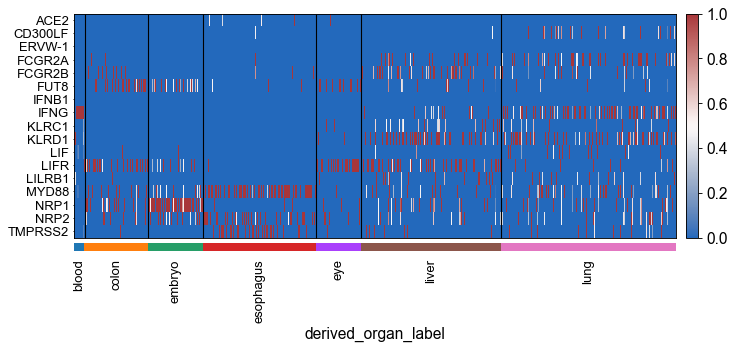

In [18]:
#%%script false
#fig_heatmap=sns.clustermapheatmap(adata=adata, var_names=ADE_GENES, groupby='derived_organ_label',dendrogram=False, swap_axes=True)
categories='derived_organ_label'
ADE_GENES_expr=sorted([g for g in set(ADE_GENES[:]).intersection(adata.var_names)])
#ade_obs=temp_df.index[temp_df.sum(axis=1)>0.0]
tmp_adata=adata.copy()
tmp_adata=tmp_adata[:,ADE_GENES_expr]
temp_df=tmp_adata.to_df()
del tmp_adata
ade_obs=temp_df.index[temp_df.sum(axis=1)>0.0]
tmp_adata=adata.copy()
tmp_adata=tmp_adata[ade_obs,:]
tmp_fig=sc.pl.heatmap(adata=tmp_adata, var_names=ADE_GENES_expr,cmap='vlag',groupby=categories,figsize=(10,4),
                      standard_scale='obs',save='_fig1a.pdf',dendrogram=False,swap_axes=True)
del tmp_adata,ade_obs 


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


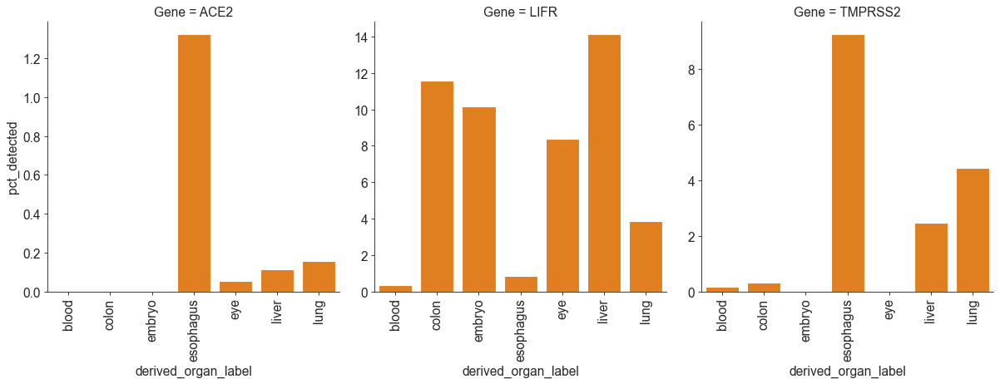

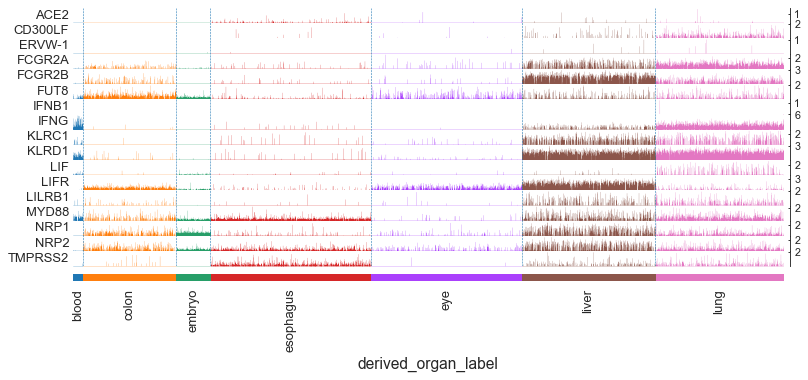

In [19]:
category='derived_organ_label'
organs=[o for o in adata.obs[category].unique()]
ADE_GENES_expr=[g for g in set(ADE_GENES[:]).intersection(adata.var_names)]
out_lst=[]
for tmp_o in organs:
    #if not tmp_o=='blood':continue
    tmp_obs=adata.obs[adata.obs[category]==tmp_o]
    tmp_adata=adata[tmp_obs.index,:]
    sc.pp.calculate_qc_metrics(adata=tmp_adata,inplace=True)
    tmp_df=tmp_adata.var.loc[ADE_GENES_expr,:]
    tmp_df[category]=tmp_o
    out_lst.append(tmp_df)
    del tmp_df,tmp_adata,tmp_obs
fig_df=pd.concat(out_lst) 
fig_df=fig_df.reset_index(drop=False)
fig_df.rename(columns={'index':'Gene'},inplace=True)
del out_lst
fig_df['pct_detected']=[100-p for p in fig_df.pct_dropout_by_counts]
sns.set_style(style='ticks')
tmp_gns=sorted(['LIFR','ACE2','TMPRSS2'])
tmp_genes_palette_dict=dict(zip(fig_df[category].unique(),['#ff7f00' for m in range(len(fig_df[category].unique()))]))
tmp_fig_df=fig_df[fig_df.Gene.isin(tmp_gns)]
tmp_fig=sns.catplot(data=tmp_fig_df,col='Gene',hue=category,col_wrap=3,ci=None,col_order=tmp_gns,
                    palette=tmp_genes_palette_dict,
                    y='pct_detected',x=category,kind='bar', sharex=True,sharey=False,
                   **{'dodge':False})
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
tmp_fig.savefig(path.join(expt_figdir,'key_target_genes_detection_rate_fig1a.pdf'))
del tmp_fig_df, tmp_gns

##

ADE_GENES_expr=sorted([g for g in set(ADE_GENES[:]).intersection(adata.var_names)])
if len(ADE_GENES_expr)>0:
    tmp_trackplot_fig=sc.pl.tracksplot(adata=adata,var_names=ADE_GENES_expr,use_raw=False,rotation=90,
                                       groupby=categories,save='_organs_trackplot_supp_fig1a')

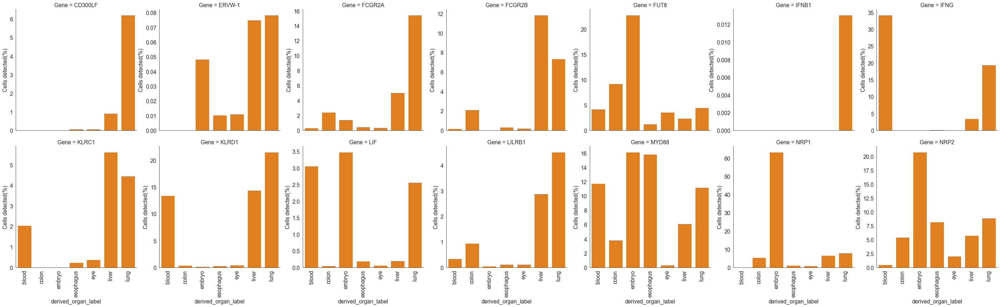

In [20]:
sns.set_style(style='white')
tmp_genes_palette_dict=dict(zip(fig_df[category].unique(),['#ff7f00' for m in range(len(fig_df[category].unique()))]))
tmp_gns=sorted([g for g in set(ADE_GENES) if not g in ['LIFR','ACE2','TMPRSS2']])
tmp_fig=sns.catplot(data=fig_df,col='Gene',hue=category,col_wrap=7,ci=None,palette=tmp_genes_palette_dict,
                    col_order=tmp_gns,y='pct_detected',x=category,kind='bar', sharex=True,sharey=False,
                   **{'dodge':False})
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    ax.set_ylabel('Cells detected(%)')
tmp_fig.savefig(path.join(expt_figdir,'target_genes_detection_rate_supp_fig1b.pdf'))

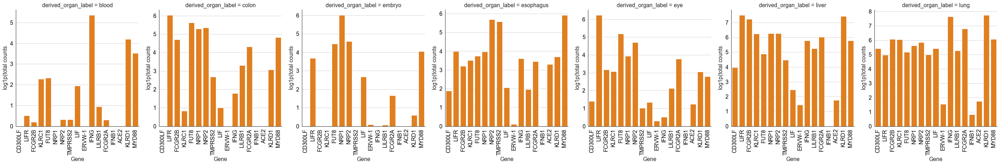

In [21]:
sns.set_style(style='white')
sc.set_figure_params(figsize=(15,15))
category='derived_organ_label'
y='log1p_total_counts'
x='Gene'
col='derived_organ_label'
kind='bar'
tmp_genes_palette_dict=dict(zip(fig_df[category].unique(),['#ff7f00' for m in range(len(fig_df[category].unique()))]))
#tmp_gns=sorted([g for g in set(ADE_GENES) if not g in ['LIFR','ACE2','TMPRSS2']])
tmp_gns=sorted([g for g in set(ADE_GENES)])
tmp_fig=sns.catplot(data=fig_df,col=col,hue=category,col_wrap=7,ci=None,palette=tmp_genes_palette_dict,
                    col_order=None,y=y,x=x,kind=kind, sharex=True,sharey=False,
                   **{'dodge':False})
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    ax.set_ylabel('log1p(total counts')
tmp_fig.savefig(path.join(expt_figdir,'target_genes_total_counts_in_organs.pdf'))

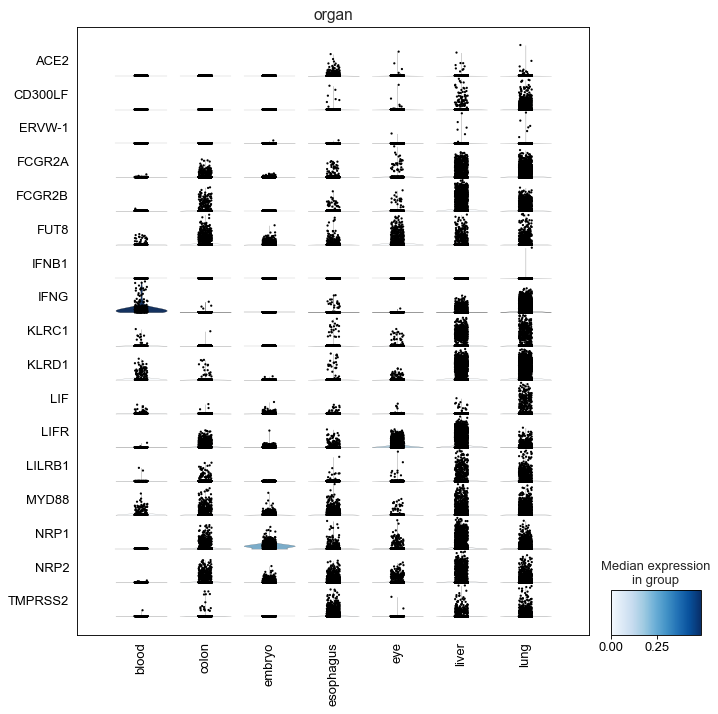

In [22]:
categories='derived_organ_label'
ADE_GENES_expr=sorted([g for g in set(ADE_GENES[:]).intersection(adata.var_names)])
#ade_obs=temp_df.index[temp_df.sum(axis=1)>0.0]
tmp_adata=adata[:,ADE_GENES_expr]
temp_df=tmp_adata.to_df()
ade_obs=temp_df.index[temp_df.sum(axis=1)>0.0]
tmp_adata=tmp_adata[ade_obs,:]
fig=sc.plotting.stacked_violin(adata=tmp_adata, var_names=ADE_GENES_expr,swap_axes=True,stripplot=True,
                               figsize=(10,10),dendrogram=False,size=2.0,jitter=True,
                               groupby='derived_organ_label',save='_supp_fig2.pdf',show=True,rotation=45,
                               use_raw=False, **{'title':'organ'})
del tmp_adata,ade_obs,temp_df

In [23]:
del adata

In [24]:
organ_adata=sc.read_loom(filename=path.join(expt_dir,
                                            'derived_organ_label_eq_lung_genes_detected_eq_more_300.loom'),
                         var_names='Accession')
organ_adata.obs['disease_state']=['hypertensive' if s=='Left lateral basal bronchopulmonary segment' else 'right_normal' if s=='lung parenchyma;lower lobe of right lung' else 
                         'left_normal' for s in organ_adata.obs.derived_organ_parts_label]
organ_adata.raw=organ_adata

In [25]:
tmp_adata=organ_adata.copy()
markers=ADE_GENES[:]
counter=0
counts_per_cell_after=10000
min_cells_count=3
min_no_genes_count=1000
pca_components=20
neighbours_metric='euclidean'
mito_fraction_cut_off=0.2
tmp_markers_genes_list=[g for g in sorted(set(ADE_GENES).intersection(tmp_adata.var['Gene']))]
tmp_organ_genes=tmp_adata.var[tmp_adata.var.featuretype=='protein_coding'].index
tmp_adata=tmp_adata[:,tmp_organ_genes]
sc.pp.filter_genes(data=tmp_adata,min_cells=min_cells_count,inplace=True)
sc.pp.filter_cells(data=tmp_adata,min_genes=min_no_genes_count,inplace=True)
mitochondrial_genes_data=tmp_adata[:,tmp_adata.var[tmp_adata.var.chromosome=='chrM'].index]
other_genes_data=tmp_adata[:,tmp_adata.var[tmp_adata.var.chromosome!='chrM'].index]
fraction_series=mitochondrial_genes_data.to_df().sum(axis=1)/other_genes_data.to_df().sum(axis=1)
tmp_adata.obs['mito_fraction']=fraction_series
tmp_mito_filt_pass_obs=fraction_series.index[fraction_series<=mito_fraction_cut_off]
tmp_adata=tmp_adata[tmp_mito_filt_pass_obs,:]
tmp_adata.raw=tmp_adata
sc.pp.normalize_per_cell(tmp_adata,counts_per_cell_after=counts_per_cell_after)
tmp_adata.X=tmp_adata.X.log1p()
sc.pp.highly_variable_genes(adata=tmp_adata,subset=False,inplace=True)
sc.tl.pca(data=tmp_adata,use_highly_variable=True,n_comps=pca_components)
sc.pp.neighbors(adata=tmp_adata,metric=neighbours_metric)
sc.tl.umap(adata=tmp_adata)
sc.tl.louvain(adata=tmp_adata)
#del tmp_adata

filtered out 1733 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 63789 cells that have less than 1000 genes expressed
normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:36)
running Louvain clus

... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
... storing 'donor_organism.development_stage.ontology' as categorical
... storing 'donor_organism.development_stage.ontology_label' as categorical
... storing 'donor_organism.diseases.ontology' as categorical
... storing 'donor_organism.disea

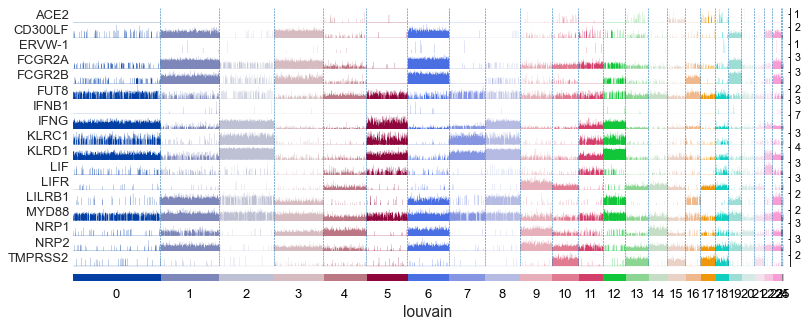

In [26]:
tmp_trackplot_fig=sc.pl.tracksplot(adata=tmp_adata,var_names=tmp_markers_genes_list,gene_symbols='Gene',
                                   dendrogram=False,use_raw=False,rotation=90,groupby='louvain')

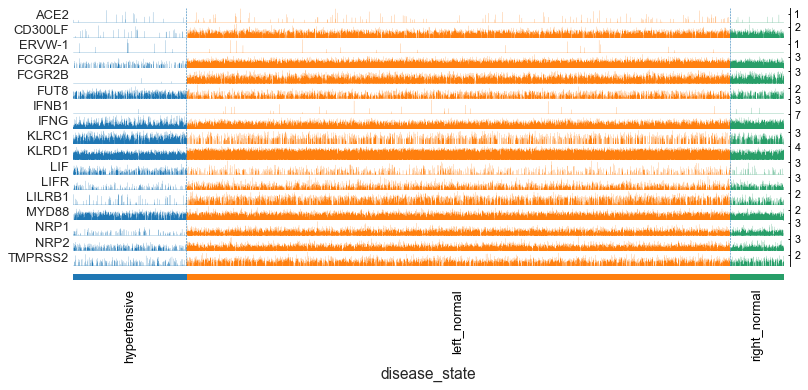

In [27]:
tmp_trackplot_fig=sc.pl.tracksplot(adata=tmp_adata,var_names=tmp_markers_genes_list,gene_symbols='Gene',
                                   dendrogram=False,use_raw=False,rotation=90,groupby='disease_state')

In [28]:
del tmp_adata

In [29]:
#%%script false
#Calculate fraction of mitochondrial genes expressed
sns.set(style="white",palette='Set1')
categorization_groups={'specimen_from_organism.organ_parts.ontology_label',
                       'donor_organism.diseases.ontology_label'}
col_categories=[c for c in organ_adata.obs.columns if len(organ_adata.obs[c].unique())<10 if len(organ_adata.obs[c].unique())>=2]
col_categories.append("genes_detected")
grouping='project.project_core.project_title'
subset_cells=None
neighbours_metric='euclidean'
organ_adata_obs_df=organ_adata.obs.copy()
grouped_df = organ_adata_obs_df.groupby([c for c in categorization_groups.intersection(organ_adata_obs_df.columns)])
groups_dict=grouped_df.groups
counter=0
counts_per_cell_after=10000
min_cells_count=3
min_no_genes_count=1000
pca_components=20
mito_fraction_cut_off=0.2
organs_adata_dict={}
for k,v in groups_dict.items():
    #if k[0]!='Left lateral basal bronchopulmonary segment':continue
    print(k)
    tmp_samples=v.to_list()
    if subset_cells is not None:
        tmp_samples=np.random.choice(tmp_samples,size=subset_cells,replace=False)
    tmp_adata=organ_adata[tmp_samples,:]
    tmp_organ_genes=tmp_adata.var[tmp_adata.var.featuretype=='protein_coding'].index.to_list()
    tmp_adata=tmp_adata[:,tmp_organ_genes]
    sc.pp.filter_genes(data=tmp_adata,min_cells=min_cells_count,inplace=True)
    sc.pp.filter_cells(data=tmp_adata,min_genes=min_no_genes_count,inplace=True)
    mitochondrial_genes_data=tmp_adata[:,tmp_adata.var[tmp_adata.var.chromosome=='chrM'].index]
    other_genes_data=tmp_adata[:,tmp_adata.var[tmp_adata.var.chromosome!='chrM'].index]
    fraction_series=mitochondrial_genes_data.to_df().sum(axis=1)/other_genes_data.to_df().sum(axis=1)
    tmp_adata.obs['mito_fraction']=fraction_series
    tmp_mito_filt_pass_obs=fraction_series.index[fraction_series<=mito_fraction_cut_off]
    tmp_adata=tmp_adata[tmp_mito_filt_pass_obs,:]
    sc.pp.calculate_qc_metrics(adata=tmp_adata,inplace=True)
    tmp_adata.raw=tmp_adata
    sc.pp.normalize_per_cell(tmp_adata,counts_per_cell_after=counts_per_cell_after)
    tmp_adata.X=tmp_adata.X.log1p()
    sc.pp.highly_variable_genes(adata=tmp_adata,subset=False,inplace=True)
    sc.tl.pca(data=tmp_adata,use_highly_variable=True,n_comps=pca_components)
    sc.pp.neighbors(adata=tmp_adata,metric=neighbours_metric)
    sc.tl.umap(adata=tmp_adata)
    #sc.tl.tsne(adata=tmp_adata)
    sc.tl.louvain(adata=tmp_adata)
    sc.tl.leiden(adata=tmp_adata)
    tmp_out_fname='_'.join(sorted(k))
    tmp_out_fname=re.sub(pattern="[\\s*||;*]",repl='_',string=tmp_out_fname)
    #tmp_umap_fig.savefig(path.join(expt_figdir,'umap'+'_'+tmp_out_fname+'.pdf'))
    organs_adata_dict[tmp_out_fname]=tmp_adata
    del mitochondrial_genes_data, other_genes_data ,fraction_series,tmp_mito_filt_pass_obs,tmp_adata
del organ_adata_obs_df,groups_dict, grouped_df

('normal', 'lung parenchyma;lower lobe of left lung')


filtered out 2078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 45825 cells that have less than 1000 genes expressed
Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordi

('normal', 'lung parenchyma;lower lobe of right lung')


filtered out 4047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1306 cells that have less than 1000 genes expressed
Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordin

('normal;hypertensive disorder', 'Left lateral basal bronchopulmonary segment')


filtered out 3023 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 16660 cells that have less than 1000 genes expressed
Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordi

In [30]:
for k, v in organs_adata_dict.items():
    print(k)
    print(v.shape)

lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)
lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)


/Users/mt1874ng/.local/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


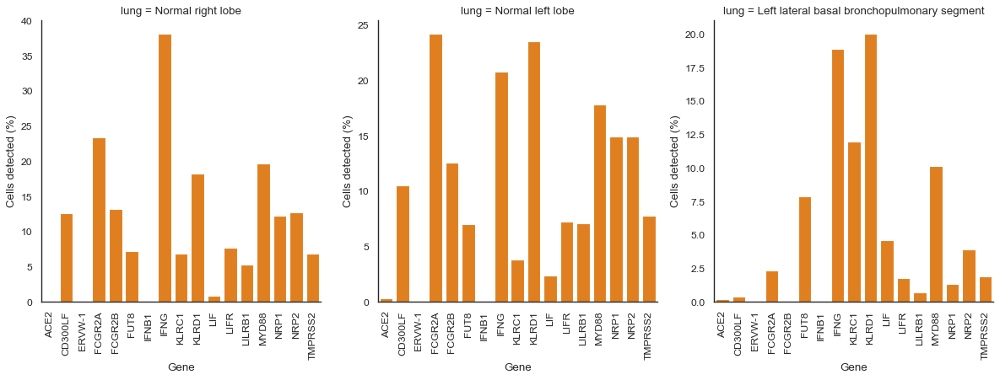

In [31]:
sns.set_style(style='white')
category='lung'
kind='bar'
tmp_dict=dict(lung_parenchyma_lower_lobe_of_left_lung_normal='Normal left lobe',
lung_parenchyma_lower_lobe_of_right_lung_normal='Normal right lobe',
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder='Left lateral basal bronchopulmonary segment')
tmp_lst=[]
for k, v in organs_adata_dict.items():
    tmp_df=v.var[v.var.Gene.isin(tmp_markers_genes_list)]
    tmp_df['lung']=k
    tmp_lst.append(tmp_df)
    del tmp_df
fig_df=pd.concat(tmp_lst)
del tmp_lst
fig_df['pct_detected']=100-fig_df.pct_dropout_by_counts
fig_df.sort_values('Gene',inplace=True)
tmp_gns=sorted([g for g in fig_df.Gene.unique()])
tmp_genes_palette_dict=dict(zip(fig_df['Gene'].unique(),
                                ['#ff7f00' for m in range(len(fig_df['Gene'].unique()))]))
fig_df['lung']=[tmp_dict[p] for p in fig_df.lung]
col_order=sorted(tmp_dict.values(),reverse=True)
tmp_fig=sns.catplot(data=fig_df,x='Gene',y='pct_detected',col='lung',col_order=col_order,
                    sharex=True,sharey=False,col_wrap=3,palette=tmp_genes_palette_dict,
                    kind=kind,**{'dodge':False})
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    ax.set_ylabel('Cells detected (%)')
tmp_fig.savefig(path.join(expt_figdir,'key_target_genes_detection_rate_fig1b.pdf'))
del fig_df,tmp_dict

/Users/mt1874ng/.local/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


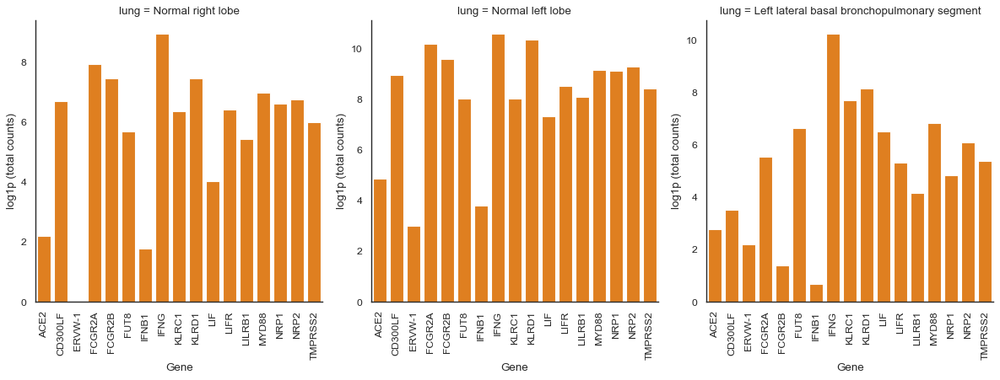

In [32]:
sns.set_style(style='white')
category='lung'
kind='bar'
y='log1p_total_counts'
x='Gene'
col='lung'
tmp_dict=dict(lung_parenchyma_lower_lobe_of_left_lung_normal='Normal left lobe',
lung_parenchyma_lower_lobe_of_right_lung_normal='Normal right lobe',
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder='Left lateral basal bronchopulmonary segment')
tmp_lst=[]
for k, v in organs_adata_dict.items():
    tmp_df=v.var[v.var.Gene.isin(tmp_markers_genes_list)]
    tmp_df['lung']=k
    tmp_lst.append(tmp_df)
    del tmp_df
fig_df=pd.concat(tmp_lst)
del tmp_lst
fig_df['pct_detected']=100-fig_df.pct_dropout_by_counts
fig_df.sort_values('Gene',inplace=True)
tmp_gns=sorted([g for g in fig_df.Gene.unique()])
tmp_genes_palette_dict=dict(zip(fig_df['Gene'].unique(),
                                ['#ff7f00' for m in range(len(fig_df['Gene'].unique()))]))
fig_df[col]=[tmp_dict[p] for p in fig_df.lung]
col_order=sorted(tmp_dict.values(),reverse=True)
tmp_fig=sns.catplot(data=fig_df,x=x,y=y,col=col,col_order=col_order,
                    sharex=True,sharey=False,col_wrap=3,palette=tmp_genes_palette_dict,
                    kind=kind,**{'dodge':False})
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    ax.set_ylabel('log1p (total counts)')
tmp_fig.savefig(path.join(expt_figdir,'key_target_genes_detection_rate_supp_fig1c.pdf'))
del fig_df,tmp_dict

... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
... storing 'donor_organism.development_stage.ontology' as categorical
... storing 'donor_organism.development_stage.ontology_label' as categorical
... storing 'donor_organism.diseases.ontology' as categorical
... storing 'donor_organism.disea

... storing 'specimen_from_organism.organ_parts.ontology' as categorical
... storing 'specimen_from_organism.organ_parts.ontology_label' as categorical
... storing 'specimen_from_organism.provenance.document_id' as categorical
... storing 'disease_state' as categorical
... storing 'Gene' as categorical
... storing 'chromosome' as categorical
... storing 'featuretype' as categorical
... storing 'genus_species' as categorical


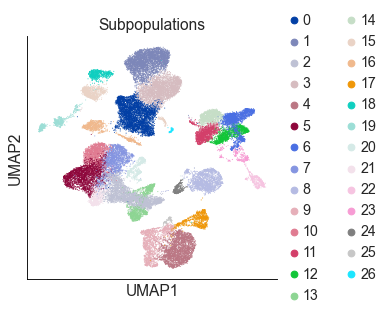

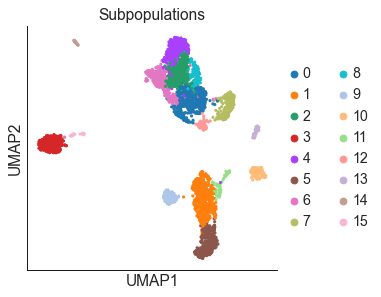

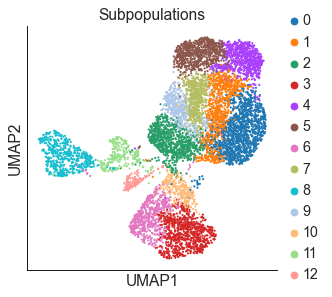

In [33]:
sc.set_figure_params(figsize=None)
# Fix the color_map=LOUVAIN_SP_COLORS_DICT argument to pick the correct colors
for k, v in organs_adata_dict.items():
    tmp_umap_fig=sc.pl.umap(adata=v,color='louvain',save=False,frameon=True,title='Subpopulations',
                            return_fig=True)
    sns.despine()
    tmp_umap_fig.savefig(path.join(expt_figdir,'umap'+'_'+k+'.pdf'))

lung_parenchyma_lower_lobe_of_left_lung_normal


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = pl.figure()


lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


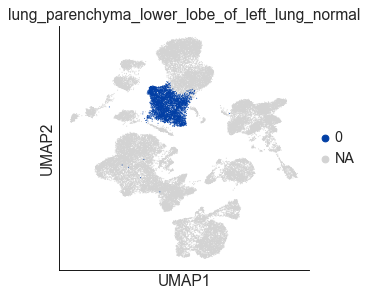

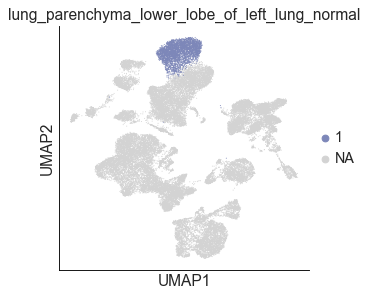

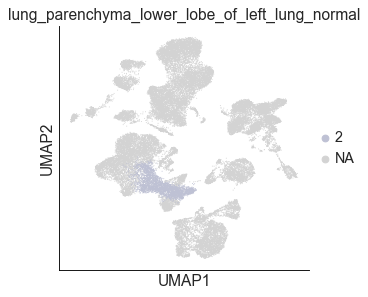

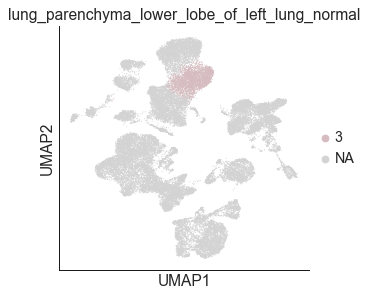

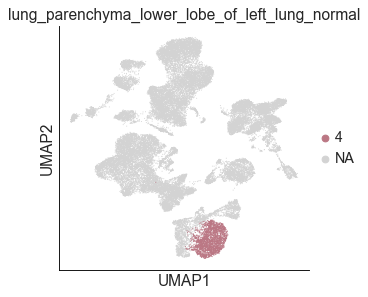

...

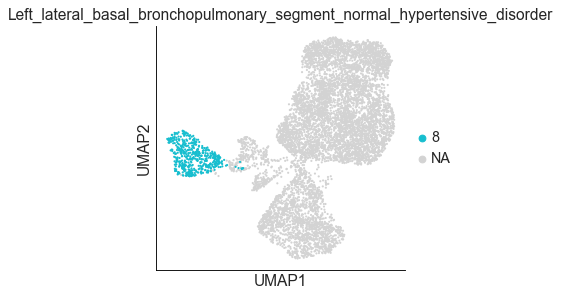

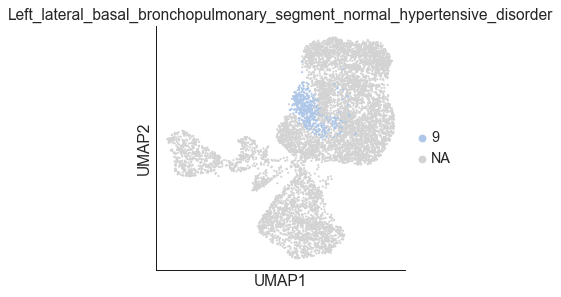

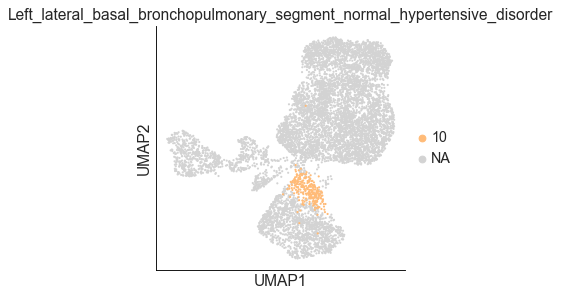

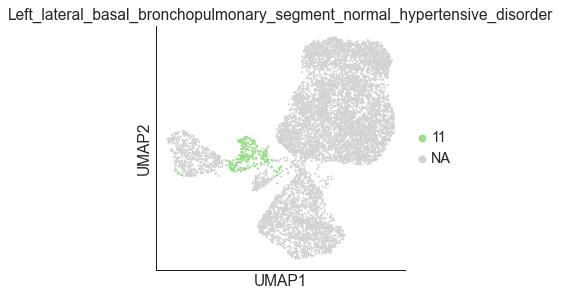

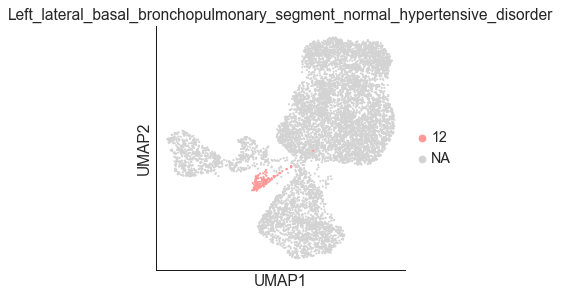

In [34]:
# Fix the color_map=LOUVAIN_SP_COLORS_DICT argument to pick the correct colors
sc.set_figure_params(figsize=None)
for k, v in organs_adata_dict.items():
    print(k)
    tmp_obs=[]
    for s,p in v.obs.groupby('louvain'):
        tmp_umap_fig=sc.pl.umap(adata=v,color='louvain',save=False,frameon=True,groups=s,
                                title=k,return_fig=True)
        sns.despine()
        del s,p
    del k,v 

In [35]:
sc.set_figure_params(figsize=None)
for k, v in organs_adata_dict.items():
    print(k)
    for kl, l in v.obs.groupby('louvain'):
        print(kl,'(n=',l.shape[0],')')
    print()

lung_parenchyma_lower_lobe_of_left_lung_normal
0 (n= 4095 )
1 (n= 3539 )
2 (n= 3263 )
3 (n= 2837 )
4 (n= 2673 )
5 (n= 2459 )
6 (n= 1957 )
7 (n= 1813 )
8 (n= 1778 )
9 (n= 1566 )
10 (n= 1278 )
11 (n= 1246 )
12 (n= 1213 )
13 (n= 1171 )
14 (n= 1039 )
15 (n= 970 )
16 (n= 896 )
17 (n= 858 )
18 (n= 653 )
19 (n= 617 )
20 (n= 590 )
21 (n= 574 )
22 (n= 438 )
23 (n= 336 )
24 (n= 321 )
25 (n= 105 )
26 (n= 69 )

lung_parenchyma_lower_lobe_of_right_lung_normal
0 (n= 526 )
1 (n= 491 )
2 (n= 469 )
3 (n= 409 )
4 (n= 358 )
5 (n= 346 )
6 (n= 341 )
7 (n= 217 )
8 (n= 149 )
9 (n= 118 )
10 (n= 114 )
11 (n= 75 )
12 (n= 61 )
13 (n= 56 )
14 (n= 32 )
15 (n= 25 )

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
0 (n= 1268 )
1 (n= 914 )
2 (n= 807 )
3 (n= 801 )
4 (n= 744 )
5 (n= 737 )
6 (n= 575 )
7 (n= 550 )
8 (n= 517 )
9 (n= 453 )
10 (n= 264 )
11 (n= 253 )
12 (n= 128 )



lung_parenchyma_lower_lobe_of_left_lung_normal


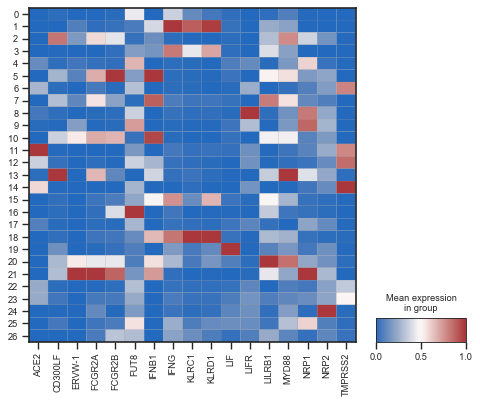

lung_parenchyma_lower_lobe_of_right_lung_normal


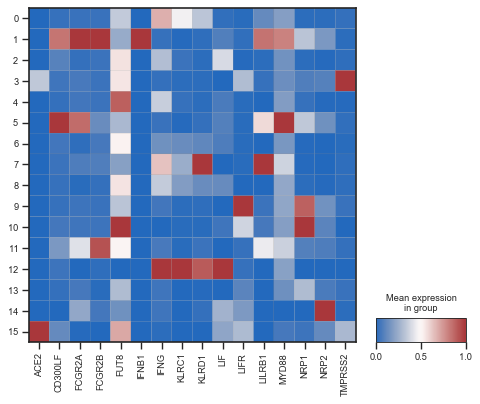

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


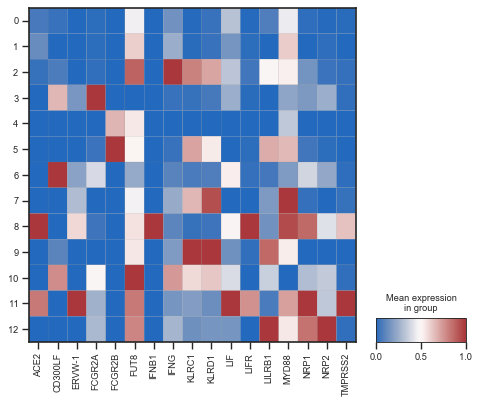

In [36]:
sc.set_figure_params(figsize=(5,7),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
tmp_ADE_GENES=ADE_GENES[:]
tmp_ADE_GENES.append('nCoV')
fig_size=(7,5.5)
for k, v in organs_adata_dict.items():
    #if k!='Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder':continue
    tmp_markers_genes_list=[g for g in sorted(set(tmp_ADE_GENES).intersection(v.var['Gene']))]
    if len(tmp_markers_genes_list)>=1:
        print(k)
        tmp_out_fname=path.join(k+'_ade_genes_fig1c.pdf')
        tmp_fig=sc.pl.matrixplot(adata=v,groupby='louvain',gene_symbols='Gene',save=tmp_out_fname,
                                 use_raw=False,figsize=fig_size,var_names=tmp_markers_genes_list,
                                 standard_scale='var',cmap=HEATPLOT_PALETTE_CMAP,swap_axes=False,
                                 dendrogram=False)
    del k,v 


Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


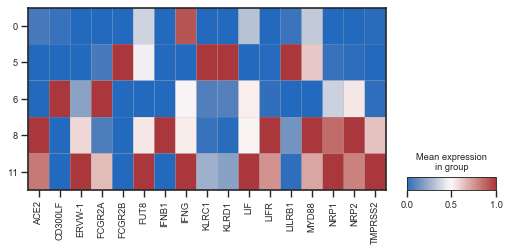

In [37]:
sc.set_figure_params(figsize=(5,7),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
tmp_ADE_GENES=ADE_GENES[:]
tmp_ADE_GENES.append('nCoV')
fig_size=(7.5,3)
subset_sps= ['0','5','6','8','11'] #['0','9','12','21','24'], None
for k, v in organs_adata_dict.items():
    if k!='Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder':continue
    print(k)
    tmp_markers_genes_list=[g for g in sorted(set(tmp_ADE_GENES).intersection(v.var['Gene']))]
    #v.obsubset_sps
    if len(tmp_markers_genes_list)>=1:
        if not subset_sps is None:
            v=v[v.obs.index[v.obs.louvain.isin(subset_sps)],:]
        tmp_out_fname='_'+k+'_ade_genes.pdf'
        tmp_fig=sc.pl.matrixplot(adata=v,groupby='louvain',
                                 gene_symbols='Gene',save=tmp_out_fname,
                                 use_raw=False,figsize=fig_size,var_names=tmp_markers_genes_list,
                                 standard_scale='var',cmap=HEATPLOT_PALETTE_CMAP,swap_axes=False,
                                 dendrogram=False)
    del k,v 

lung_parenchyma_lower_lobe_of_left_lung_normal


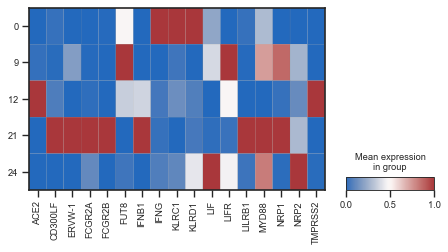

In [38]:
sc.set_figure_params(figsize=(5,7),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
tmp_ADE_GENES=ADE_GENES[:]
tmp_ADE_GENES.append('nCoV')
fig_size=(6.5,3)
subset_sps= ['0','9','12','21','24'] #['0','9','12','21','24'], None
for k, v in organs_adata_dict.items():
    if k!='lung_parenchyma_lower_lobe_of_left_lung_normal':continue
    print(k)
    tmp_markers_genes_list=[g for g in sorted(set(tmp_ADE_GENES).intersection(v.var['Gene']))]
    #v.obsubset_sps
    if len(tmp_markers_genes_list)>=1:
        if not subset_sps is None:
            v=v[v.obs.index[v.obs.louvain.isin(subset_sps)],:]
        tmp_out_fname='_'+k+'_ade_genes.pdf'
        tmp_fig=sc.pl.matrixplot(adata=v,groupby='louvain',
                                 gene_symbols='Gene',save=tmp_out_fname,
                                 use_raw=False,figsize=fig_size,var_names=tmp_markers_genes_list,
                                 standard_scale='var',cmap=HEATPLOT_PALETTE_CMAP,swap_axes=False,
                                 dendrogram=False)
    del k,v 


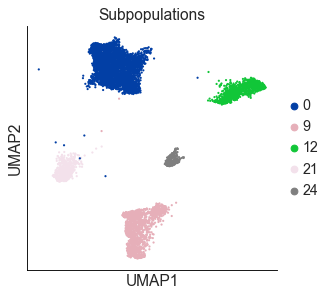

In [39]:
# Fix the color_map=LOUVAIN_SP_COLORS_DICT argument to pick the correct colors
sc.set_figure_params(figsize=None)
for k, v in organs_adata_dict.items():
    if k!='lung_parenchyma_lower_lobe_of_left_lung_normal':continue
    if not subset_sps is None:
            v=v[v.obs.index[v.obs.louvain.isin(subset_sps)],:]
    tmp_umap_fig=sc.pl.umap(adata=v,color='louvain',save=False,frameon=True,title='Subpopulations',
                            return_fig=True)
    sns.despine()
    #tmp_umap_fig.savefig('../figure/temp/umap'+'_'+k+'.pdf')

In [40]:
sc.set_figure_params(figsize=None)
for k, v in organs_adata_dict.items():
    print(k)
    #if k!='Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder':continue
    sc.tl.rank_genes_groups(adata=v,groupby='louvain',method='logreg',rankby_abs=True)
    organs_adata_dict[k]=v
    del k,v 

ranking genes


lung_parenchyma_lower_lobe_of_left_lung_normal


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:04:28)
ranking genes


lung_parenchyma_lower_lobe_of_right_lung_normal


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:22)
ranking genes


Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:37)


In [41]:
for k, v in organs_adata_dict.items():
    print(k)
    print(v.shape)
    print()
    del k,v

lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



ranking genes


lung_parenchyma_lower_lobe_of_left_lung_normal


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:15)
ranking genes


lung_parenchyma_lower_lobe_of_right_lung_normal


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)
ranking genes


Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


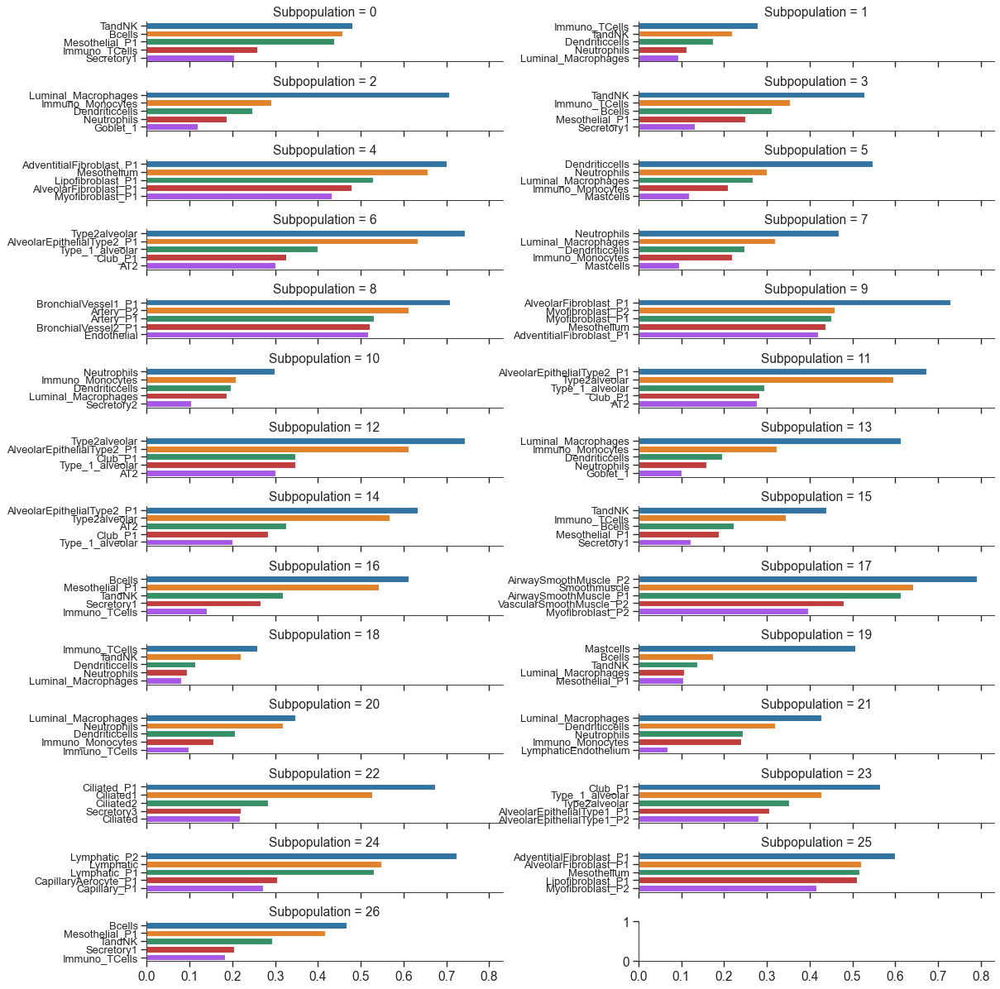

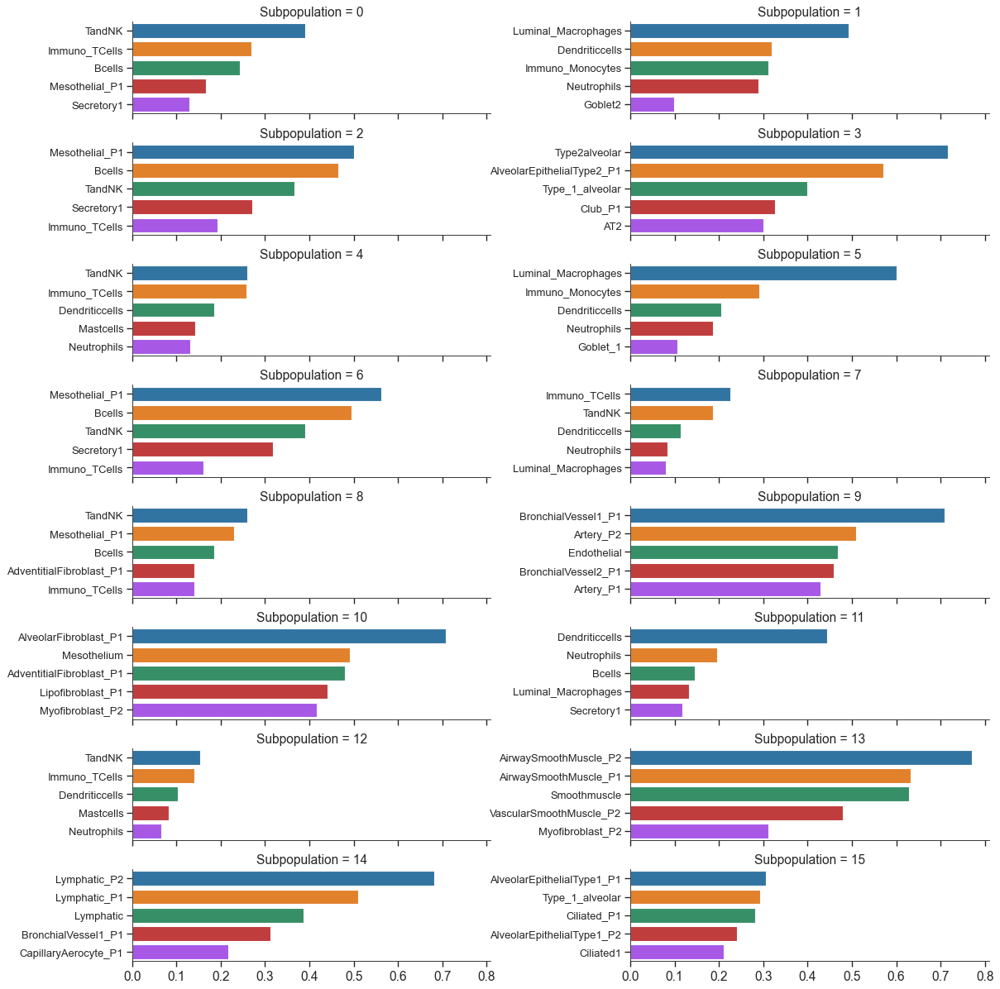

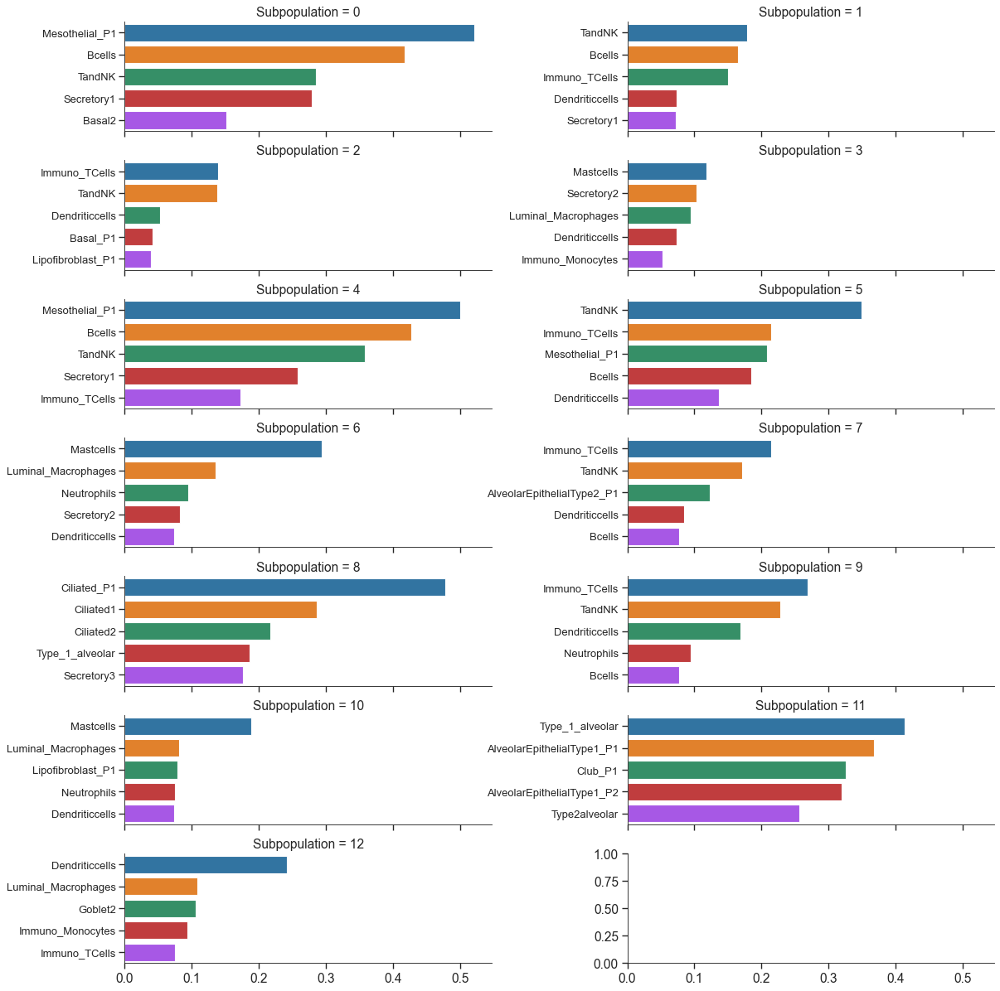

In [42]:
# fix palette=TOP_CELL_TYPE_COLORS_DICT in the barplot
cell_types_prediction_normalization= 'reference' # 'reference', 'data'
gn_rank_groupby='louvain'
sns.set_style(style='ticks')
fig_size=(15,15)
out_df_lst=[]
for k, v in organs_adata_dict.items():
    print(k)
    sc.tl.rank_genes_groups(v, groupby=gn_rank_groupby, method='wilcoxon',use_raw=False)
    tmp_markers_dict=dict()
    for tk, tv in cell_type_markers_ensemble_id_dict.items():
        tmp_markers_dict[tk]=sorted(set(tv).intersection(v.var_names))
        
    temp_df=sc.tl.marker_gene_overlap(adata=v,reference_markers=tmp_markers_dict,
                                             top_n_markers=100,normalize=cell_types_prediction_normalization)
    temp_df['type']=temp_df.index.to_list()
    temp_df=temp_df.melt(id_vars='type',var_name='subpopulation', value_name='markers')
    temp_df['organ_part']=k
    temp_groups_dict=temp_df.groupby('subpopulation')
    tmp_no_groups=len(temp_groups_dict.groups.keys())
    tmp_tracker=0
    tmp_no_cols=2
    tmp_no_rows=tmp_no_groups//tmp_no_cols if tmp_no_groups%tmp_no_cols==0 else  (tmp_no_groups//tmp_no_cols)+1
    tmp_fig,ax =plt.subplots(nrows=tmp_no_rows,ncols=tmp_no_cols,sharex=True,sharey=False,squeeze=False,
                         **{'figsize':fig_size,'frameon':False})
    tmp_ax_index=[]
    for r in range(tmp_no_rows):
        for c in range(tmp_no_cols):
            tmp_ax_index.append([r,c])
    #tmp_cell_type_colors=sns.color_palette(palette='Set2',n_colors=len([t for t in temp_df.type.unique()]))
    #tmp_cell_type_colors_dict=dict(zip([t for t in temp_df.type.unique()],tmp_cell_type_colors))
    for sp in range(tmp_no_groups):
        tmp_grp_df=temp_groups_dict.get_group(name=str(sp))
        tmp_grp_df=tmp_grp_df.loc[pd.Series.sort_values(tmp_grp_df.markers,ascending=False).index,:].head(5)
        out_df_lst.append(tmp_grp_df)
        tmp_axis=ax[tmp_ax_index[sp][0],tmp_ax_index[sp][1]]
        sns.barplot(data=tmp_grp_df,dodge=False,ci=None,hue='type',x='markers',y='type',ax=tmp_axis)
        sns.despine()
        tmp_axis.legend().set_visible(False)
        tmp_axis.set_title('Subpopulation = '+str(sp))
        tmp_y_labels = tmp_axis.get_yticklabels()
        #tmp_axis.set_xticklabels()
        tmp_axis.set_yticklabels(tmp_y_labels,fontdict={'fontsize':'small'})
        #plt.Axes.set_frame_on(False)
        tmp_axis.set_ylabel('')
        tmp_axis.set_xlabel('')
        tmp_fig.tight_layout(pad=0.75)
        tmp_out_fname=path.join(expt_figdir,k+'_cell_types_barplots.pdf')
        tmp_fig.savefig(tmp_out_fname)
        del tmp_grp_df
    del k,v,tmp_markers_dict
       

In [43]:
for k, v in organs_adata_dict.items():
    print(k)
    print(v.shape)
    print()

lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



In [44]:
tmp_df=pd.concat(out_df_lst)
del out_df_lst
tmp_df.head()

,type,subpopulation,markers,organ_part
58,TandNK,0,0.479675,lung_parenchyma_lower_lobe_of_left_lung_normal
16,Bcells,0,0.456311,lung_parenchyma_lower_lobe_of_left_lung_normal
47,Mesothelial_P1,0,0.437500,lung_parenchyma_lower_lobe_of_left_lung_normal
37,Immuno_TCells,0,0.258065,lung_parenchyma_lower_lobe_of_left_lung_normal
54,Secretory1,0,0.204082,lung_parenchyma_lower_lobe_of_left_lung_normal


In [45]:
sps_predicted_types_dict=dict()
for k, v in tmp_df.groupby(['organ_part','subpopulation']):
    tmp_dict={k[1]:v['type'].to_list()[0:2]}
    if k[0] in sps_predicted_types_dict:
        sps_predicted_types_dict[k[0]].update(tmp_dict)
    else:
        sps_predicted_types_dict[k[0]]=tmp_dict
    del tmp_dict
    
del tmp_df
sps_predicted_types_dict


{'Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder': {'0': ['Mesothelial_P1',
   'Bcells'],
  '1': ['TandNK', 'Bcells'],
  '10': ['Mastcells', 'Luminal_Macrophages'],
  '11': ['Type_1_alveolar', 'AlveolarEpithelialType1_P1'],
  '12': ['Dendriticcells', 'Luminal_Macrophages'],
  '2': ['Immuno_TCells', 'TandNK'],
  '3': ['Mastcells', 'Secretory2'],
  '4': ['Mesothelial_P1', 'Bcells'],
  '5': ['TandNK', 'Immuno_TCells'],
  '6': ['Mastcells', 'Luminal_Macrophages'],
  '7': ['Immuno_TCells', 'TandNK'],
  '8': ['Ciliated_P1', 'Ciliated1'],
  '9': ['Immuno_TCells', 'TandNK']},
 'lung_parenchyma_lower_lobe_of_left_lung_normal': {'0': ['TandNK', 'Bcells'],
  '1': ['Immuno_TCells', 'TandNK'],
  '10': ['Neutrophils', 'Immuno_Monocytes'],
  '11': ['AlveolarEpithelialType2_P1', 'Type2alveolar'],
  '12': ['Type2alveolar', 'AlveolarEpithelialType2_P1'],
  '13': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '14': ['AlveolarEpithelialType2_P1', 'Type2alveolar'],
  '15': ['TandN

In [46]:
all_types=set()
for k, v in cell_type_markers_ensemble_id_dict.items():
    all_types.add(k)
for all_type in sorted(all_types):
    print(all_type)

AT1
AT2
AdventitialFibroblast_P1
AirwaySmoothMuscle_P1
AirwaySmoothMuscle_P2
AlveolarEpithelialType1_P1
AlveolarEpithelialType1_P2
AlveolarEpithelialType2_P1
AlveolarFibroblast_P1
Artery_P1
Artery_P2
Basal1
Basal2
Basal3
Basal_Mitotic
Basal_P1
Bcells
BronchialVessel1_P1
BronchialVessel2_P1
CapillaryAerocyte_P1
Capillary_P1
Ciliated
Ciliated1
Ciliated2
Ciliated_P1
Club
Club_P1
Dendriticcells
DifferentiatingBasal_P1
Endothelial
FOXN4
Fibroblast
Fibroblasts
Goblet
Goblet2
Goblet_1
Immuno_Monocytes
Immuno_TCells
Ionocyte
Ionocytes
Lipofibroblast_P1
Luminal_Macrophages
Lymphatic
LymphaticEndothelium
Lymphatic_P1
Lymphatic_P2
Mastcells
Mesothelial_P1
Mesothelium
Myofibroblast_P1
Myofibroblast_P2
Neutrophils
Pericyte_P1
ProliferatingBasal_P1
Secretory1
Secretory2
Secretory3
Smoothmuscle
TandNK
Type2alveolar
Type_1_alveolar
VascularSmoothMuscle_P2
Vein_P1


In [47]:
for k, v in organs_adata_dict.items():  
    print(k)
    print(v.shape)
    print()

lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



In [48]:
sc.set_figure_params(figsize=None)
for k, v in organs_adata_dict.items():
    print(k)
    for kl, l in v.obs.groupby('louvain'):
        print(kl,'(n=',l.shape[0],')')
    print()

lung_parenchyma_lower_lobe_of_left_lung_normal
0 (n= 4095 )
1 (n= 3539 )
2 (n= 3263 )
3 (n= 2837 )
4 (n= 2673 )
5 (n= 2459 )
6 (n= 1957 )
7 (n= 1813 )
8 (n= 1778 )
9 (n= 1566 )
10 (n= 1278 )
11 (n= 1246 )
12 (n= 1213 )
13 (n= 1171 )
14 (n= 1039 )
15 (n= 970 )
16 (n= 896 )
17 (n= 858 )
18 (n= 653 )
19 (n= 617 )
20 (n= 590 )
21 (n= 574 )
22 (n= 438 )
23 (n= 336 )
24 (n= 321 )
25 (n= 105 )
26 (n= 69 )

lung_parenchyma_lower_lobe_of_right_lung_normal
0 (n= 526 )
1 (n= 491 )
2 (n= 469 )
3 (n= 409 )
4 (n= 358 )
5 (n= 346 )
6 (n= 341 )
7 (n= 217 )
8 (n= 149 )
9 (n= 118 )
10 (n= 114 )
11 (n= 75 )
12 (n= 61 )
13 (n= 56 )
14 (n= 32 )
15 (n= 25 )

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
0 (n= 1268 )
1 (n= 914 )
2 (n= 807 )
3 (n= 801 )
4 (n= 744 )
5 (n= 737 )
6 (n= 575 )
7 (n= 550 )
8 (n= 517 )
9 (n= 453 )
10 (n= 264 )
11 (n= 253 )
12 (n= 128 )



In [49]:
tracker=0
ade_ensemble_dict=dict()
for k, v in ensemble_gn_hugo_name_dict.items():
    if not v in ADE_GENES:
        continue
    ade_ensemble_dict[k]=v
    tracker+=1
ade_ensemble_dict

{'ENSG00000242950': 'ERVW-1',
 'ENSG00000186074': 'CD300LF',
 'ENSG00000172936': 'MYD88',
 'ENSG00000277134': 'LILRB1',
 'ENSG00000134539': 'KLRD1',
 'ENSG00000128342': 'LIF',
 'ENSG00000184012': 'TMPRSS2',
 'ENSG00000033170': 'FUT8',
 'ENSG00000118257': 'NRP2',
 'ENSG00000277807': 'LILRB1',
 'ENSG00000113594': 'LIFR',
 'ENSG00000104972': 'LILRB1',
 'ENSG00000130234': 'ACE2',
 'ENSG00000111537': 'IFNG',
 'ENSG00000171855': 'IFNB1',
 'ENSG00000072694': 'FCGR2B',
 'ENSG00000274669': 'LILRB1',
 'ENSG00000134545': 'KLRC1',
 'ENSG00000143226': 'FCGR2A',
 'ENSG00000276452': 'LILRB1',
 'ENSG00000099250': 'NRP1'}

In [50]:
target_celltypes_lst=['AlveolarEpithelialType1_P1','AlveolarEpithelialType1_P2',
                      'AlveolarEpithelialType2_P1','AlveolarFibroblast_P1','Ciliated','Ciliated1',
                      'Ciliated2','Ciliated_P1','Type2alveolar','Type_1_alveolar']
for k, v in organs_adata_dict.items():
    print(k)
    tracker=0
    for kl, l in v.obs.groupby('louvain'):
        if len(set(sps_predicted_types_dict[k][kl]).intersection(target_celltypes_lst))==0:continue
        print(kl,sps_predicted_types_dict[k][kl])
        print(kl,'(n=',l.shape[0],')')
        tracker+=l.shape[0]
    print('Total cells:',tracker)
    print()

lung_parenchyma_lower_lobe_of_left_lung_normal
6 ['Type2alveolar', 'AlveolarEpithelialType2_P1']
6 (n= 1957 )
9 ['AlveolarFibroblast_P1', 'Myofibroblast_P2']
9 (n= 1566 )
11 ['AlveolarEpithelialType2_P1', 'Type2alveolar']
11 (n= 1246 )
12 ['Type2alveolar', 'AlveolarEpithelialType2_P1']
12 (n= 1213 )
14 ['AlveolarEpithelialType2_P1', 'Type2alveolar']
14 (n= 1039 )
22 ['Ciliated_P1', 'Ciliated1']
22 (n= 438 )
23 ['Club_P1', 'Type_1_alveolar']
23 (n= 336 )
25 ['AdventitialFibroblast_P1', 'AlveolarFibroblast_P1']
25 (n= 105 )
Total cells: 7900

lung_parenchyma_lower_lobe_of_right_lung_normal
3 ['Type2alveolar', 'AlveolarEpithelialType2_P1']
3 (n= 409 )
10 ['AlveolarFibroblast_P1', 'Mesothelium']
10 (n= 114 )
15 ['AlveolarEpithelialType1_P1', 'Type_1_alveolar']
15 (n= 25 )
Total cells: 548

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
8 ['Ciliated_P1', 'Ciliated1']
8 (n= 517 )
11 ['Type_1_alveolar', 'AlveolarEpithelialType1_P1']
11 (n= 253 )
Total cells: 770



In [51]:
target_celltypes_lst=['AlveolarEpithelialType1_P1','AlveolarEpithelialType1_P2',
                      'AlveolarEpithelialType2_P1','AlveolarFibroblast_P1','Ciliated','Ciliated1',
                      'Ciliated2','Ciliated_P1','Type2alveolar','Type_1_alveolar']
subset_cells=300 
min_cells_detected=3
counts_per_cell_after=10000
grouping='derived_organ_parts_label'
out_df_lst=[]
iterations=100
temp_dict={'lung parenchyma;lower lobe of left lung':'normal',
'lung parenchyma;lower lobe of right lung':'normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}

temp_dict={'lung parenchyma;lower lobe of left lung':'Left normal',
'lung parenchyma;lower lobe of right lung':'Right normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}

col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}
for it in range(iterations):
    print('replicate:',it+1)
    selected_samples=[]
    for k, v in organs_adata_dict.items():  
        print(k)
        subset_sps=None
        for tk,tv in sps_predicted_types_dict[k].items():
            if len(set(tv).intersection(target_celltypes_lst))==0:continue
            if subset_sps is None:
                subset_sps=[]
            subset_sps.append(tk)
        if not subset_cells is None and not subset_sps is None:
            tmp_diff_samples=v.obs.index[v.obs.louvain.isin(subset_sps)].tolist()
            if len(tmp_diff_samples)>subset_cells:
                tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
                #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
                selected_samples.extend(tmp_diff_samples)
            else:
                selected_samples.extend(tmp_diff_samples)
            del tmp_diff_samples
        else:
            selected_samples.extend(v.obs.index.to_list())
            
    organ_diff_adata=organ_adata[selected_samples,:]
    print(organ_diff_adata.shape)
    tmp_organ_genes=organ_diff_adata.var[organ_diff_adata.var.featuretype=='protein_coding'].index
    organ_diff_adata=organ_diff_adata[:,tmp_organ_genes]
    #sc.pp.filter_genes(data=organ_diff_adata,min_cells=min_cells_detected)
    sc.pp.calculate_qc_metrics(adata=organ_diff_adata,inplace=True)
    organ_diff_adata.raw=organ_diff_adata
    sc.pp.normalize_per_cell(organ_diff_adata,counts_per_cell_after=counts_per_cell_after)
    print(organ_diff_adata.shape)
    print()
    organ_diff_adata.obs['disease_state']=[temp_dict[o] for o in organ_diff_adata.obs['derived_organ_parts_label']]
    organ_diff_adata=organ_diff_adata[:,organ_diff_adata.var_names[organ_diff_adata.var_names.isin(ade_ensemble_dict)]]
    test_df=organ_diff_adata.to_df()
    test_df['cell_id']=test_df.index.to_list()
    test_df['disease_state']=organ_diff_adata.obs['disease_state'].to_list()
    test_df=test_df.melt(id_vars=['cell_id','disease_state'])
    test_df['gene_name']=[ade_ensemble_dict[gn] if gn in ade_ensemble_dict else 'nan' for gn in test_df['Accession']]
    test_df['replicate']=it+1
    out_df_lst.append(test_df)
    del test_df,organ_diff_adata,tmp_organ_genes
    
norm_cnts_df=pd.concat(out_df_lst)
del out_df_lst
norm_cnts_df['log1p_counts']=np.log1p(norm_cnts_df.value)
norm_cnts_df.head()    

replicate: 1
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 2
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 3
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 4
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 5
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 6
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 7
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 8
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 9
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 10
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 11
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 12
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 13
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 14
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 15
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 16
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 17
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 18
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 19
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 20
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 21
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 22
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 23
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 24
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 25
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 26
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 27
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 28
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 29
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 30
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 31
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 32
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 33
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 34
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 35
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 36
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 37
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 38
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 39
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 40
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 41
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 42
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 43
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 44
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 45
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 46
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 47
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 48
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 49
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 50
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 51
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 52
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 53
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 54
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 55
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 56
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 57
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 58
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 59
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 60
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 61
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 62
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 63
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 64
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 65
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 66
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 67
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 68
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 69
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 70
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 71
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 72
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 73
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 74
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 75
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 76
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 77
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 78
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 79
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 80
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 81
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 82
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 83
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 84
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 85
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 86
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 87
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 88
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 89
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 90
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 91
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 92
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 93
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 94
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 95
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 96
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 97
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 98
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Trying to set attribute `.obs` of view, copying.


(900, 19865)

replicate: 99
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)

replicate: 100
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(900, 58347)


Trying to set attribute `.obs` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


(900, 19865)



,cell_id,disease_state,Accession,value,gene_name,replicate,log1p_counts
0,7044492fb30052574f71aa2bbb1fb79d,Left normal,ENSG00000033170,0.715871,FUT8,1,0.539921
1,5755be0828f410b8da58a5730b504b02,Left normal,ENSG00000033170,0.000000,FUT8,1,0.000000
2,7e6890be943a66abd13560a19c917113,Left normal,ENSG00000033170,0.562335,FUT8,1,0.446181
3,a8bc0145d486fd5b139c19d1c1ceeb6f,Left normal,ENSG00000033170,1.487210,FUT8,1,0.911162
4,d653fa279f9f0fd837cf98bac23f6e04,Left normal,ENSG00000033170,0.000000,FUT8,1,0.000000


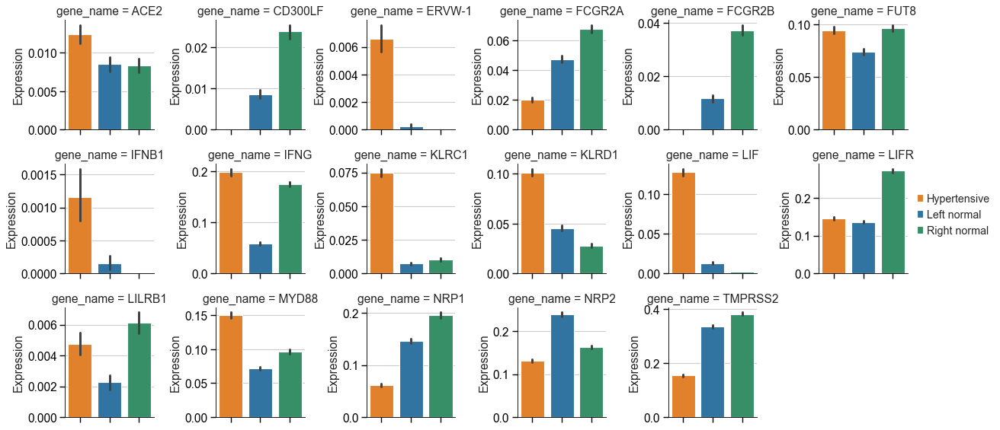

In [52]:
kind='bar'
col_wrap=6
col_dict={'Hypertensive':'#ff7f0e','normal':'#279e68',
          'normal':'#1f77b4'}
col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}
#col_dict={'Hypertensive':'#ff7f0e','normal':'#279e68'}
norm_cnts_df.sort_values(by='gene_name',inplace=True)
tmp_fig=sns.catplot(data=norm_cnts_df,col='gene_name',hue='disease_state',kind=kind,ci=95,dodge=False,
                    sharey=False,palette=col_dict,x='disease_state',height=2.5,y='log1p_counts',
                    col_wrap=col_wrap).add_legend()
for ax in tmp_fig.axes.flatten():
    #ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    ax.set_xticklabels('',rotation=90)
    ax.set_ylabel('Expression')
    ax.set_xlabel('')

In [53]:
#Select from any subpopulation

In [54]:
subset_cells=300
min_cells_detected=3
grouping='derived_organ_parts_label'
out_df_lst=[]
iterations=100
counts_per_cell_after=10000
temp_dict={'lung parenchyma;lower lobe of left lung':'normal',
'lung parenchyma;lower lobe of right lung':'normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}

temp_dict={'lung parenchyma;lower lobe of left lung':'Left normal',
'lung parenchyma;lower lobe of right lung':'Right normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}

col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}
for it in range(iterations):
    print('replicate:',it+1)
    selected_samples=[]
    for k, v in organs_adata_dict.items():  
        print(k)
        print(v.shape)
        print()
        if not subset_cells is None:
            selected_samples.extend(np.random.choice(v.obs.index.to_list(),size=subset_cells,replace=False))
        else:
            selected_samples.extend(v.obs.index.to_list())
            
    organ_diff_adata=organ_adata[selected_samples,:]
    #sc.pp.filter_genes(data=organ_diff_adata,min_cells=min_cells_detected)
    tmp_organ_genes=organ_diff_adata.var[organ_diff_adata.var.featuretype=='protein_coding'].index.to_list()
    organ_diff_adata=organ_diff_adata[:,tmp_organ_genes]
    #sc.pp.calculate_qc_metrics(adata=organ_diff_adata,inplace=True)
    organ_diff_adata.raw=organ_diff_adata
    sc.pp.normalize_per_cell(organ_diff_adata,counts_per_cell_after=counts_per_cell_after)
    organ_diff_adata.obs['disease_state']=[temp_dict[o] for o in organ_diff_adata.obs['derived_organ_parts_label']]
    organ_diff_adata=organ_diff_adata[:,organ_diff_adata.var_names[organ_diff_adata.var_names.isin(ade_ensemble_dict)]]
    test_df=organ_diff_adata.to_df()
    test_df['cell_id']=test_df.index.to_list()
    test_df['disease_state']=organ_diff_adata.obs['disease_state'].to_list()
    test_df=test_df.melt(id_vars=['cell_id','disease_state'])
    test_df['gene_name']=[ade_ensemble_dict[gn] if gn in ade_ensemble_dict else 'nan' for gn in test_df['Accession']]
    test_df['replicate']=it+1
    out_df_lst.append(test_df)
    del test_df,organ_diff_adata,selected_samples,tmp_organ_genes
    
norm_cnts_df=pd.concat(out_df_lst)
del out_df_lst
norm_cnts_df['log1p_counts']=np.log1p(norm_cnts_df.value)
norm_cnts_df.head()    


normalizing by total count per cell


replicate: 1
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 2
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 3
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 4
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 5
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 6
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 7
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 8
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 9
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 10
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell


replicate: 11
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 12
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 13
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 14
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 15
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 16
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell


replicate: 17
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 18
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 19
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 20
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 21
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 22
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 23
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 24
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 25
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 26
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 27
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 28
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 29
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 30
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 31
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 32
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 33
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 34
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 35
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 36
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 37
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 38
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 39
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 40
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 41
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 42
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 43
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 44
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 45
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 46
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 47
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 48
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 49
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 50
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 51
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 52
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 53
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 54
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 55
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 56
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 57
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 58
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 59
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 60
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 61
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 62
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 63
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 64
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 65
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 66
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 67
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 68
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 69
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 70
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 71
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 72
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 73
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 74
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 75
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 76
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 77
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 78
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 79
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 80
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 81
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 82
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 83
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 84
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 85
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 86
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 87
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 88
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 89
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 90
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 91
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 92
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 93
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 94
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 95
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


replicate: 96
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 97
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 98
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 99
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell


replicate: 100
lung_parenchyma_lower_lobe_of_left_lung_normal
(38354, 17787)

lung_parenchyma_lower_lobe_of_right_lung_normal
(3787, 15818)

Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder
(8011, 16842)



    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


,cell_id,disease_state,Accession,value,gene_name,replicate,log1p_counts
0,c947ded6314d874b0278845cda88625d,Left normal,ENSG00000033170,0.0,FUT8,1,0.0
1,9f14166eedaf0980311f7e58e1cef6f1,Left normal,ENSG00000033170,0.0,FUT8,1,0.0
2,507d21c5aecf721ce246bcac5b265880,Left normal,ENSG00000033170,0.0,FUT8,1,0.0
3,9883d81a6111a334e39c51f92ecaddd9,Left normal,ENSG00000033170,0.0,FUT8,1,0.0
4,0de92f2178f9731d5135a5003201e1ff,Left normal,ENSG00000033170,0.0,FUT8,1,0.0


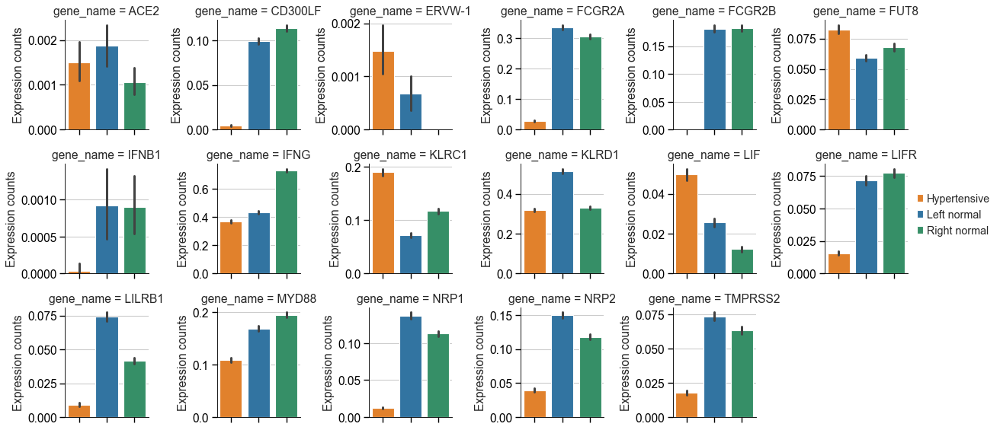

In [55]:
kind='bar'
col_wrap=6
col_dict={'Hypertensive':'#ff7f0e','normal':'#279e68',
          'normal':'#1f77b4'}
col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}
#col_dict={'Hypertensive':'#ff7f0e','normal':'#279e68'}
norm_cnts_df.sort_values(by='gene_name',inplace=True)
tmp_fig=sns.catplot(data=norm_cnts_df,col='gene_name',hue='disease_state',kind=kind,ci=95,dodge=False,
                    sharey=False,palette=col_dict,x='disease_state',height=2.5,y='log1p_counts',
                    col_wrap=col_wrap).add_legend()
for ax in tmp_fig.axes.flatten():
    #ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    ax.set_xticklabels('',rotation=90)
    ax.set_ylabel('Expression counts')
    ax.set_xlabel('')

In [56]:
# Gene ranking across cell subpopulations expression test

In [57]:
# Use 'right_normal' as normal

In [58]:
target_celltypes_lst=['AlveolarEpithelialType1_P1','AlveolarEpithelialType1_P2',
                      'AlveolarEpithelialType2_P1','AlveolarFibroblast_P1','Ciliated','Ciliated1',
                      'Ciliated2','Ciliated_P1','Type2alveolar','Type_1_alveolar']
subset_cells=300 
min_cells_detected=1
counts_per_cell_after=10000
grouping='derived_organ_parts_label'
diff_res_lst=[]
iterations=100
reference_grp='right_normal'
rank_groupby='disease_state'
rank_method='wilcoxon'
rank_corr_method='benjamini-hochberg'
temp_dict={'lung parenchyma;lower lobe of left lung':'Left normal',
'lung parenchyma;lower lobe of right lung':'Right normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}

col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}
for it in range(iterations):
    print('replicate:',it+1)
    tmp_diff_adata_lst=[]
    for k, v in organs_adata_dict.items():  
        selected_samples=[]
        subset_sps=None
        for tk,tv in sps_predicted_types_dict[k].items():
            if len(set(tv).intersection(target_celltypes_lst))==0:continue
            if subset_sps is None:
                subset_sps=[]
            subset_sps.append(tk)
        if not subset_cells is None and not subset_sps is None:
            tmp_diff_samples=v.obs.index[v.obs.louvain.isin(subset_sps)].tolist()
            if len(tmp_diff_samples)>subset_cells:
                tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
                #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
                selected_samples.extend(tmp_diff_samples)
            else:
                selected_samples.extend(tmp_diff_samples)
            del tmp_diff_samples 
        else:
            selected_samples.extend(v.obs.index.to_list())
        v=organ_adata[selected_samples,:]
        tmp_diff_adata_lst.append(v)
        del v,selected_samples
    tmp_diff_adata=tmp_diff_adata_lst[0].concatenate(tmp_diff_adata_lst[1::])
    del tmp_diff_adata_lst
    tmp_organ_genes=tmp_diff_adata.var[tmp_diff_adata.var.featuretype=='protein_coding'].index.to_list()
    tmp_diff_adata=tmp_diff_adata[:,tmp_organ_genes]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected)
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby=rank_groupby, use_raw=False, 
                            method=rank_method,corr_method=rank_corr_method, n_genes=None,
                            reference=reference_grp)
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj',
                                                'logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=it+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
    del test_array,temp_params_dict,tmp_names_df,tmp_scores_df,tmp_pvals_df,tmp_pvals_adj_df,tmp_lfc_df
    
hca_diff_res_df=pd.concat(diff_res_lst)  
del diff_res_lst
hca_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in hca_diff_res_df.names]



replicate: 1


filtered out 3121 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 2


filtered out 3052 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 3


filtered out 3148 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 4


filtered out 3038 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 5


filtered out 3045 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 6


filtered out 3082 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 7


filtered out 3111 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 8


filtered out 3107 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 9


filtered out 3129 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 10


filtered out 3040 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 11


filtered out 3071 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 12


filtered out 3132 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 13


filtered out 3083 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 14


filtered out 3109 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 15


filtered out 3128 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 16


filtered out 3035 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 17


filtered out 3061 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 18


filtered out 3156 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 19


filtered out 3108 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 20


filtered out 3125 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 21


filtered out 3136 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 22


filtered out 3156 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 23


filtered out 3111 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 24


filtered out 3106 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 25


filtered out 3097 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 26


filtered out 3122 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 27


filtered out 3081 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 28


filtered out 3103 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 29


filtered out 3102 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 30


filtered out 3128 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 31


filtered out 3136 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 32


filtered out 3087 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 33


filtered out 3107 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 34


filtered out 3078 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 35


filtered out 3089 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 36


filtered out 3169 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 37


filtered out 3101 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 38


filtered out 3072 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 39


filtered out 3112 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 40


filtered out 3104 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 41


filtered out 3107 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 42


filtered out 3121 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 43


filtered out 3107 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 44


filtered out 3101 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 45


filtered out 3083 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 46


filtered out 3105 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 47


filtered out 3129 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 48


filtered out 3103 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 49


filtered out 3152 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 50


filtered out 3090 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 51


filtered out 3107 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 52


filtered out 3099 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 53


filtered out 3130 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 54


filtered out 3146 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 55


filtered out 3086 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 56


filtered out 3083 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 57


filtered out 3139 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 58


filtered out 3076 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 59


filtered out 3112 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 60


filtered out 3079 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 61


filtered out 3163 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 62


filtered out 3163 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 63


filtered out 3095 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 64


filtered out 3126 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 65


filtered out 3132 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 66


filtered out 3140 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 67


filtered out 3128 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 68


filtered out 3142 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 69


filtered out 3113 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 70


filtered out 3078 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 71


filtered out 3028 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 72


filtered out 3130 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 73


filtered out 3103 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 74


filtered out 3028 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 75


filtered out 3050 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 76


filtered out 3136 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 77


filtered out 3108 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 78


filtered out 3071 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 79


filtered out 3111 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 80


filtered out 3055 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 81


filtered out 3099 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 82


filtered out 3114 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 83


filtered out 3154 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 84


filtered out 3074 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 85


filtered out 3117 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 86


filtered out 3095 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 87


filtered out 3120 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 88


filtered out 3091 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 89


filtered out 3172 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 90


filtered out 3152 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 91


filtered out 3112 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 92


filtered out 3145 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 93


filtered out 3106 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 94


filtered out 3093 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 95


filtered out 3097 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 96


filtered out 3127 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 97


filtered out 3085 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 98


filtered out 3124 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 99


filtered out 3133 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 100


filtered out 3104 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

In [59]:
groupby=['hgnc_symbol','comparison']
tmp_df=hca_diff_res_df[hca_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'right_normal_vs_hypertensive')
pvals: 0.9421754566836019
pvals_adj: 1.0
logfoldchanges: 0.9588850140571594

('ACE2', 'right_normal_vs_left_normal')
pvals: 0.8876300645140318
pvals_adj: 1.0
logfoldchanges: 0.26557251811027527

('CD300LF', 'right_normal_vs_hypertensive')
pvals: 0.5248634815095027
pvals_adj: 0.970939184106235
logfoldchanges: -25.212800979614258

('CD300LF', 'right_normal_vs_left_normal')
pvals: 0.6722320185407524
pvals_adj: 1.0
logfoldchanges: -1.4529878497123718

('ERVW-1', 'right_normal_vs_hypertensive')
pvals: 0.8876300645140318
pvals_adj: 1.0
logfoldchanges: 23.56574821472168

('ERVW-1', 'right_normal_vs_left_normal')
pvals: 1.0
pvals_adj: 1.0
logfoldchanges: 0.0

('FCGR2A', 'right_normal_vs_hypertensive')
pvals: 0.18370612770773137
pvals_adj: 0.5060594780197751
logfoldchanges: -1.6137807369232178

('FCGR2A', 'right_normal_vs_left_normal')
pvals: 0.5393945122175463
pvals_adj: 1.0
logfoldchanges: -0.478926420211792

('FCGR2B', 'right_normal_vs_hypertensive')


In [60]:
# Use 'left_normal' as normal

In [61]:
target_celltypes_lst=['AlveolarEpithelialType1_P1','AlveolarEpithelialType1_P2',
                      'AlveolarEpithelialType2_P1','AlveolarFibroblast_P1','Ciliated','Ciliated1',
                      'Ciliated2','Ciliated_P1','Type2alveolar','Type_1_alveolar']
subset_cells=300 
min_cells_detected=1
counts_per_cell_after=10000
grouping='derived_organ_parts_label'
diff_res_lst=[]
iterations=100
reference_grp='left_normal'
rank_groupby='disease_state'
rank_method='wilcoxon'
rank_corr_method='benjamini-hochberg'
temp_dict={'lung parenchyma;lower lobe of left lung':'normal',
'lung parenchyma;lower lobe of right lung':'normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}

temp_dict={'lung parenchyma;lower lobe of left lung':'Left normal',
'lung parenchyma;lower lobe of right lung':'Right normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}

col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}
for it in range(iterations):
    print('replicate:',it+1)
    tmp_diff_adata_lst=[]
    for k, v in organs_adata_dict.items():  
        print(k)
        selected_samples=[]
        subset_sps=None
        for tk,tv in sps_predicted_types_dict[k].items():
            if len(set(tv).intersection(target_celltypes_lst))==0:continue
            if subset_sps is None:
                subset_sps=[]
            subset_sps.append(tk)
        if not subset_cells is None and not subset_sps is None:
            tmp_diff_samples=v.obs.index[v.obs.louvain.isin(subset_sps)].tolist()
            if len(tmp_diff_samples)>subset_cells:
                tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
                #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
                selected_samples.extend(tmp_diff_samples)
            else:
                selected_samples.extend(tmp_diff_samples)
            del tmp_diff_samples 
        else:
            selected_samples.extend(v.obs.index.to_list())
        v=organ_adata[selected_samples,:]
        tmp_diff_adata_lst.append(v)
        del v,selected_samples
    tmp_diff_adata=tmp_diff_adata_lst[0].concatenate(tmp_diff_adata_lst[1::])
    del tmp_diff_adata_lst
    tmp_organ_genes=tmp_diff_adata.var[tmp_diff_adata.var.featuretype=='protein_coding'].index.to_list()
    tmp_diff_adata=tmp_diff_adata[:,tmp_organ_genes]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected)
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby=rank_groupby, use_raw=False, 
                            method=rank_method,corr_method=rank_corr_method, n_genes=None,
                            reference=reference_grp)
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj',
                                                'logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=it+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
    del test_array,temp_params_dict,tmp_names_df,tmp_scores_df,tmp_pvals_df,tmp_pvals_adj_df,tmp_lfc_df
    
hca_diff_res_df=pd.concat(diff_res_lst)  
del diff_res_lst
hca_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in hca_diff_res_df.names]
hca_diff_res_df.head()

replicate: 1
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3053 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 2
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3145 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 3
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3059 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 4
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3086 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 5
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3047 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 6
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3116 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 7
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3109 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 8
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3093 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 9
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3068 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 10
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3103 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 11
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3155 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 12
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3078 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 13
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3165 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 14
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3131 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 15
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3131 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 16
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3123 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 17
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3154 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 18
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3115 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 19
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3096 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 20
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3116 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 21
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3079 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 22
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3168 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 23
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3135 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 24
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3187 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 25
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3159 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 26
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3085 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 27
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3153 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 28
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3136 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 29
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3078 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 30
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3159 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 31
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3135 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 32
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3107 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 33
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3114 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 34
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3124 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 35
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3114 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 36
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3118 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 37
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3117 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 38
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3138 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 39
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3155 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 40
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3033 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 41
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3078 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 42
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3124 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 43
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3119 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 44
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3084 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 45
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3097 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 46
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3095 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 47
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3108 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 48
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3128 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 49
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3069 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 50
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3109 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 51
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3147 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 52
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3124 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 53
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3147 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 54
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3121 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 55
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3132 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 56
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3085 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 57
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3138 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 58
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3091 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 59
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3112 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 60
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3111 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 61
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3078 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 62
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3110 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 63
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3157 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 64
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3130 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 65
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3079 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 66
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3109 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 67
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3087 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 68
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3086 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 69
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3145 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 70
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3155 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 71
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3124 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 72
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3137 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 73
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3123 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 74
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3160 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 75
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3144 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 76
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3152 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 77
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3105 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 78
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3043 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 79
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3088 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 80
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3054 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 81
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3142 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 82
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3098 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 83
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3123 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 84
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3059 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 85
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3063 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 86
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3118 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 87
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3093 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 88
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3048 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 89
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3085 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 90
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3135 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 91
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3106 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 92
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3117 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 93
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3096 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 94
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3093 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 95
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3083 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 96
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3169 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 97
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3112 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 98
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3101 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

replicate: 99
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3113 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o

replicate: 100
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3094 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.

,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000101421,16.5999,6.9828e-62,5.86974e-58,8.40593,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,1,left_normal_vs_hypertensive,1,CHMP4B
1,ENSG00000087074,16.464,6.65588e-61,2.79747e-57,17.8043,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,2,left_normal_vs_hypertensive,1,PPP1R15A
2,ENSG00000125347,16.31,8.38283e-60,2.01332e-56,10.5188,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,3,left_normal_vs_hypertensive,1,IRF1
3,ENSG00000135046,16.2622,1.83146e-59,3.84882e-56,26.4644,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,4,left_normal_vs_hypertensive,1,ANXA1
4,ENSG00000116717,15.3378,4.27405e-53,5.98794e-50,13.7388,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,5,left_normal_vs_hypertensive,1,GADD45A


In [62]:
groupby=['hgnc_symbol','comparison']
tmp_df=hca_diff_res_df[hca_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'left_normal_vs_hypertensive')
pvals: 0.8883742741890254
pvals_adj: 1.0
logfoldchanges: 0.41381242871284485

('ACE2', 'left_normal_vs_right_normal')
pvals: 0.9153639571368875
pvals_adj: 1.0
logfoldchanges: -0.19106224179267883

('CD300LF', 'left_normal_vs_hypertensive')
pvals: 0.7774778803789417
pvals_adj: 1.0
logfoldchanges: -23.51464557647705

('CD300LF', 'left_normal_vs_right_normal')
pvals: 0.7214240604301438
pvals_adj: 1.0
logfoldchanges: 1.457620620727539

('ERVW-1', 'left_normal_vs_hypertensive')
pvals: 0.8876300645140318
pvals_adj: 1.0
logfoldchanges: 23.432133674621582

('ERVW-1', 'left_normal_vs_right_normal')
pvals: 1.0
pvals_adj: 1.0
logfoldchanges: 0.0

('FCGR2A', 'left_normal_vs_hypertensive')
pvals: 0.4390058965727084
pvals_adj: 0.8979229959658978
logfoldchanges: -1.1692818403244019

('FCGR2A', 'left_normal_vs_right_normal')
pvals: 0.534115429782565
pvals_adj: 1.0
logfoldchanges: 0.44217753410339355

('FCGR2B', 'left_normal_vs_hypertensive')
pvals: 0.72389418191

In [64]:
# Ranking analysis without specific subpopulation

In [65]:
subset_cells=300 
min_cells_detected=1
counts_per_cell_after=10000
grouping='derived_organ_parts_label'
diff_res_lst=[]
iterations=100
reference_grp='left_normal'
rank_groupby='disease_state'
rank_method='wilcoxon'
rank_corr_method='benjamini-hochberg'
temp_dict={'lung parenchyma;lower lobe of left lung':'Left normal',
'lung parenchyma;lower lobe of right lung':'Right normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}
col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}

for it in range(iterations):
    print('replicate:',it+1)
    tmp_diff_adata_lst=[]
    for k, v in organs_adata_dict.items():  
        print(k)
        selected_samples=[]
        tmp_diff_samples=v.obs.index.tolist()
        if not subset_cells is None and len(tmp_diff_samples)> subset_cells:
            tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
            selected_samples.extend(tmp_diff_samples)
        else:
            selected_samples.extend(tmp_diff_samples)
        del tmp_diff_samples
        v=organ_adata[selected_samples,:]
        tmp_diff_adata_lst.append(v)
        del v,selected_samples
    tmp_diff_adata=tmp_diff_adata_lst[0].concatenate(tmp_diff_adata_lst[1::])
    del tmp_diff_adata_lst
    tmp_organ_genes=tmp_diff_adata.var[tmp_diff_adata.var.featuretype=='protein_coding'].index.to_list()
    tmp_diff_adata=tmp_diff_adata[:,tmp_organ_genes]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected)
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby=rank_groupby, use_raw=False, 
                            method=rank_method,corr_method=rank_corr_method, n_genes=None,
                            reference=reference_grp)
    print()
    print(set(tmp_diff_adata.obs[rank_groupby]))
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj',
                                                'logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=it+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
    del test_array,temp_params_dict,tmp_names_df,tmp_scores_df,tmp_pvals_df,tmp_pvals_adj_df,tmp_lfc_df
    
hca_diff_res_df=pd.concat(diff_res_lst)  
del diff_res_lst
hca_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in hca_diff_res_df.names]
hca_diff_res_df.head()


replicate: 1
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3789 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 2
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3802 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 3
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3767 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 4
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3872 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 5
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3848 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 6
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3810 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 7
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3821 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 8
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3951 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 9
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3973 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 10
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3863 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 11
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3835 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 12
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3844 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 13
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3812 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 14
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3859 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 15
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3714 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 16
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3868 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 17
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3830 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 18
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3724 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 19
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3937 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 20
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3869 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 21
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3846 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 22
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3809 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 23
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3739 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 24
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3846 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 25
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3830 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 26
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3854 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 27
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3787 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 28
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3811 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 29
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3804 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 30
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3769 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 31
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3918 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 32
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3858 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 33
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3858 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 34
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3826 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 35
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3992 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 36
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3831 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 37
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3849 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 38
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3830 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 39
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3919 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 40
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3853 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 41
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3870 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 42
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3871 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 43
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3761 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 44
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3853 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 45
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3839 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 46
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3896 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 47
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3823 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 48
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3875 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 49
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3928 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 50
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3819 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 51
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3861 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 52
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3835 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 53
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3727 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 54
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3904 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 55
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3859 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 56
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3833 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 57
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3806 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 58
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3795 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 59
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3795 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 60
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3813 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 61
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3845 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 62
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3870 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 63
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3865 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 64
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3904 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 65
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3857 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 66
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3897 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 67
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3812 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 68
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3661 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 69
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3865 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 70
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3820 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 71
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3838 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 72
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3847 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 73
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3939 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 74
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3906 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 75
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3974 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 76
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3884 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 77
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3895 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 78
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3853 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 79
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3780 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 80
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3821 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 81
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 82
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3803 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 83
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3751 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 84
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3787 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 85
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3759 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 86
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3826 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 87
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3904 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 88
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 89
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3793 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 90
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3833 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 91
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3889 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 92
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 93
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3832 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 94
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3802 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 95
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 96
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3808 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 97
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3820 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 98
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3838 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 99
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3819 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 100
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3741 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}


,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000198918,17.496,1.53738e-68,2.47149e-64,53.2086,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,1,left_normal_vs_hypertensive,1,RPL39
1,ENSG00000241343,16.1333,1.48743e-58,7.97063e-55,25.5758,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,2,left_normal_vs_hypertensive,1,RPL36A
2,ENSG00000213741,14.0456,8.19908e-45,1.88298e-41,41.2862,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,3,left_normal_vs_hypertensive,1,RPS29
3,ENSG00000229117,13.5586,7.05101e-42,1.13352e-38,56.9344,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,4,left_normal_vs_hypertensive,1,RPL41
4,ENSG00000129824,12.7776,2.18664e-37,2.92936e-34,6.59796,disease_state,left_normal,wilcoxon,False,None,benjamini-hochberg,5,left_normal_vs_hypertensive,1,RPS4Y1


In [66]:
groupby=['hgnc_symbol','comparison']
tmp_df=hca_diff_res_df[hca_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'left_normal_vs_hypertensive')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: -0.43233463168144226

('ACE2', 'left_normal_vs_right_normal')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: -1.3887619972229004

('CD300LF', 'left_normal_vs_hypertensive')
pvals: 0.03160058561351867
pvals_adj: 0.273796883623839
logfoldchanges: -3.7944791316986084

('CD300LF', 'left_normal_vs_right_normal')
pvals: 0.5842431931008072
pvals_adj: 1.0
logfoldchanges: 0.17058129608631134

('ERVW-1', 'left_normal_vs_hypertensive')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 22.625791549682617

('ERVW-1', 'left_normal_vs_right_normal')
pvals: 1.0
pvals_adj: 1.0
logfoldchanges: 0.0

('FCGR2A', 'left_normal_vs_hypertensive')
pvals: 4.68387838389408e-06
pvals_adj: 0.00015682358042905443
logfoldchanges: -4.492060422897339

('FCGR2A', 'left_normal_vs_right_normal')
pvals: 0.5738513281862676
pvals_adj: 1.0
logfoldchanges: -0.3321225643157959

('FCGR2B', 'left_normal_vs_hypertensive')

In [67]:
subset_cells=300 
min_cells_detected=1
counts_per_cell_after=10000
grouping='derived_organ_parts_label'
diff_res_lst=[]
iterations=100
reference_grp='right_normal'
rank_groupby='disease_state'
rank_method='wilcoxon'
rank_corr_method='benjamini-hochberg'
temp_dict={'lung parenchyma;lower lobe of left lung':'normal',
'lung parenchyma;lower lobe of right lung':'normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}
temp_dict={'lung parenchyma;lower lobe of left lung':'Left normal',
'lung parenchyma;lower lobe of right lung':'Right normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}
col_dict={'Hypertensive':'#ff7f0e','Right normal':'#279e68',
          'Left normal':'#1f77b4'}

for it in range(iterations):
    print('replicate:',it+1)
    tmp_diff_adata_lst=[]
    for k, v in organs_adata_dict.items():  
        print(k)
        selected_samples=[]
        tmp_diff_samples=v.obs.index.tolist()
        if not subset_cells is None and len(tmp_diff_samples)> subset_cells:
            tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
            selected_samples.extend(tmp_diff_samples)
        else:
            selected_samples.extend(tmp_diff_samples)
        del tmp_diff_samples
        v=organ_adata[selected_samples,:]
        tmp_diff_adata_lst.append(v)
        del v,selected_samples
    tmp_diff_adata=tmp_diff_adata_lst[0].concatenate(tmp_diff_adata_lst[1::])
    del tmp_diff_adata_lst
    tmp_organ_genes=tmp_diff_adata.var[tmp_diff_adata.var.featuretype=='protein_coding'].index.to_list()
    tmp_diff_adata=tmp_diff_adata[:,tmp_organ_genes]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected)
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby=rank_groupby, use_raw=False, 
                            method=rank_method,corr_method=rank_corr_method, n_genes=None,
                            reference=reference_grp)
    print()
    print(set(tmp_diff_adata.obs[rank_groupby]))
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj',
                                                'logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=it+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
    del test_array,temp_params_dict,tmp_names_df,tmp_scores_df,tmp_pvals_df,tmp_pvals_adj_df,tmp_lfc_df
    
hca_diff_res_df=pd.concat(diff_res_lst)  
del diff_res_lst
hca_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in hca_diff_res_df.names]
hca_diff_res_df.head()


replicate: 1
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3859 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 2
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3928 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 3
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3785 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 4
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3846 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 5
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3810 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 6
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3940 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 7
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3777 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 8
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3885 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 9
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3726 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 10
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3835 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 11
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3792 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 12
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3809 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 13
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3812 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 14
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3987 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 15
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3725 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 16
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3772 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 17
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3855 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 18
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3816 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 19
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3896 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 20
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3863 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 21
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3887 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 22
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3804 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 23
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3754 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 24
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3810 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 25
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3932 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 26
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3900 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 27
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3865 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 28
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3799 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 29
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3845 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 30
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3892 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 31
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3825 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 32
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3840 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 33
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3773 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 34
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3784 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 35
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3845 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 36
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3900 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 37
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3830 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 38
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3852 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 39
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3905 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 40
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3846 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 41
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3824 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 42
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3799 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 43
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3844 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 44
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3793 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 45
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3806 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 46
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 4039 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 47
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3891 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 48
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3836 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 49
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3856 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 50
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3804 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 51
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 52
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3879 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 53
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3764 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 54
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3682 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 55
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3749 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 56
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3924 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 57
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3864 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 58
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3766 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 59
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3860 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 60
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3856 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 61
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3834 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 62
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3786 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 63
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3805 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 64
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3826 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 65
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3827 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 66
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3834 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 67
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3760 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 68
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3861 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 69
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3877 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 70
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3843 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 71
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3778 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 72
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3883 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 73
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3885 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 74
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3791 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 75
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3846 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 76
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3798 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 77
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3845 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 78
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3813 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 79
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3753 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 80
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3889 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 81
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3848 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 82
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3771 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 83
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3718 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 84
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3871 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 85
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3861 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 86
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3725 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 87
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3837 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 88
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3820 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 89
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3891 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 90
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3925 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 91
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3787 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 92
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3865 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 93
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3928 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 94
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3883 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 95
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3879 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 96
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3872 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 97
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3979 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 98
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 99
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3829 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_organ_parts_ontology' as categorical
.


{'left_normal', 'hypertensive', 'right_normal'}
replicate: 100
lung_parenchyma_lower_lobe_of_left_lung_normal
lung_parenchyma_lower_lobe_of_right_lung_normal
Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder


filtered out 3892 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'analysis_protocol.protocol_core.protocol_id' as categorical
... storing 'analysis_protocol.provenance.document_id' as categorical
... storing 'analysis_working_group_approval_status' as categorical
... storing 'barcode' as categorical
... storing 'bundle_uuid' as categorical
... storing 'bundle_version' as categorical
... storing 'cell_suspension.genus_species.ontology' as categorical
... storing 'cell_suspension.genus_species.ontology_label' as categorical
... storing 'cell_suspension.provenance.document_id' as categorical
... storing 'derived_organ_label' as categorical
... storing 'derived_organ_ontology' as categorical
... storing 'derived_organ_parts_label' as categorical
... storing 'derived_o


{'left_normal', 'hypertensive', 'right_normal'}


,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000197728,12.4491,1.41454e-35,7.54702e-33,10.7382,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,1,right_normal_vs_hypertensive,1,RPS26
1,ENSG00000140988,12.1665,4.6887e-34,2.34523e-31,43.9622,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,2,right_normal_vs_hypertensive,1,RPS2
2,ENSG00000184007,11.7058,1.18989e-31,5.60159e-29,5.24354,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,3,right_normal_vs_hypertensive,1,PTP4A2
3,ENSG00000089157,11.4689,1.89023e-30,7.7577e-28,18.764,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,4,right_normal_vs_hypertensive,1,RPLP0
4,ENSG00000074800,11.398,4.27719e-30,1.71152e-27,10.3693,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,5,right_normal_vs_hypertensive,1,ENO1


In [68]:
groupby=['hgnc_symbol','comparison']
tmp_df=hca_diff_res_df[hca_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'right_normal_vs_hypertensive')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 0.0

('ACE2', 'right_normal_vs_left_normal')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 0.0

('CD300LF', 'right_normal_vs_hypertensive')
pvals: 0.01097588200629427
pvals_adj: 0.12887029548928514
logfoldchanges: -4.1761474609375

('CD300LF', 'right_normal_vs_left_normal')
pvals: 0.5043508039078508
pvals_adj: 1.0
logfoldchanges: -0.31556594371795654

('ERVW-1', 'right_normal_vs_hypertensive')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 21.657133102416992

('ERVW-1', 'right_normal_vs_left_normal')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 0.0

('FCGR2A', 'right_normal_vs_hypertensive')
pvals: 1.3922028073575716e-05
pvals_adj: 0.00040204885257471624
logfoldchanges: -3.879995346069336

('FCGR2A', 'right_normal_vs_left_normal')
pvals: 0.5914955705457708
pvals_adj: 1.0
logfoldchanges: 0.3570702373981476

('FCGR2B', 'right_normal_vs_hypertensive')
pvals: 0.005

In [69]:
# Differential expression analysis using Libra methods (including: negative binomial and wilcoxan) 

In [120]:
target_celltypes_lst=['AlveolarEpithelialType1_P1','AlveolarEpithelialType1_P2',
                      'AlveolarEpithelialType2_P1','AlveolarFibroblast_P1','Ciliated','Ciliated1',
                      'Ciliated2','Ciliated_P1','Type2alveolar','Type_1_alveolar']
subset_cells=300 
min_cells_detected=3
grouping='derived_organ_parts_label'
diff_res_lst=[]
iterations=1000
temp_dict={'lung parenchyma;lower lobe of left lung':'Left normal',
'lung parenchyma;lower lobe of right lung':'Right normal',
'Left lateral basal bronchopulmonary segment':'Hypertensive'}
cell_type='alveolar_ciliated'
out_dir=path.join(str(sc.settings.writedir),'results/diff_expression_analysis/hca_replicates')
utils.safe_mkdir(out_dir)
tmp_dir=path.join(out_dir,cell_type)
utils.safe_mkdir(tmp_dir)

for it in range(iterations):
    print('replicate:',it+1)
    tmp_diff_adata_lst=[]
    for k, v in organs_adata_dict.items():  
        selected_samples=[]
        subset_sps=None
        for tk,tv in sps_predicted_types_dict[k].items():
            if len(set(tv).intersection(target_celltypes_lst))==0:continue
            if subset_sps is None:
                subset_sps=[]
            subset_sps.append(tk)
        if not subset_cells is None and not subset_sps is None:
            tmp_diff_samples=v.obs.index[v.obs.louvain.isin(subset_sps)].tolist()
            if len(tmp_diff_samples)>subset_cells:
                tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
                #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
                selected_samples.extend(tmp_diff_samples)
            else:
                selected_samples.extend(tmp_diff_samples)
            del tmp_diff_samples 
        else:
            selected_samples.extend(v.obs.index.to_list())
        v=organ_adata[selected_samples,:]
        
        tmp_diff_adata_lst.append(v)
        #del v,selected_samples
    tmp_diff_adata=tmp_diff_adata_lst[0].concatenate(tmp_diff_adata_lst[1::])
    del tmp_diff_adata_lst
    tmp_organ_genes=tmp_diff_adata.var[tmp_diff_adata.var.featuretype=='protein_coding'].index.to_list()
    tmp_diff_adata=tmp_diff_adata[:,tmp_organ_genes]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected)
    tmp_diff_adata.obs['label']=tmp_diff_adata.obs['disease_state'].to_list()
    tmp_diff_adata.obs['cell_type']=cell_type
    tmp_diff_adata.obs['replicate']=[temp_dict[rp] for rp in tmp_diff_adata.obs[grouping]]
    print(tmp_diff_adata.shape)
    for combn in itertools.combinations(set(tmp_diff_adata.obs['label']),2):
        print(combn)
        tmp_diff_out_adata=tmp_diff_adata[tmp_diff_adata.obs.label.isin(combn),:]
        sc.pp.filter_genes(data=tmp_diff_out_adata,min_cells=min_cells_detected)
        tmp_diff_out_adata=tmp_diff_out_adata[:,sorted(set(ade_ensembl_id_dict.keys()).intersection(tmp_diff_out_adata.var_names))]
        tmp_cnts_fname='_'.join(sorted(combn))+'_replicate_'+str(it+1)+'_'+cell_type+'_counts.tab.gz'
        tmp_meta_fname='_'.join(sorted(combn))+'_replicate_'+str(it+1)+'_'+cell_type+'_meta.tab.gz'
        tmp_cnts_out_fname=path.join(tmp_dir,tmp_cnts_fname)
        tmp_meta_fname=path.join(tmp_dir,tmp_meta_fname)
        tmp_diff_out_adata.to_df().transpose().to_csv(path_or_buf=tmp_cnts_out_fname,sep='\t',index=True)
        tmp_diff_out_adata.obs.loc[:,['label','replicate','cell_type']].to_csv(path_or_buf=tmp_meta_fname,sep='\t',index=True)
        del tmp_diff_out_adata
        
    del tmp_diff_adata
   

Directory already exists
Directory already exists
replicate: 1


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 466 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 2


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1119 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 3


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1131 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 351 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 4


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 5


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1013 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 6


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1012 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 478 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 7


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1035 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 8


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 9


filtered out 4498 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15367)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 10


filtered out 4538 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15327)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 11


filtered out 4518 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1095 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15347)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 12


filtered out 4515 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15350)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 13


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 14


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1129 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 365 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 15


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 482 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 16


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')


filtered out 1040 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 17


filtered out 4505 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 454 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15360)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 18


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 974 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 498 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 19


filtered out 4598 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15267)
('left_normal', 'hypertensive')


filtered out 979 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 462 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 20


filtered out 4624 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1093 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15241)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 21


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1119 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 22


filtered out 4537 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15328)
('left_normal', 'hypertensive')


filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 23


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1111 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 24


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1006 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 25


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 478 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')


filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 26


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 27


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 28


filtered out 4548 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15317)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 29


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1032 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 30


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 31


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')


filtered out 1083 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 32


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1133 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 33


filtered out 4518 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1036 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15347)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 34


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')


filtered out 1008 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 35


filtered out 4596 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1106 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15269)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 36


filtered out 4609 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 464 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1153 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15256)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 352 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 37


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')


filtered out 1010 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 38


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 39


filtered out 4525 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15340)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 40


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')


filtered out 1012 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 476 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 41


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1028 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 42


filtered out 4615 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1017 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15250)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 43


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')


filtered out 1042 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 44


filtered out 4522 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1032 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15343)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 45


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1017 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 46


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')


filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 47


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 48


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1146 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 359 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 49


filtered out 4636 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15229)
('left_normal', 'hypertensive')


filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 343 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 50


filtered out 4617 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1023 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15248)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 51


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 52


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')


filtered out 976 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 53


filtered out 4538 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 995 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15327)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 54


filtered out 4535 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15330)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 55


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')


filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 56


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1090 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 57


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 58


filtered out 4596 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15269)
('left_normal', 'hypertensive')


filtered out 1106 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 59


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 60


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1107 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 61


filtered out 4599 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15266)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 62


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 63


filtered out 4627 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1028 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15238)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 64


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 454 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 65


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1092 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 66


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1012 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 67


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1087 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 68


filtered out 4605 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15260)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 69


filtered out 4613 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15252)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 70


filtered out 4589 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1093 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15276)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 71


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1003 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 455 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 72


filtered out 4545 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15320)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 73


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 74


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')


filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 75


filtered out 4546 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15319)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 76


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 77


filtered out 4624 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15241)
('left_normal', 'hypertensive')


filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 78


filtered out 4644 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1092 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15221)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 79


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 80


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')


filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 81


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 82


filtered out 4541 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1146 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15324)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 83


filtered out 4516 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15349)
('left_normal', 'hypertensive')


filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 84


filtered out 4493 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15372)
('left_normal', 'hypertensive')


filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')


filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 85


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')


filtered out 1108 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')


filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 86


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')


filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 87


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 995 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 88


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 532 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1058 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 89


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1114 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 90


filtered out 4633 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1127 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15232)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 91


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1019 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 92


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1147 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 93


filtered out 4630 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1106 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15235)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 94


filtered out 4623 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1002 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15242)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 95


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 96


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')


filtered out 1012 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')


filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 97


filtered out 4597 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15268)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 98


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1088 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 99


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')


filtered out 1116 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 100


filtered out 4529 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15336)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 467 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 101


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 967 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 102


filtered out 4634 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15231)
('left_normal', 'hypertensive')


filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 103


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1118 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 104


filtered out 4642 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 491 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15223)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 105


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')


filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 106


filtered out 4559 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15306)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 107


filtered out 4522 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15343)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1035 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 108


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')


filtered out 1122 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 109


filtered out 4546 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 460 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15319)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 110


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 111


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1042 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 112


filtered out 4613 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 466 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15252)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 113


filtered out 4617 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15248)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 337 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 114


filtered out 4481 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15384)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 115


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 484 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1099 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 116


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 117


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 118


filtered out 4607 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1019 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15258)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 119


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 991 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 120


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1025 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 121


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 476 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')


filtered out 1095 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 122


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 123


filtered out 4644 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1004 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15221)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 124


filtered out 4474 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15391)
('left_normal', 'hypertensive')


filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 125


filtered out 4501 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15364)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 126


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1074 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 127


filtered out 4548 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15317)
('left_normal', 'hypertensive')


filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 128


filtered out 4492 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15373)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 129


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1095 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 130


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 131


filtered out 4627 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1006 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15238)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 132


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1106 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 133


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 134


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 135


filtered out 4622 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1121 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15243)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 339 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 136


filtered out 4524 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1119 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15341)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 137


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')


filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 138


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 139


filtered out 4595 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15270)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 140


filtered out 4491 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15374)
('left_normal', 'hypertensive')


filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 141


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1042 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 142


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 143


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 495 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')


filtered out 998 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 144


filtered out 4548 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1036 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15317)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 145


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1093 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 347 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 146


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')


filtered out 1113 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 147


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 148


filtered out 4659 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15206)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 149


filtered out 4515 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15350)
('left_normal', 'hypertensive')


filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 150


filtered out 4542 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15323)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 151


filtered out 4530 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1075 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15335)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 152


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 460 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1119 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 153


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 154


filtered out 4525 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15340)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 502 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 155


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')


filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 156


filtered out 4633 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15232)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 157


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 356 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 158


filtered out 4619 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15246)
('left_normal', 'hypertensive')


filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 159


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1030 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 160


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1027 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 161


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')


filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')


filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 162


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 359 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 163


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1031 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 164


filtered out 4598 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1088 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15267)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 165


filtered out 4631 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 510 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15234)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 365 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 166


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 167


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 168


filtered out 4666 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1000 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15199)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 169


filtered out 4530 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15335)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 170


filtered out 4501 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1028 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15364)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 171


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 172


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1075 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 173


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 174


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 175


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 176


filtered out 4499 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1103 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15366)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 177


filtered out 4541 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15324)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1107 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 178


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1001 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 179


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1063 genes that are detected in less than 3 cells


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 180


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')


filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 181


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1014 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 182


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1140 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 183


filtered out 4557 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15308)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 184


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 185


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 186


filtered out 4520 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15345)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 187


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 188


filtered out 4524 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 977 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15341)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 189


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 190


filtered out 4624 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15241)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 191


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1004 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 192


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 193


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 194


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 195


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1035 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 196


filtered out 4537 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15328)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 197


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 198


filtered out 4618 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15247)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 199


filtered out 4535 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15330)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 200


filtered out 4592 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 462 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15273)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 201


filtered out 4622 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1136 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15243)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 202


filtered out 4548 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1016 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15317)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 203


filtered out 4607 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 480 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1098 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15258)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 341 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 204


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 205


filtered out 4582 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15283)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 206


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 207


filtered out 4609 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1114 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15256)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 358 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 208


filtered out 4590 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15275)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 209


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1098 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 210


filtered out 4592 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15273)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 211


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 212


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 213


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1140 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 214


filtered out 4623 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1042 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15242)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 215


filtered out 4532 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1003 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15333)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 216


filtered out 4557 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1036 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15308)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 343 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 217


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 218


filtered out 4537 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15328)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 219


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1097 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 363 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 220


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 963 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 221


filtered out 4595 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15270)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1031 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 222


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1030 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 223


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 224


filtered out 4515 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15350)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 225


filtered out 4520 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1005 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15345)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 226


filtered out 4516 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15349)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 227


filtered out 4504 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15361)
('left_normal', 'hypertensive')


filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 228


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 229


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1124 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 346 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 230


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')


filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 364 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 231


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 232


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 233


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1091 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 234


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 235


filtered out 4640 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15225)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 236


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 341 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 237


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1015 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 238


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1083 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 239


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 240


filtered out 4599 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15266)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 241


filtered out 4546 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1032 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15319)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 476 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 242


filtered out 4511 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1007 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15354)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 243


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')


filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 244


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 245


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 246


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')


filtered out 1139 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 247


filtered out 4624 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1077 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15241)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 248


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 249


filtered out 4609 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 475 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15256)
('left_normal', 'hypertensive')


filtered out 1009 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 357 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 250


filtered out 4548 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1137 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15317)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 251


filtered out 4532 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15333)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 252


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 358 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1000 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 469 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 253


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 254


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 255


filtered out 4597 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15268)
('left_normal', 'hypertensive')


filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 256


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 257


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 363 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 258


filtered out 4609 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15256)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 331 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 259


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 260


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 261


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')


filtered out 1032 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 262


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 263


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 264


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')


filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 265


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 266


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 267


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')


filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 268


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 989 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 269


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 461 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1023 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 270


filtered out 4555 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15310)
('left_normal', 'hypertensive')


filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 350 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 271


filtered out 4516 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15349)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 272


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1109 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 273


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')


filtered out 1091 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 274


filtered out 4652 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 470 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1019 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15213)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 275


filtered out 4559 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15306)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 276


filtered out 4626 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15239)
('left_normal', 'hypertensive')


filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 354 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 277


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 491 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 278


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1058 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 279


filtered out 4534 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15331)
('left_normal', 'hypertensive')


filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 280


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 281


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 282


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')


filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 283


filtered out 4548 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1025 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15317)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 284


filtered out 4614 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1023 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15251)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 285


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')


filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 286


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1151 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 364 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 287


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1029 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 288


filtered out 4529 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15336)
('left_normal', 'hypertensive')


filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 289


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 290


filtered out 4522 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1107 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15343)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 291


filtered out 4504 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15361)
('left_normal', 'hypertensive')


filtered out 1027 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 292


filtered out 4498 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1014 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15367)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 293


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 294


filtered out 4546 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15319)
('left_normal', 'hypertensive')


filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 295


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 296


filtered out 4527 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1029 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15338)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 297


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')


filtered out 944 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 298


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1153 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 299


filtered out 4596 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15269)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 300


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')


filtered out 1110 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 301


filtered out 4534 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15331)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 302


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 303


filtered out 4499 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15366)
('left_normal', 'hypertensive')


filtered out 1016 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 466 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 304


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 305


filtered out 4597 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1111 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15268)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 306


filtered out 4506 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15359)
('left_normal', 'hypertensive')


filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 307


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1029 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 308


filtered out 4619 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 984 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15246)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 309


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')


filtered out 1040 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 310


filtered out 4510 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15355)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 311


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1136 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 312


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')


filtered out 1140 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 351 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 313


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 314


filtered out 4599 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15266)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 315


filtered out 4545 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15320)
('left_normal', 'hypertensive')


filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 316


filtered out 4523 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1130 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15342)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 317


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 318


filtered out 4572 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15293)
('left_normal', 'hypertensive')


filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 319


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 320


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 953 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 321


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')


filtered out 1075 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 322


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1058 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 323


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 356 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 324


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1119 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 325


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 326


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 327


filtered out 4624 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15241)
('left_normal', 'hypertensive')


filtered out 1093 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 328


filtered out 4516 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1074 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15349)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 329


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 330


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')


filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 331


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 979 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 332


filtered out 4513 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 992 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15352)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 333


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')


filtered out 985 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 464 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 334


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 335


filtered out 4524 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15341)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 336


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')


filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 337


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1013 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 338


filtered out 4511 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1057 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15354)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 471 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 339


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 455 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')


filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 340 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 340


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 341


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 342


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')


filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 343


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 350 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1108 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 344


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 345


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')


filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 346


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 455 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 357 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 347


filtered out 4506 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15359)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 348


filtered out 4559 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15306)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 349


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1139 genes that are detected in less than 3 cells


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


Trying to set attribute `.var` of view, copying.
filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 350


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 351


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 352


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 353


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 354


filtered out 4534 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15331)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 355


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 454 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1057 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 356


filtered out 4535 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15330)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 357


filtered out 4498 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15367)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 358


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 359


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 346 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 360


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1113 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 361


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1016 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 362


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 363


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1058 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 364


filtered out 4477 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15388)
('left_normal', 'hypertensive')


filtered out 1034 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 365


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 366


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 367


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 368


filtered out 4640 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 499 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1004 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15225)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 369


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1087 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 334 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 370


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')


filtered out 995 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 371


filtered out 4663 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 484 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15202)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 349 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 372


filtered out 4610 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 474 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1140 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15255)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 325 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 373


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1093 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 351 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 374


filtered out 4620 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1087 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15245)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 375


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 376


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1132 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 377


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 378


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1118 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 379


filtered out 4612 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1105 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15253)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 380


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1171 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 381


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 382


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 383


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1019 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 384


filtered out 4522 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15343)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 385


filtered out 4607 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15258)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 386


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 387


filtered out 4582 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15283)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 388


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1008 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 389


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 390


filtered out 4623 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15242)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 391


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 392


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 982 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 393


filtered out 4582 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1010 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15283)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 394


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 395


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1019 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 396


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 474 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 397


filtered out 4621 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 461 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1142 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15244)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 334 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 398


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')


filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 399


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 993 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 400


filtered out 4500 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15365)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 401


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')


filtered out 1005 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 402


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1170 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 403


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1099 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 404


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 405


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 467 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 355 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 406


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 407


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 464 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')


filtered out 1121 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 408


filtered out 4518 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1017 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15347)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 409


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 410


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')


filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 411


filtered out 4644 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15221)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 335 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 412


filtered out 4596 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15269)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 413


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 349 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 414


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 415


filtered out 4510 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 365 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15355)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 416


filtered out 4517 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15348)
('left_normal', 'hypertensive')


filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 417


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 418


filtered out 4483 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 342 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15382)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 419


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')


filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 420


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 461 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 421


filtered out 4608 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1077 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15257)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 422


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1087 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 423


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1122 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 331 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 424


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 425


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 455 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')


filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 426


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 983 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 427


filtered out 4525 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15340)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 428


filtered out 4464 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15401)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 429


filtered out 4518 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15347)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 430


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 967 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 431


filtered out 4522 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15343)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1131 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 432


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 433


filtered out 4598 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1100 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15267)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 434


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 435


filtered out 4617 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15248)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 436


filtered out 4582 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15283)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 437


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')


filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 438


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1100 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 338 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 439


filtered out 4498 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1117 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15367)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 440


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 441


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1077 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 442


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1103 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 443


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1167 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 444


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 464 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 445


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 454 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1040 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 446


filtered out 4541 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15324)
('left_normal', 'hypertensive')


filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 447


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 448


filtered out 4535 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15330)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 449


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')


filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 353 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 450


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1104 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 451


filtered out 4541 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15324)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 452


filtered out 4527 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15338)
('left_normal', 'hypertensive')


filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 453


filtered out 4598 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1003 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15267)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 454


filtered out 4523 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15342)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 455


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')


filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 456


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 457


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1104 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 458


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 459


filtered out 4526 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1105 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15339)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 460


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 461


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')


filtered out 951 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 462


filtered out 4523 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1126 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15342)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 463


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1032 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 464


filtered out 4520 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15345)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1091 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 465


filtered out 4598 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15267)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 466


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 467


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')


filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 468


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1083 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 469


filtered out 4526 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15339)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 470


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')


filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 471


filtered out 4589 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15276)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 472


filtered out 4602 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1012 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15263)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 473


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')


filtered out 1106 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 474


filtered out 4494 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1150 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15371)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 475


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1077 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 476


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')


filtered out 1083 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 477


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1025 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 478


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 479


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')


filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 480


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1058 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 481


filtered out 4477 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15388)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 482


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 488 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')


filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 347 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 483


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 484


filtered out 4537 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1009 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15328)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 485


filtered out 4607 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15258)
('left_normal', 'hypertensive')


filtered out 1031 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 486


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 487


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1136 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 488


filtered out 4513 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15352)
('left_normal', 'hypertensive')


filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 487 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 489


filtered out 4616 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1103 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15249)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 490


filtered out 4507 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15358)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 491


filtered out 4590 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15275)
('left_normal', 'hypertensive')


filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 492


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 493


filtered out 4537 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1003 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15328)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 462 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 494


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')


filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 495


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 496


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 497


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')


filtered out 1030 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 498


filtered out 4607 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15258)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 499


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 500


filtered out 4490 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15375)
('left_normal', 'hypertensive')


filtered out 1002 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 501


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 502


filtered out 4509 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15356)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 503


filtered out 4648 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15217)
('left_normal', 'hypertensive')


filtered out 1024 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 504


filtered out 4529 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15336)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 472 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 505


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 506


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')


filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 365 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 507


filtered out 4598 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 474 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1091 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15267)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 326 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 508


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 937 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 465 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 509


filtered out 4605 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15260)
('left_normal', 'hypertensive')


filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 510


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1075 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 511


filtered out 4624 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15241)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 512


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')


filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 513


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1013 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 514


filtered out 4509 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 360 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15356)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 467 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 515


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')


filtered out 1127 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 516


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 995 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 517


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 518


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')


filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 519


filtered out 4546 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15319)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 520


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 521


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')


filtered out 984 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 522


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 523


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 524


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')


filtered out 1020 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 525


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 526


filtered out 4629 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15236)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 527


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')


filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 528


filtered out 4510 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15355)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 529


filtered out 4503 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15362)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 530


filtered out 4538 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15327)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 531


filtered out 4494 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1155 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15371)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 532


filtered out 4503 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15362)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 533


filtered out 4649 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15216)
('left_normal', 'hypertensive')


filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 349 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 534


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1133 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 535


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 485 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 536


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 537


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1135 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 538


filtered out 4612 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 991 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15253)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 539


filtered out 4517 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1113 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15348)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 540


filtered out 4510 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1061 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15355)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 541


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 542


filtered out 4492 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15373)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 543


filtered out 4572 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15293)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 544


filtered out 4532 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15333)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 545


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 546


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')


filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 547


filtered out 4555 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1011 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15310)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 548


filtered out 4542 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1010 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15323)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 549


filtered out 4527 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15338)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1007 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 550


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 365 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 551


filtered out 4521 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15344)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 552


filtered out 4627 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15238)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 553


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1035 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 554


filtered out 4614 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15251)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 555


filtered out 4526 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15339)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 985 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 556


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 557


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1017 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 558


filtered out 4518 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15347)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 559


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 560


filtered out 4545 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 956 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15320)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 561


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 462 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1087 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 562


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1097 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 563


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 564


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 565


filtered out 4537 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 993 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15328)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 566


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1113 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 567


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1057 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 568


filtered out 4508 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15357)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 569


filtered out 4610 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15255)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 570


filtered out 4599 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15266)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 571


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1097 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 572


filtered out 4591 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1015 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15274)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 573


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1001 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 574


filtered out 4518 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1083 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15347)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 575


filtered out 4496 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15369)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 576


filtered out 4602 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15263)
('left_normal', 'hypertensive')


filtered out 1103 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 345 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 577


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 461 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 578


filtered out 4546 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15319)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 579


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 955 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 580


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 581


filtered out 4621 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15244)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 582


filtered out 4642 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15223)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 363 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 583


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 358 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 584


filtered out 4666 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 470 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15199)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 585


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 586


filtered out 4650 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15215)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 587


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1146 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 588


filtered out 4630 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 470 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15235)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1099 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 589


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1042 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 590


filtered out 4530 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15335)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 591


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 467 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')


filtered out 1129 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 592


filtered out 4545 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15320)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 593


filtered out 4590 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1079 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15275)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 594


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 595


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 596


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 597


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 474 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1114 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 333 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 598


filtered out 4605 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1029 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15260)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 599


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1016 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 600


filtered out 4615 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1020 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15250)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 601


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 342 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 602


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1121 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 603


filtered out 4524 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1099 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15341)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 604


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')


filtered out 996 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 605


filtered out 4507 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1140 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15358)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 606


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 607


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')


filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 363 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 608


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1010 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 609


filtered out 4589 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 455 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1016 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15276)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 610


filtered out 4599 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1094 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15266)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 611


filtered out 4595 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 488 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1136 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15270)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 341 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 612


filtered out 4572 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 471 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1024 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15293)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 350 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 613


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 614


filtered out 4559 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15306)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 615


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 616


filtered out 4538 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15327)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 617


filtered out 4534 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15331)
('left_normal', 'hypertensive')


filtered out 1137 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 618


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 619


filtered out 4647 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15218)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 620


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')


filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 621


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1020 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 622


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 470 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 623


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 474 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')


filtered out 1091 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 332 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 624


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 625


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1025 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 626


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')


filtered out 1027 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 627


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1000 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 628


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 467 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1029 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 629


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1042 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 630


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1105 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 631


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1009 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 632


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')


filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 461 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 633


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1135 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 634


filtered out 4607 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 467 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15258)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 635


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1077 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 636


filtered out 4627 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15238)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 637


filtered out 4555 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1135 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15310)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 638


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')


filtered out 1047 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 639


filtered out 4619 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15246)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 359 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 640


filtered out 4523 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 987 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15342)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 641


filtered out 4532 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15333)
('left_normal', 'hypertensive')


filtered out 1103 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 642


filtered out 4605 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 454 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1094 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15260)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 348 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 643


filtered out 4522 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15343)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 644


filtered out 4621 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15244)
('left_normal', 'hypertensive')


filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 645


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1069 genes that are detected in less than 3 cells


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 646


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 647


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 648


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 649


filtered out 4634 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15231)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 650


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 991 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 651


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 652


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 653


filtered out 4525 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1155 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15340)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 654


filtered out 4527 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15338)
('left_normal', 'hypertensive')


filtered out 1132 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 655


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 656


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1168 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 363 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 657


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 658


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 659


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 660


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')


filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 661


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 662


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 663


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')


filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 664


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1030 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 665


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 974 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 470 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 666


filtered out 4497 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15368)
('left_normal', 'hypertensive')


filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 667


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1118 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 352 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 668


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 669


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')


filtered out 1092 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 670


filtered out 4621 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15244)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 671


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1034 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 672


filtered out 4546 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15319)
('left_normal', 'hypertensive')


filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 673


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1009 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 463 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 674


filtered out 4522 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 977 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15343)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 482 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 675


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')


filtered out 1181 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 676


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 677


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 678


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 679


filtered out 4609 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15256)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 680


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1135 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 681


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')


filtered out 1057 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 682


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1022 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 683


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1123 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 684


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 685


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 961 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 686


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1093 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 687


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')


filtered out 1040 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 688


filtered out 4589 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15276)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 689


filtered out 4572 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15293)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 690


filtered out 4526 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15339)
('left_normal', 'hypertensive')


filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 691


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1127 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 692


filtered out 4524 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1095 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15341)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 363 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 693


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')


filtered out 1102 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 694


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 695


filtered out 4534 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15331)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 696


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 468 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')


filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 343 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 697


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1049 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 698


filtered out 4487 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 354 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15378)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 699


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 463 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')


filtered out 1093 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 700


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1005 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 701


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1162 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 702


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')


filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 703


filtered out 4525 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15340)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 704


filtered out 4529 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1030 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15336)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 705


filtered out 4506 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15359)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1134 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 706


filtered out 4490 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15375)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 707


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 988 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 708


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')


filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 709


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 710


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 711


filtered out 4602 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15263)
('left_normal', 'hypertensive')


filtered out 1034 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 712


filtered out 4619 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1107 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15246)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 713


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 714


filtered out 4509 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15356)
('left_normal', 'hypertensive')


filtered out 996 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 715


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 716


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 483 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 364 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 717


filtered out 4592 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15273)
('left_normal', 'hypertensive')


filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 718


filtered out 4642 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1017 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15223)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 719


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1111 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 720


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')


filtered out 1104 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 721


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 722


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 445 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1134 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 723


filtered out 4609 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15256)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 724


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1110 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 725


filtered out 4665 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 998 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15200)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 726


filtered out 4570 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15295)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 437 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 727


filtered out 4615 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15250)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 728


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 353 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 729


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1073 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 730


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 731


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 732


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 733


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1112 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 734


filtered out 4582 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 996 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15283)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 735


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 736


filtered out 4626 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1005 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15239)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 737


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 988 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 738


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 987 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 739


filtered out 4518 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15347)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1075 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 740


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 741


filtered out 4613 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1129 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15252)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 331 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 742


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1031 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 743


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1074 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 744


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1074 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 745


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 746


filtered out 4632 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1128 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15233)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 747


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 986 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 748


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 749


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1135 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 750


filtered out 4639 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 446 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1023 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15226)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 751


filtered out 4617 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15248)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 346 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 752


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 361 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1007 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 496 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 753


filtered out 4586 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15279)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 754


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1083 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 349 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 755


filtered out 4569 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 958 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15296)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 756


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1144 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 757


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 758


filtered out 4597 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15268)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 759


filtered out 4581 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1083 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15284)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 760


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 461 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1116 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 353 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 761


filtered out 4527 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1044 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15338)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 762


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 466 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 341 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 763


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 764


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1036 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 458 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 765


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 981 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 481 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 766


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 351 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 767


filtered out 4503 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1005 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15362)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 768


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 357 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 769


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 770


filtered out 4623 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15242)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 771


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1075 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 772


filtered out 4516 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15349)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1106 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 773


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 462 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 774


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1027 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 775


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1129 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 776


filtered out 4521 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1016 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15344)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 777


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1132 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 778


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 779


filtered out 4614 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1039 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15251)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 780


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1107 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 781


filtered out 4605 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15260)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1092 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 782


filtered out 4591 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1005 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15274)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 783


filtered out 4496 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15369)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 784


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1009 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 785


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 786


filtered out 4523 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15342)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 787


filtered out 4649 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 455 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15216)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 788


filtered out 4620 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15245)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 364 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 789


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 790


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 791


filtered out 4517 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15348)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 792


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1005 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 793


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 463 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1102 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 794


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1051 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 795


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 352 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 796


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1150 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 371 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 797


filtered out 4499 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15366)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 454 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 798


filtered out 4535 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15330)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 799


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1092 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 800


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 801


filtered out 4583 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1036 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15282)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 802


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 435 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15325)
('left_normal', 'hypertensive')


filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 803


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 979 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 463 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 804


filtered out 4638 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1018 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15227)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 805


filtered out 4559 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15306)
('left_normal', 'hypertensive')


filtered out 1116 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 346 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 806


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 462 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1002 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 358 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 807


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1130 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 808


filtered out 4538 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15327)
('left_normal', 'hypertensive')


filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 809


filtered out 4538 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15327)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 810


filtered out 4513 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15352)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 811


filtered out 4582 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15283)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 812


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1125 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 813


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1031 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 814


filtered out 4645 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15220)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 815


filtered out 4571 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1024 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15294)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 816


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1008 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 462 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 817


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1137 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 818


filtered out 4566 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15299)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 819


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1035 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 820


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 821


filtered out 4614 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15251)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 822


filtered out 4641 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 485 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1119 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15224)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 331 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 823


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1130 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 824


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 363 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 825


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1096 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 826


filtered out 4572 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15293)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 827


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 477 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 374 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 828


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1001 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 829


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1057 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 830


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 831


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 832


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1035 genes that are detected in less than 3 cells


(900, 15329)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 833


filtered out 4620 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1110 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15245)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 345 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 834


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 835


filtered out 4513 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15352)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 836


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1147 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 373 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 837


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 838


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')


filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 839


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 997 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 472 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 840


filtered out 4502 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 935 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15363)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 483 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 841


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')


filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 358 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 842


filtered out 4591 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 481 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15274)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 843


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1099 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 844


filtered out 4600 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15265)
('left_normal', 'hypertensive')


filtered out 1034 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 845


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 846


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 847


filtered out 4512 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15353)
('left_normal', 'hypertensive')


filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 848


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 355 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 849


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1057 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 850


filtered out 4558 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15307)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1084 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 851


filtered out 4555 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1033 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15310)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 852


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 853


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 854


filtered out 4592 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15273)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 377 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 855


filtered out 4526 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1155 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15339)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 856


filtered out 4521 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15344)
('left_normal', 'hypertensive')


filtered out 1015 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 857


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1104 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 858


filtered out 4532 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15333)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 859


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')


filtered out 1137 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 860


filtered out 4548 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15317)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 861


filtered out 4557 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1035 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15308)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 862


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 488 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')


filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 329 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 863


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1041 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 864


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 865


filtered out 4494 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15371)
('left_normal', 'hypertensive')


filtered out 1081 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 866


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1021 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 867


filtered out 4567 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15298)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 868


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')


filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 869


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1142 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 870


filtered out 4541 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 378 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1114 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15324)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 375 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 871


filtered out 4610 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15255)
('left_normal', 'hypertensive')


filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 872


filtered out 4606 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 456 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1013 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15259)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 873


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 405 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 874


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')


filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 399 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 875


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 418 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1040 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 876


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 877


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')


filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 878


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1043 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 879


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1087 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 880


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')


filtered out 1026 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')


filtered out 450 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


replicate: 881


filtered out 4593 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1122 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15272)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 882


filtered out 4605 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1092 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15260)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 347 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 883


filtered out 4536 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15329)
('left_normal', 'hypertensive')


filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 884


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1038 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 885


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 886


filtered out 4540 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 382 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1106 genes that are detected in less than 3 cells


(900, 15325)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 887


filtered out 4519 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 403 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15346)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1016 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 888


filtered out 4561 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 468 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15304)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1100 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 889


filtered out 4517 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1087 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15348)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 890


filtered out 4568 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15297)
('left_normal', 'hypertensive')


filtered out 1058 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 891


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1064 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 892


filtered out 4602 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15263)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 893


filtered out 4605 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15260)
('left_normal', 'hypertensive')


filtered out 1054 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 894


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1028 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 895


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 978 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 896


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')


filtered out 1001 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 897


filtered out 4590 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1056 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15275)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 898


filtered out 4553 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1030 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15312)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 899


filtered out 4627 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15238)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1037 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 900


filtered out 4493 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15372)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 901


filtered out 4563 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1003 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15302)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 902


filtered out 4534 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 372 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15331)
('left_normal', 'hypertensive')


filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 903


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1072 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 904


filtered out 4572 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15293)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 905


filtered out 4613 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15252)
('left_normal', 'hypertensive')


filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 906


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 423 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1025 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 907


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1003 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 908


filtered out 4544 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15321)
('left_normal', 'hypertensive')


filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 909


filtered out 4525 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 367 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1014 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15340)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 910


filtered out 4576 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15289)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 438 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 911


filtered out 4526 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15339)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1112 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 912


filtered out 4603 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1126 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15262)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 348 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 913


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1161 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 344 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 914


filtered out 4517 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1013 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15348)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 476 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 915


filtered out 4528 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1099 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15337)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 916


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1094 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 917


filtered out 4579 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 449 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1090 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15286)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 918


filtered out 4529 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1020 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15336)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 470 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 919


filtered out 4459 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1023 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15406)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 488 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 920


filtered out 4618 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1025 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15247)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 921


filtered out 4629 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 425 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1071 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15236)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 922


filtered out 4590 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 457 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15275)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 923


filtered out 4582 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1101 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15283)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 924


filtered out 4517 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15348)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1112 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 925


filtered out 4590 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1046 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15275)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 926


filtered out 4649 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15216)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 927


filtered out 4514 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15351)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1017 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 928


filtered out 4555 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 436 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15310)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 929


filtered out 4556 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15309)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 394 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 930


filtered out 4549 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15316)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1091 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 389 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 931


filtered out 4500 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1034 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15365)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 932


filtered out 4560 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1108 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15305)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 933


filtered out 4523 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15342)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1048 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 447 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 934


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1011 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 935


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 990 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 936


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1034 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 937


filtered out 4601 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1114 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15264)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 938


filtered out 4527 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 406 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1108 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15338)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 939


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 416 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 940


filtered out 4542 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 434 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1011 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15323)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 941


filtered out 4541 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1036 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15324)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 942


filtered out 4543 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 424 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15322)
('left_normal', 'hypertensive')


filtered out 997 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 390 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 943


filtered out 4562 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 968 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15303)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 944


filtered out 4552 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1115 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15313)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 383 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 945


filtered out 4541 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 408 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15324)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1014 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 946


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1006 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 947


filtered out 4592 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1111 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15273)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 948


filtered out 4646 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 417 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15219)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1045 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 384 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 949


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 420 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1090 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 950


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 491 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1078 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 951


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1025 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 952


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 431 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1090 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 953


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 954


filtered out 4515 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15350)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1134 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 955


filtered out 4578 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1055 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15287)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 956


filtered out 4575 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 441 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1112 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15290)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 957


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 451 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1117 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 358 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 958


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1114 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 366 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 959


filtered out 4545 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15320)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 960


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 443 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')


filtered out 1063 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 380 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 961


filtered out 4515 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1114 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15350)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 397 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 962


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 473 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1070 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 963


filtered out 4580 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15285)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1052 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 395 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 964


filtered out 4547 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 977 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15318)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 430 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 965


filtered out 4535 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1065 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15330)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 386 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 966


filtered out 4615 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 474 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15250)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 328 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 967


filtered out 4509 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 419 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1090 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15356)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 968


filtered out 4538 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1012 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15327)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 448 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 969


filtered out 4531 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 391 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15334)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1075 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 970


filtered out 4551 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 396 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1104 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15314)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 971


filtered out 4604 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 440 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1107 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15261)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 340 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 972


filtered out 4557 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15308)
('left_normal', 'hypertensive')


filtered out 1053 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 387 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 973


filtered out 4594 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 379 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1082 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15271)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 974


filtered out 4539 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 444 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1100 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15326)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 975


filtered out 4542 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15323)
('left_normal', 'hypertensive')


filtered out 1089 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 976


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1017 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 977


filtered out 4545 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 975 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15320)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 494 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 978


filtered out 4577 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 388 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15288)
('left_normal', 'hypertensive')


filtered out 1040 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 393 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 979


filtered out 4550 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 428 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1062 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15315)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 427 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 980


filtered out 4588 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1067 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15277)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 413 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 981


filtered out 4533 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15332)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 982


filtered out 4530 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1060 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15335)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 432 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 983


filtered out 4630 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 454 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1077 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15235)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 381 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 984


filtered out 4573 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15292)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1113 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 370 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 985


filtered out 4619 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 442 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1066 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15246)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 365 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 986


filtered out 4599 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 475 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15266)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 376 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 987


filtered out 4498 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 412 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1092 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15367)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 409 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 988


filtered out 4587 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 433 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1076 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15278)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 385 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 989


filtered out 4554 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1088 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15311)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 404 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 990


filtered out 4620 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 414 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15245)
('left_normal', 'hypertensive')


filtered out 1050 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 392 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('left_normal', 'right_normal')
('hypertensive', 'right_normal')
replicate: 991


filtered out 4638 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 452 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1027 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15227)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 421 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 992


filtered out 4626 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 407 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15239)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 345 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 993


filtered out 4564 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 429 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15301)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1069 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 401 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 994


filtered out 4565 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 453 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1085 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15300)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 362 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 995


filtered out 4585 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 368 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1068 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15280)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 422 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 996


filtered out 4572 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 398 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15293)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1086 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 415 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 997


filtered out 4624 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 455 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1019 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15241)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 369 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 998


filtered out 4574 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 426 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1080 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15291)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 402 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 999


filtered out 4584 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 400 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15281)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 1059 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 410 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')
replicate: 1000


filtered out 4611 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 439 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.
filtered out 1104 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


(900, 15254)
('left_normal', 'hypertensive')
('left_normal', 'right_normal')


filtered out 411 genes that are detected in less than 3 cells
Trying to set attribute `.var` of view, copying.


('hypertensive', 'right_normal')


In [422]:
cell_type='alveolar_ciliated'
in_dir=path.join(str(sc.settings.writedir),'results/diff_expression_analysis/hca_replicates',cell_type,'diff_expr_test_results')
target_rep_fname= None # 'hypertensive_left_normal_replicate_1_alveolar_ciliated_diff_negbinom_expr_test.tab'
out_df_lst=[]
for fname in scandir(in_dir):
    if not fname.name.endswith('_expr_test.tab'):continue
    print(fname.name)
    tmp_diff_df=pd.read_csv(fname.path,header=0,index_col=1,sep='\t')
    tmp_diff_df=tmp_diff_df.loc[sorted(set(ade_ensembl_id_dict.keys()).intersection(tmp_diff_df.index)),:]
    tmp_diff_df['gene_name']=[ade_ensembl_id_dict[gn] for gn in tmp_diff_df.index]
    tmp_diff_df['method']=fname.name.split('_')[-3]
    tmp_diff_df['tested_group']=[grp.split('_replicate')[0].strip() for grp in tmp_diff_df.test_id.to_list()]
    tmp_diff_df=tmp_diff_df.loc[:,['gene_name','method','cell_type','de_type','avg_logFC','p_val','p_val_adj','tested_group','test_id']]
    out_df_lst.append(tmp_diff_df)
    del tmp_diff_df
    print()
diff_out_df=pd.concat(out_df_lst)
del out_df_lst

left_normal_right_normal_replicate_645_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_219_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_640_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_100_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_211_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_648_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_85_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_98_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_394_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_870_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_77_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_856_alveolar_ciliated_diff_wil


hypertensive_left_normal_replicate_572_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_327_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_593_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_748_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_237_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_265_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_968_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_960_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_299_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_962_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_820_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_181_alveolar_ciliated_diff_neg


hypertensive_right_normal_replicate_511_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_254_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_296_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_295_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_560_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_139_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_568_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_17_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_960_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_785_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_131_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_744_alveolar_ciliated_diff_n


left_normal_right_normal_replicate_381_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_172_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_348_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_637_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_884_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_626_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_359_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_163_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_886_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_715_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_71_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_704_alveolar_ciliated_


left_normal_right_normal_replicate_383_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_468_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_685_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_48_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_55_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_876_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_173_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_171_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_394_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_520_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_954_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_462_alveolar_ciliated_diff_wilcox


hypertensive_right_normal_replicate_742_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_618_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_578_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_303_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_752_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_249_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_569_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_753_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_835_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_909_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_783_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_506_alveolar_ciliated_


left_normal_right_normal_replicate_655_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_98_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_702_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_717_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_85_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_538_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_346_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_988_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_204_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_596_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_937_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_909_alveolar_ciliated_diff_wil


hypertensive_right_normal_replicate_206_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_248_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_737_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_657_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_799_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_841_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_902_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_903_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_913_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_788_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_481_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_909_alveolar_ciliated_


hypertensive_left_normal_replicate_629_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_718_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_522_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_942_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_804_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_777_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_612_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_309_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_208_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_750_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_301_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_219_alveolar_ciliated_diff


hypertensive_left_normal_replicate_685_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_468_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_745_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_893_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_754_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_667_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_66_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_318_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_122_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_891_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_133_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_309_alveolar_ciliated_dif


hypertensive_left_normal_replicate_166_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_147_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_899_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_886_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_602_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_438_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_429_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_613_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_888_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_156_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_221_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_564_alveolar_cilia


hypertensive_right_normal_replicate_524_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_261_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_985_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_352_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_168_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_417_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_31_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_406_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_179_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_343_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_553_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_683_alveolar_cil


hypertensive_left_normal_replicate_253_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_661_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_195_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_721_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_884_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_378_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_360_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_425_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_92_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_434_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_486_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_12_alveolar_ciliated_diff_


left_normal_right_normal_replicate_770_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_630_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_973_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_297_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_269_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_597_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_286_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_638_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_962_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_261_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_746_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_239_alveolar_ciliated_diff


hypertensive_left_normal_replicate_933_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_236_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_376_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_800_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_87_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_480_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_488_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_193_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_727_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_811_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_635_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_931_alveolar_ciliated_diff_


left_normal_right_normal_replicate_783_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_66_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_424_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_290_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_317_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_668_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_452_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_292_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_426_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_564_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_789_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_135_alveolar_ciliated_diff_wil


left_normal_right_normal_replicate_280_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_975_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_751_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_552_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_103_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_25_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_740_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_38_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_418_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_992_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_781_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_27_alveolar_ciliated_diff_wi


hypertensive_right_normal_replicate_89_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_659_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_94_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_200_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_527_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_262_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_986_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_997_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_273_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_905_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_536_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_847_alveolar_ciliated_dif


hypertensive_right_normal_replicate_802_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_222_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_567_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_948_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_245_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_307_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_968_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_979_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_756_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_614_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_194_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_616_alveolar_ciliated_diff_


left_normal_right_normal_replicate_552_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_768_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_942_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_800_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_754_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_305_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_269_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_716_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_979_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_833_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_625_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_582_alveolar_ciliated_diff_ne


left_normal_right_normal_replicate_797_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_83_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_653_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_512_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_728_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_257_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_907_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_246_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_739_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_503_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_457_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_735_alveolar_ciliated


hypertensive_right_normal_replicate_109_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_550_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_775_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_32_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_412_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_646_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_410_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_339_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_103_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_418_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_112_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_328_alveolar_ciliated_diff


hypertensive_left_normal_replicate_783_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_137_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_566_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_200_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_290_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_545_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_995_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_28_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_997_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_879_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_868_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_789_alveolar_ciliated_diff_wi


left_normal_right_normal_replicate_223_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_902_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_848_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_969_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_207_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_345_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_714_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_86_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_656_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_978_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_195_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_716_alveolar_ciliated_diff_wi


hypertensive_right_normal_replicate_996_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_272_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_805_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_341_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_945_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_404_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_415_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_33_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_350_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_302_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_619_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_240_alveolar_ciliated_


hypertensive_right_normal_replicate_165_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_901_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_43_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_725_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_78_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_507_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_445_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_65_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_156_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_561_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_224_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_41_alveolar_ciliated_diff_wilcox


hypertensive_right_normal_replicate_315_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_161_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_744_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_624_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_810_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_800_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_952_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_16_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_96_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_811_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_818_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_958_alveolar_ciliated_diff


left_normal_right_normal_replicate_17_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_97_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_5_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_431_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_420_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_881_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_365_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_678_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_495_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_221_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_348_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_653_alveolar_ciliated_diff

hypertensive_right_normal_replicate_492_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_226_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_576_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_677_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_735_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_233_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_910_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_916_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_852_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_907_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_357_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_508_alveolar_ciliated_diff_neg


hypertensive_right_normal_replicate_791_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_585_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_924_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_935_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_436_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_574_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_594_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_799_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_711_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_987_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_176_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_409_alveolar_ciliated_dif


hypertensive_left_normal_replicate_127_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_662_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_882_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_458_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_241_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_504_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_790_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_141_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_452_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_781_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_510_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_488_alveolar_ciliated_dif


left_normal_right_normal_replicate_533_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_520_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_265_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_981_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_990_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_274_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_531_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_77_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_508_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_151_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_500_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_159_alveolar_ciliated_d


hypertensive_right_normal_replicate_891_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_770_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_595_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_321_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_880_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_364_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_778_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_421_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_817_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_850_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_601_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_68_alveolar_ciliated_dif


left_normal_right_normal_replicate_593_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_908_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_923_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_707_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_347_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_278_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_205_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_654_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_99_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_269_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_716_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_716_alveolar_ciliated_diff_ne

hypertensive_right_normal_replicate_732_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_186_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_229_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_526_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_495_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_537_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_678_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_272_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_996_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_363_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_588_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_866_alveolar_ciliated_diff_


left_normal_right_normal_replicate_264_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_635_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_232_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_577_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_777_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_750_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_741_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_988_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_965_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_285_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_431_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_439_alveolar_ciliated_diff_w


hypertensive_right_normal_replicate_595_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_49_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_934_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_536_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_710_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_70_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_887_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_632_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_885_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_408_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_177_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_476_alveolar_ciliated_diff


left_normal_right_normal_replicate_289_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_389_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_984_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_31_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_398_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_626_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_163_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_544_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_359_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_33_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_115_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_28_alveolar_ciliated_diff_n


hypertensive_left_normal_replicate_821_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_499_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_182_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_736_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_480_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_491_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_37_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_367_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_830_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_225_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_365_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_903_alveolar_ciliated_diff_


hypertensive_right_normal_replicate_814_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_36_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_410_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_401_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_344_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_639_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_322_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_596_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_385_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_870_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_773_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_268_alveolar_ciliated_di


hypertensive_left_normal_replicate_306_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_244_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_774_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_596_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_599_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_937_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_636_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_267_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_926_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_325_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_591_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_587_alveolar_ciliated_diff_negb


hypertensive_left_normal_replicate_578_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_865_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_569_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_753_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_293_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_360_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_739_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_496_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_368_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_966_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_185_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_731_alveolar_ciliated_diff


hypertensive_right_normal_replicate_468_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_652_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_541_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_118_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_117_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_36_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_106_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_549_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_110_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_643_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_479_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_819_alveolar_ciliated_d


left_normal_right_normal_replicate_676_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_100_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_78_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_572_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_501_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_430_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_244_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_438_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_255_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_510_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_123_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_797_alveolar_ciliated_di


hypertensive_left_normal_replicate_383_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_537_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_477_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_326_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_535_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_381_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_659_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_463_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_389_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_164_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_57_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_884_alveolar_ciliated_diff_wil


left_normal_right_normal_replicate_209_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_314_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_256_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_298_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_289_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_607_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_745_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_953_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_758_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_819_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_562_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_227_alveolar_ciliated_diff_neg


left_normal_right_normal_replicate_769_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_330_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_584_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_806_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_242_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_507_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_919_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_752_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_782_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_610_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_793_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_241_alveolar_ciliated_diff_


left_normal_right_normal_replicate_331_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_919_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_474_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_214_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_356_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_95_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_707_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_645_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_88_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_705_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_left_normal_replicate_948_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_354_alveolar_ciliated_diff_wilcox


hypertensive_left_normal_replicate_70_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_left_normal_replicate_866_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_382_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_642_alveolar_ciliated_diff_negbinom_expr_test.tab

left_normal_right_normal_replicate_478_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_140_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_107_alveolar_ciliated_diff_negbinom_expr_test.tab

hypertensive_right_normal_replicate_66_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_519_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_148_alveolar_ciliated_diff_wilcox_expr_test.tab

hypertensive_right_normal_replicate_511_alveolar_ciliated_diff_wilcox_expr_test.tab

left_normal_right_normal_replicate_760_alveolar_ciliated_diff

In [423]:
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    print(k)
    print(v.shape)
    print()

('hypertensive_left_normal', 'ACE2', 'negbinom')
(997, 9)

('hypertensive_left_normal', 'ACE2', 'wilcox')
(997, 9)

('hypertensive_left_normal', 'CD300LF', 'negbinom')
(748, 9)

('hypertensive_left_normal', 'CD300LF', 'wilcox')
(748, 9)

('hypertensive_left_normal', 'ERVW-1', 'negbinom')
(334, 9)

('hypertensive_left_normal', 'ERVW-1', 'wilcox')
(334, 9)

('hypertensive_left_normal', 'FCGR2A', 'negbinom')
(1000, 9)

('hypertensive_left_normal', 'FCGR2A', 'wilcox')
(1000, 9)

('hypertensive_left_normal', 'FCGR2B', 'negbinom')
(867, 9)

('hypertensive_left_normal', 'FCGR2B', 'wilcox')
(867, 9)

('hypertensive_left_normal', 'FUT8', 'negbinom')
(1000, 9)

('hypertensive_left_normal', 'FUT8', 'wilcox')
(1000, 9)

('hypertensive_left_normal', 'IFNB1', 'negbinom')
(1, 9)

('hypertensive_left_normal', 'IFNB1', 'wilcox')
(1, 9)

('hypertensive_left_normal', 'IFNG', 'negbinom')
(1000, 9)

('hypertensive_left_normal', 'IFNG', 'wilcox')
(1000, 9)

('hypertensive_left_normal', 'KLRC1', 'negbinom')


In [425]:
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[1]=='IFNB1':continue
    print(k)
    print(v.shape)
    print()

('hypertensive_left_normal', 'IFNB1', 'negbinom')
(1, 9)

('hypertensive_left_normal', 'IFNB1', 'wilcox')
(1, 9)



In [382]:
diff_out_df

,gene_name,method,cell_type,de_type,avg_logFC,p_val,p_val_adj,tested_group,test_id
ENSG00000033170,FUT8,negbinom,alveolar_ciliated,singlecell,-0.072470,0.065671,0.140724,left_normal_right_normal,left_normal_right_normal_replicate_645_alveola...
ENSG00000072694,FCGR2B,negbinom,alveolar_ciliated,singlecell,-0.088308,0.003949,0.014810,left_normal_right_normal,left_normal_right_normal_replicate_645_alveola...
ENSG00000099250,NRP1,negbinom,alveolar_ciliated,singlecell,-0.201279,0.003414,0.014810,left_normal_right_normal,left_normal_right_normal_replicate_645_alveola...
ENSG00000104972,LILRB1,negbinom,alveolar_ciliated,singlecell,-0.004769,0.716028,0.767173,left_normal_right_normal,left_normal_right_normal_replicate_645_alveola...
ENSG00000111537,IFNG,negbinom,alveolar_ciliated,singlecell,-0.300618,0.000010,0.000078,left_normal_right_normal,left_normal_right_normal_replicate_645_alveola...
...,...,...,...,...,...,...,...,...,...
ENSG00000134545,KLRC1,negbinom,alveolar_ciliated,singlecell,-0.014308,0.215007,0.403138,left_normal_right_normal,left_normal_right_normal_replicate_186_alveola...
ENSG00000143226,FCGR2A,negbinom,alveolar_ciliated,singlecell,-0.061214,0.145612,0.364031,left_normal_right_normal,left_normal_right_normal_replicate_186_alveola...
ENSG00000172936,MYD88,negbinom,alveolar_ciliated,singlecell,-0.021185,0.598619,0.690715,left_normal_right_normal,left_normal_right_normal_replicate_186_alveola...
ENSG00000184012,TMPRSS2,negbinom,alveolar_ciliated,singlecell,-0.089084,0.193261,0.403138,left_normal_right_normal,left_normal_right_normal_replicate_186_alveola...


In [384]:
diff_test_method='wilcox'
comparison=None
target_gn=None
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),'-',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),'-',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),'-',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()

('hypertensive_left_normal', 'ACE2', 'wilcox')
(997, 9)
p_val range: 0.00607909122697714 - 1.0
median_p_val: 0.523281038668062

p_val_adj range: 0.010638409647209999 - 1.0
median_adj_p_val: 0.56696212110724

avg_logFC range: -5.49240102457055 - 6.81286490344988
median_avg_logFC 0.381628718540997

('hypertensive_left_normal', 'CD300LF', 'wilcox')
(748, 9)
p_val range: 0.00082738320287819 - 0.0830929197742004
median_p_val: 0.0451404016139645

p_val_adj range: 0.0026476262492102103 - 0.153975676410342
median_adj_p_val: 0.0631965622595502

avg_logFC range: -7.66296501272243 - -3.69867710944183
median_avg_logFC -5.94381716460688

('hypertensive_left_normal', 'ERVW-1', 'wilcox')
(334, 9)
p_val range: 0.0249577680236188 - 0.652562459172386
median_p_val: 0.083092633142072

p_val_adj range: 0.0443693653753223 - 0.7529566836604449
median_adj_p_val: 0.11079055969893402

avg_logFC range: -2.4735247381139502 - 6.803669875249749
median_avg_logFC 6.13026410847607

('hypertensive_left_normal', 'FCGR2A

In [385]:
diff_test_method='wilcox'
comparison='hypertensive_left_normal'
target_gn=None
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),'-',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),'-',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),'-',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()

('hypertensive_left_normal', 'ACE2', 'wilcox')
(997, 9)
p_val range: 0.00607909122697714 - 1.0
median_p_val: 0.523281038668062

p_val_adj range: 0.010638409647209999 - 1.0
median_adj_p_val: 0.56696212110724

avg_logFC range: -5.49240102457055 - 6.81286490344988
median_avg_logFC 0.381628718540997

('hypertensive_left_normal', 'CD300LF', 'wilcox')
(748, 9)
p_val range: 0.00082738320287819 - 0.0830929197742004
median_p_val: 0.0451404016139645

p_val_adj range: 0.0026476262492102103 - 0.153975676410342
median_adj_p_val: 0.0631965622595502

avg_logFC range: -7.66296501272243 - -3.69867710944183
median_avg_logFC -5.94381716460688

('hypertensive_left_normal', 'ERVW-1', 'wilcox')
(334, 9)
p_val range: 0.0249577680236188 - 0.652562459172386
median_p_val: 0.083092633142072

p_val_adj range: 0.0443693653753223 - 0.7529566836604449
median_adj_p_val: 0.11079055969893402

avg_logFC range: -2.4735247381139502 - 6.803669875249749
median_avg_logFC 6.13026410847607

('hypertensive_left_normal', 'FCGR2A

In [419]:
diff_test_method='wilcox'
comparison='hypertensive_right_normal'
target_gn=None
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),'-',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),'-',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),'-',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()

('hypertensive_right_normal', 'ACE2', 'wilcox')
(997, 9)
p_val range: 0.020128066289753003 - 1.0
median_p_val: 0.555535897207817

p_val_adj range: 0.0322049060636048 - 1.0
median_adj_p_val: 0.628093765912062

avg_logFC range: -5.9781278195224905 - 6.80878545766405
median_avg_logFC 0.656114784493761

('hypertensive_right_normal', 'CD300LF', 'wilcox')
(999, 9)
p_val range: 8.93701286059586e-05 - 0.083092633142072
median_p_val: 0.0025360622763249603

p_val_adj range: 0.00029206159433680897 - 0.12086201184301401
median_adj_p_val: 0.0047551019215418

avg_logFC range: -7.48591447558378 - -4.97527933755692
median_avg_logFC -6.6638686739113195

('hypertensive_right_normal', 'ERVW-1', 'wilcox')
(291, 9)
p_val range: 0.0249577680236188 - 0.0830929197742004
median_p_val: 0.083092633142072

p_val_adj range: 0.0363022080343546 - 0.13294867163872098
median_adj_p_val: 0.11079055969893402

avg_logFC range: 5.49337895056064 - 6.803669875249749
median_avg_logFC 6.2479275134435905

('hypertensive_right_n

In [421]:
diff_test_method='wilcox'
comparison='hypertensive_right_normal'
target_gn='NRP1'
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),'-',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),'-',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),'-',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()

('hypertensive_right_normal', 'NRP1', 'wilcox')
(1000, 9)
p_val range: 5.57734809955306e-10 - 0.0167140135654751
median_p_val: 2.4525815392779053e-05

p_val_adj range: 2.7886740497765302e-09 - 0.0267424217047601
median_adj_p_val: 8.545706449625701e-05

avg_logFC range: -2.89524715699821 - -0.7796272956352621
median_avg_logFC -1.5027849299136748



In [418]:
diff_test_method='wilcox'
comparison='left_normal_right_normal'
target_gn=None
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),'-',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),'-',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),'-',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()

('left_normal_right_normal', 'ACE2', 'wilcox')
(995, 9)
p_val range: 0.00630786363357082 - 1.0
median_p_val: 0.564033974564408

p_val_adj range: 0.0236544886258906 - 1.0
median_adj_p_val: 0.7014866239640939

avg_logFC range: -6.3497112514009 - 6.2997168157972006
median_avg_logFC 0.29270976025346

('left_normal_right_normal', 'CD300LF', 'wilcox')
(999, 9)
p_val range: 0.00047379434042700195 - 1.0
median_p_val: 0.159343809822491

p_val_adj range: 0.00142138302128101 - 1.0
median_adj_p_val: 0.29258100175574

avg_logFC range: -7.0042873584031 - 1.68175893914617
median_avg_logFC -0.9980880739817041

('left_normal_right_normal', 'FCGR2A', 'wilcox')
(1000, 9)
p_val range: 0.000384039797660592 - 1.0
median_p_val: 0.22972976981120902

p_val_adj range: 0.0017921857224161 - 1.0
median_adj_p_val: 0.3831180516092145

avg_logFC range: -1.82070709847352 - 1.31292980837451
median_avg_logFC -0.202217859458033

('left_normal_right_normal', 'FCGR2B', 'wilcox')
(1000, 9)
p_val range: 7.733484027116729e-06

In [388]:
sorted(set(diff_out_df['gene_name']))

['ACE2',
 'CD300LF',
 'ERVW-1',
 'FCGR2A',
 'FCGR2B',
 'FUT8',
 'IFNB1',
 'IFNG',
 'KLRC1',
 'KLRD1',
 'LIF',
 'LIFR',
 'LILRB1',
 'MYD88',
 'NRP1',
 'NRP2',
 'TMPRSS2']

In [427]:
diff_test_method='wilcox'
comparison='hypertensive_right_normal'
target_gn='IFNB1'
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),':',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),':',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),':',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()

In [233]:
set(diff_out_df.tested_group)

{'hypertensive_left_normal',
 'hypertensive_right_normal',
 'left_normal_right_normal'}

In [234]:
tmp_set=set()
for idt in diff_out_df.test_id:
    #print(idt)
    tmp_set.add(idt.split('_')[-1])
    #tmp_set.add(idt.split('replicate')[0])
    #tmp_set.add('_'.join(idt.split('replicate')[1].split('_')[2::]).split('_diff')[0])
print(tmp_set)

{'wilcox', 'negbinom'}


In [236]:
cell_type='alveolar_ciliated'
out_dir=path.join(str(sc.settings.writedir),'results/diff_expression_analysis/hca_replicates')
utils.safe_mkdir(out_dir)
tmp_dir=path.join(out_dir,cell_type)
utils.safe_mkdir(tmp_dir)
tracker=0
suffix=cell_type+'_counts.tab.gz'
temp_dict={'lung_parenchyma_lower_lobe_of_left_lung_normal':'Left normal',
'lung_parenchyma_lower_lobe_of_right_lung_normal':'Right normal',
'Left_lateral_basal_bronchopulmonary_segment_normal_hypertensive_disorder':'Hypertensive'}
ade_expr_mean_df_lst=[]
for fname in scandir(tmp_dir):
    if not fname.name.endswith(suffix):continue   
    tracker+=1
    if tracker>5:break
    tmp_rep='rep_'+fname.name.split('replicate_')[1].split('_')[0]
    tmp_df=pd.read_table(fname.path,header=0,index_col=0,nrows=1)
    tmp_samples_lst=[s.split('-')[0] for s in tmp_df.columns]
    
    tmp_comparison=[]
    for k, v in organs_adata_dict.items():  
        if len(set(tmp_samples_lst).intersection(v.obs_names.to_list()))==0:continue
        v=v[sorted(set(tmp_samples_lst).intersection(v.obs_names.to_list())),:]
        v=v[:,sorted(set(ade_ensembl_id_dict.keys()).intersection(v.var_names))]
        print(sorted(set(v.obs.disease_state))[0])
        print(v.shape)
        tmp_mean_v=pd.DataFrame(v.to_df().mean(0),columns=['mean'])
        tmp_mean_v['disease_state']=sorted(set(v.obs.disease_state))[0]
        tmp_mean_v['replicate']=tmp_rep
        tmp_mean_v['gene_name']=[ade_ensembl_id_dict[tg] for tg in tmp_mean_v.index]
        
        ade_expr_mean_df_lst.append(tmp_mean_v)
        del tmp_mean_v
    del tmp_df
   
mean_ade_out_df=pd.concat(ade_expr_mean_df_lst)
del ade_expr_mean_df_lst
mean_ade_out_df.head()


Directory already exists
Directory already exists
right_normal
(300, 16)
hypertensive
(300, 17)
left_normal
(300, 17)
hypertensive
(300, 17)
right_normal
(300, 16)
hypertensive
(300, 17)
left_normal
(300, 17)
right_normal
(300, 16)
left_normal
(300, 17)
hypertensive
(300, 17)


,mean,disease_state,replicate,gene_name
Accession,,,,
ENSG00000033170,0.104186,right_normal,rep_37,FUT8
ENSG00000072694,0.032144,right_normal,rep_37,FCGR2B
ENSG00000099250,0.189868,right_normal,rep_37,NRP1
ENSG00000104972,0.009328,right_normal,rep_37,LILRB1
ENSG00000111537,0.191360,right_normal,rep_37,IFNG


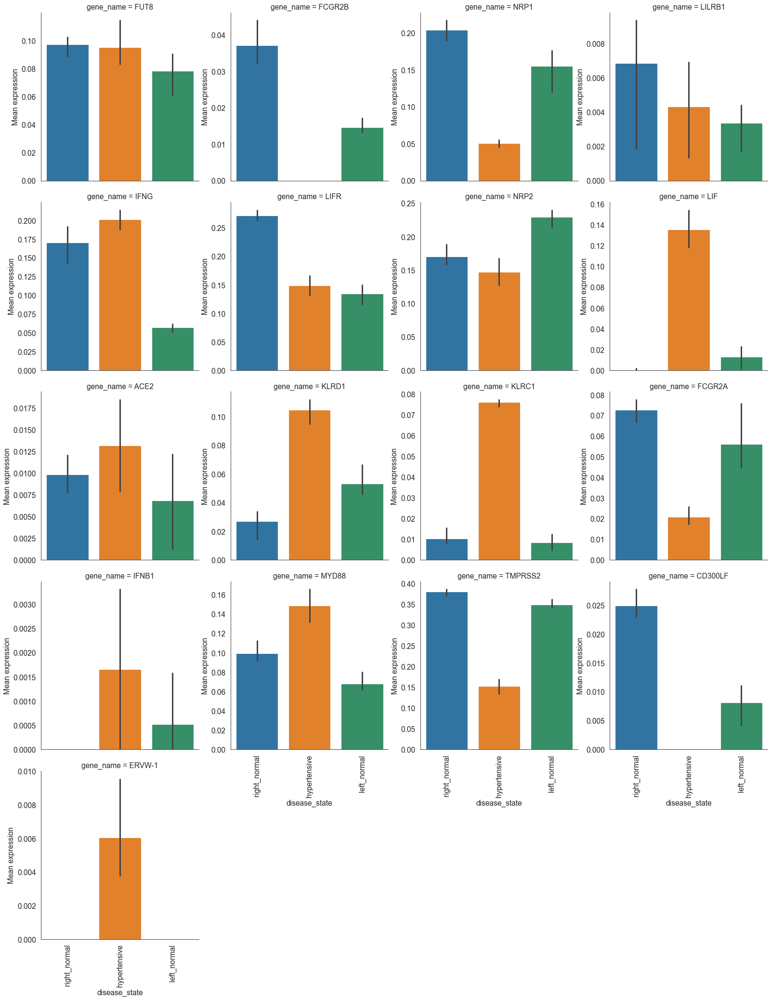

In [238]:
sns.set_style(style='white')
kind='bar'
tmp_gns=sorted(set(mean_ade_out_df['gene_name']))
category='disease_state'
x_col='gene_name'
col_dict={'hypertensive':'#ff7f0e','right_normal':'#279e68',
          'left_normal':'#1f77b4'}
tmp_fig=sns.catplot(data=mean_ade_out_df,hue=category,y='mean',x='disease_state',col=x_col,
                    col_wrap=4,kind=kind, sharex=True,sharey=False,
                    **{'dodge':False})
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    ax.set_ylabel('Mean expression')
#tmp_fig.savefig(path.join(expt_figdir,'target_genes_detection_rate_supp_fig1b.pdf'))

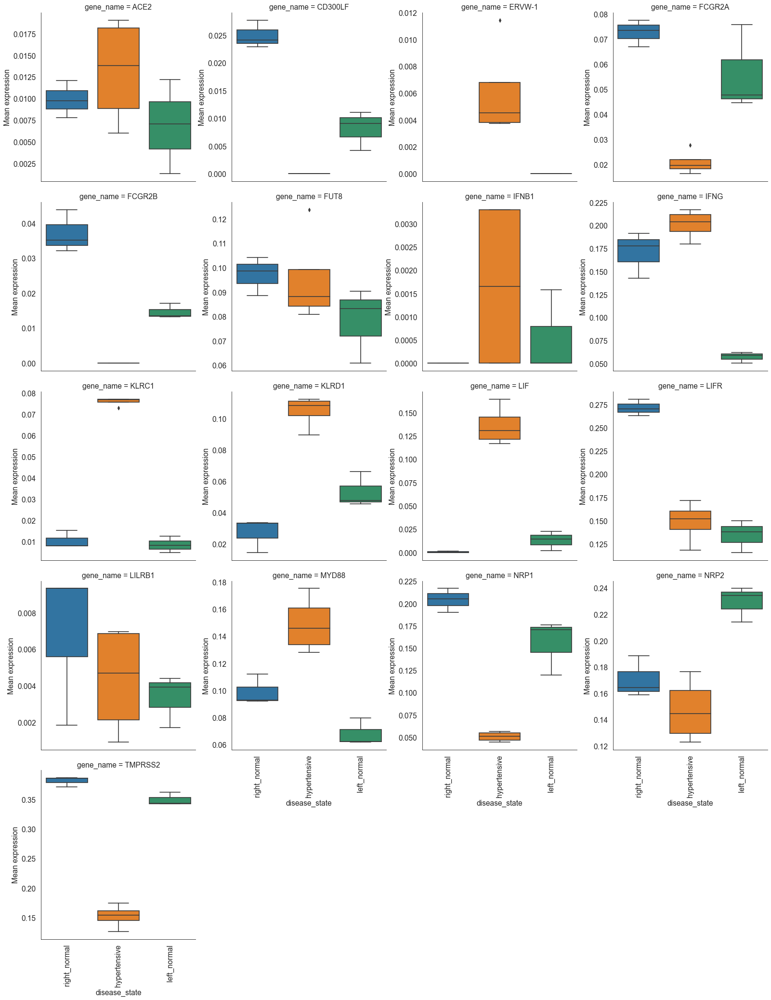

In [255]:
sns.set_style(style='white')
kind='box'
tmp_gns=sorted(set(mean_ade_out_df['gene_name']))
category='disease_state'
x_col='gene_name'
col_dict={'hypertensive':'#ff7f0e','right_normal':'#279e68',
          'left_normal':'#1f77b4'}
tmp_fig=sns.catplot(data=mean_ade_out_df,hue=category,y='mean',x='disease_state',col=x_col,
                    col_wrap=4,col_order=tmp_gns,kind=kind, sharex=True,sharey=False,
                    **{'dodge':False})
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    ax.set_ylabel('Mean expression')
#tmp_fig.savefig(path.join(expt_figdir,'target_genes_detection_rate_supp_fig1b.pdf'))

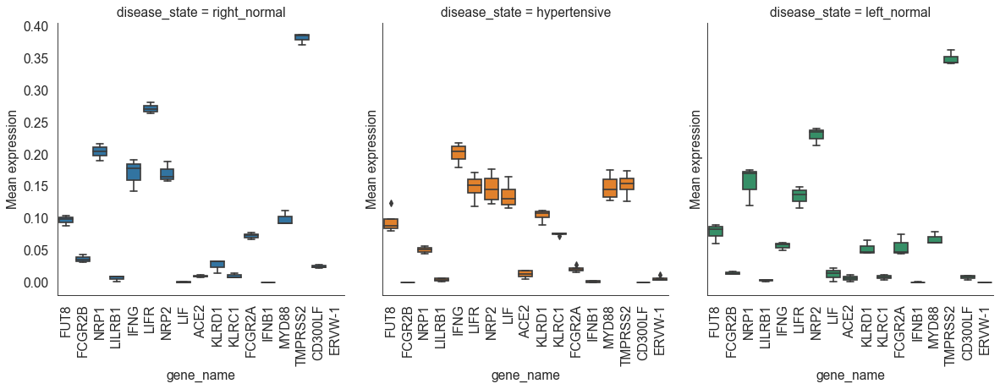

In [309]:
sns.set_style(style='white')
kind='box'
tmp_gns=sorted(set(out_df['gene_name']))
category='disease_state'
x_col='gene_name'
col_dict={'hypertensive':'#ff7f0e','right_normal':'#279e68',
          'left_normal':'#1f77b4'}
tmp_fig=sns.catplot(data=out_df,hue=category,y='mean',x=x_col,col=category,
                    kind=kind, sharex=True,sharey=True,
                   **{'dodge':False})

for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    ax.set_ylabel('Mean expression')
#tmp_fig.savefig(path.join(expt_figdir,'target_genes_detection_rate_supp_fig1b.pdf'))

In [310]:
del  organs_adata_dict,organ_adata

In [311]:
## Covid19 patients data

In [312]:
qc_filtered_adata=sc.read_loom(filename=path.join(expt_dir,'qc_filt_zhang_dataset.loom'))
tmp_cols=[]
for c in qc_filtered_adata.var.columns:
    if not c.startswith('Gene'):continue
    tmp_cols.append(c)
tmp_gene_names_df=qc_filtered_adata.var.loc[:,tmp_cols]
tmp_gene_names=[]
for k,v in tmp_gene_names_df.apply(axis=1,func=pd.unique).items():
    v=v.tolist()
    if len(v)>1:
        v.remove('nan')
    tmp_gene_names.append(v[0])
qc_filtered_adata.var['all_genes_hgnc_symbol']=tmp_gene_names
qc_filtered_adata.var_names=tmp_gene_names
ncov_val=qc_filtered_adata[:,'nCoV'].X.todense()
qc_filtered_adata.obs['nCoV_expression']=[m[0] for m in ncov_val.tolist()]
del tmp_gene_names,k,v,tmp_gene_names_df,tmp_cols,ncov_val

/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [313]:
qc_filtered_adata.uns['patient_group_colors']=['#1f77b4','#279e68','#ff7f0e']

... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'batch' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'Gene-0' as categorical
... storing 'Gene-1' as categorical
... storing 'Gene-10' as categorical
... storing 'Gene-11' as 

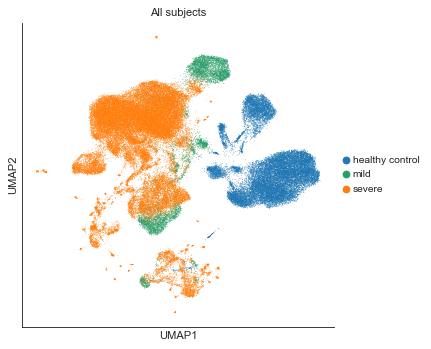

In [314]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
with sns.axes_style('ticks'):
    tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,return_fig=True,use_raw=False,
                            title='All subjects',color='patient_group',add_outline=False)
    sns.despine()
    tmp_umap_fig.savefig(path.join(expt_figdir,'umap_fig2a.pdf'))

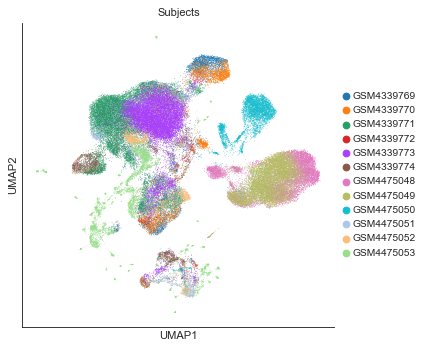

In [315]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
with sns.axes_style('ticks'):
    tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,return_fig=True,use_raw=False,
                            title='Subjects',color='sample_accesssion',add_outline=False)
    sns.despine()

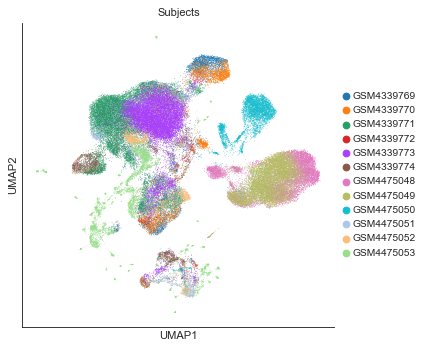

In [316]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
with sns.axes_style('ticks'):
    tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,return_fig=True,use_raw=False,
                            title='Subjects',color='sample_accesssion',add_outline=False)
    sns.despine()

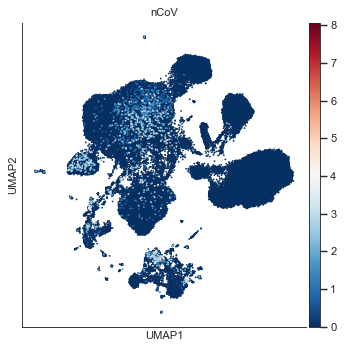

In [317]:
#sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,return_fig=True,use_raw=False,size=10,
                        color_map='RdBu_r',gene_symbols='all_genes_hgnc_symbol',
                        title='nCoV',color=['nCoV'],add_outline=False)
sns.despine()
tmp_umap_fig.savefig(path.join(expt_figdir,'_ncovid_transcripts_fig2a.pdf'))

['ACE2', 'CD300LF', 'ERVW-1', 'FCGR2A', 'FCGR2B', 'FUT8', 'IFNB1', 'IFNG', 'KLRC1', 'KLRD1', 'LIF', 'LIFR', 'LILRB1', 'MYD88', 'NRP1', 'NRP2', 'TMPRSS2']


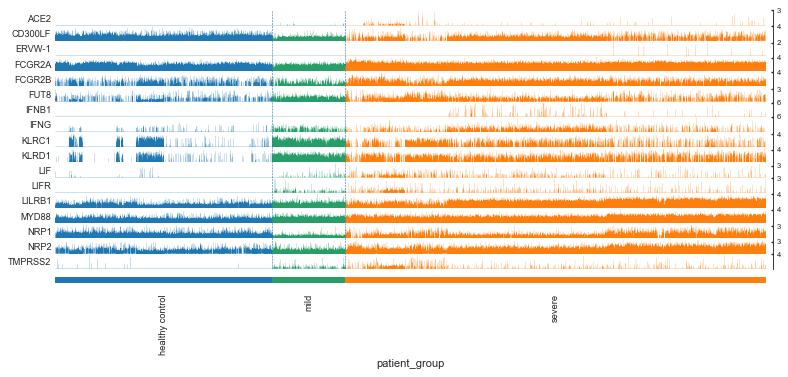

In [318]:
tmp_genes_list=sorted(qc_filtered_adata.var[qc_filtered_adata.var['all_genes_hgnc_symbol'].isin(ADE_GENES)]['all_genes_hgnc_symbol'].tolist())
if len(tmp_genes_list)>0:
    print(tmp_genes_list)
    qc_filtered_adata.var_names_make_unique()
    tmp_trackplot_fig=sc.pl.tracksplot(adata=qc_filtered_adata,var_names=tmp_genes_list,
                                       gene_symbols='all_genes_hgnc_symbol',
                                       use_raw=False,rotation=90,groupby='patient_group',
                                       save='_target_genes_fig2b.pdf')
    print()  

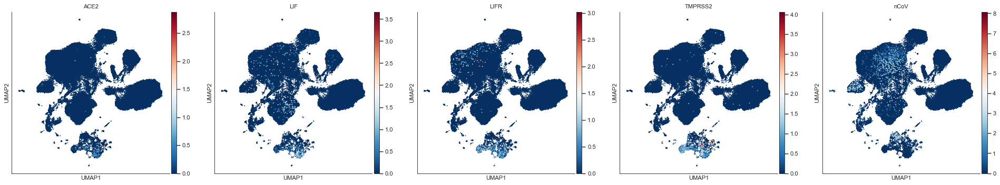

In [319]:
tmp_markers_genes_list=sorted(['ACE2','TMPRSS2','LIFR','LIF','nCoV'])
tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,size=10.0,color=tmp_markers_genes_list,ncols=5,
                        color_map='RdBu_r',gene_symbols='all_genes_hgnc_symbol',return_fig=True,use_raw=False,
                        add_outline=False,**{'norm':None})
sns.despine()
tmp_umap_fig.savefig(path.join(expt_figdir,'umap_target_genes_fig2b.pdf'))

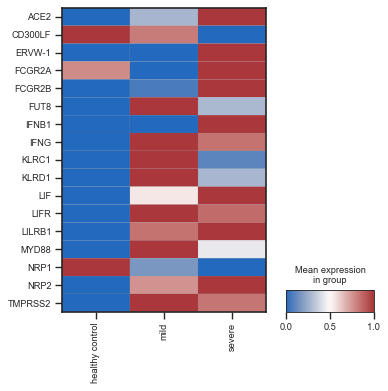

In [320]:
tmp_markers_genes_list=[g for g in sorted(set(ADE_GENES).intersection(qc_filtered_adata.var['all_genes_hgnc_symbol']))]
#sc.pl.tracksplot(adata=tmp_adata, var_names=tmp_ade_genes_list,groupby='louvain',dendrogram=True,figsize=tmp_fig_size)
if len(tmp_markers_genes_list)>=1:
    tmp_fig=sc.pl.matrixplot(adata=qc_filtered_adata,groupby='patient_group',
                             gene_symbols='all_genes_hgnc_symbol',
                             save='heatplot_fig2c.pdf',
                             use_raw=False,
                             figsize=(5,5),var_names=tmp_markers_genes_list,standard_scale='var',
                             cmap=HEATPLOT_PALETTE_CMAP,swap_axes=True,dendrogram=False)

In [321]:
all_lns=[]
with open(path.join(expt_dir,'GSE145926_family.soft'),'r') as fh:
    all_lns.extend(fh.readlines())
all_samples_dict={}    
len_lns=len(all_lns)
indices = [i for i, x in enumerate(all_lns) if x[1:7]=='SAMPLE']

for i in range(len(indices)):
    tmp_sample=all_lns[indices[i]].split('=')[-1].lstrip().rstrip().strip()
    
    tmp_annotation_dict={}
    tmp_lns=[]
    if indices[i]<indices[-1]:
        tmp_lns.extend(all_lns[indices[i]+1:indices[i+1]])
    else:
        tmp_lns.extend(all_lns[indices[i]+1::])
        
    for tmp_ln in tmp_lns:
        tmp_ln_prts=tmp_ln.split('=')
        tmp_key=tmp_ln_prts[0].strip().lstrip().rstrip()[1::]
        if re.match(pattern="^\s.+:\s.+",string=tmp_ln_prts[1]):
            tmp_value=tmp_ln_prts[1].strip().lstrip().rstrip()
            tmp_key='_'.join([tmp_key,tmp_value[0:tmp_value.index(':')].lstrip().rstrip().strip()]).replace(' ','_')
            tmp_annotation_dict[tmp_key]=tmp_value[tmp_value.index(':')+1::].lstrip().rstrip().strip() 
        else:
            tmp_annotation_dict[tmp_key]=tmp_ln_prts[1].strip('\n\r').lstrip().rstrip() 
    all_samples_dict[tmp_sample]=tmp_annotation_dict
    
all_keys=set()
for k,v in all_samples_dict.items():
    all_keys.update([tmp_k for tmp_k in v.keys()])    
for k,v in all_samples_dict.items():
    all_keys.intersection_update([tmp_k for tmp_k in v.keys()])
all_keys_lst=list(all_keys)

out_lst=[]
for s,a in all_samples_dict.items():
    tmp_lst=[s]
    for c in all_keys_lst:
        tmp_lst.append(a[c])
    out_lst.append(tmp_lst)
all_keys_lst.insert(0,'Sample_name')
sample_meta_df=pd.DataFrame(out_lst,columns=all_keys_lst)
sample_names=[]
for s in sample_meta_df.Sample_title:
    tmp_s=s.split('(')[0].split(',')[-1].lstrip().rstrip().strip()
    sample_names.append(tmp_s)
sample_meta_df['Sample_title_edit']=sample_names
sample_meta_df.head()

,Sample_name,Sample_contact_address,Sample_instrument_model,Sample_submission_date,Sample_contact_zip/postal_code,Sample_characteristics_ch1_sample_type,Sample_data_row_count,Sample_organism_ch1,Sample_data_processing,Sample_status,...,Sample_platform_id,Sample_library_strategy,Sample_taxid_ch1,Sample_molecule_ch1,Sample_contact_institute,Sample_library_source,Sample_description,Sample_contact_city,Sample_contact_country,Sample_title_edit
0,GSM4339769,"No. 29, Bulan Road",BGISEQ-500,Feb 25 2020,454171,BALF,0,Homo sapiens,The TCR sequences for each single T cell were ...,Public on Apr 22 2020,...,GPL23227,RNA-Seq,9606,polyA RNA,Shenzhen 3rd People's Hospital,transcriptomic,Single-cell RNAseq data,Shenzhen,China,C141
1,GSM4339770,"No. 29, Bulan Road",BGISEQ-500,Feb 25 2020,454171,BALF,0,Homo sapiens,The TCR sequences for each single T cell were ...,Public on Apr 22 2020,...,GPL23227,RNA-Seq,9606,polyA RNA,Shenzhen 3rd People's Hospital,transcriptomic,Single-cell RNAseq data,Shenzhen,China,C142
2,GSM4339771,"No. 29, Bulan Road",BGISEQ-500,Feb 25 2020,454171,BALF,0,Homo sapiens,The TCR sequences for each single T cell were ...,Public on Apr 22 2020,...,GPL23227,RNA-Seq,9606,polyA RNA,Shenzhen 3rd People's Hospital,transcriptomic,Single-cell RNAseq data,Shenzhen,China,C143
3,GSM4339772,"No. 29, Bulan Road",BGISEQ-500,Feb 25 2020,454171,BALF,0,Homo sapiens,The TCR sequences for each single T cell were ...,Public on Apr 22 2020,...,GPL23227,RNA-Seq,9606,polyA RNA,Shenzhen 3rd People's Hospital,transcriptomic,Single-cell RNAseq data,Shenzhen,China,C144
4,GSM4339773,"No. 29, Bulan Road",BGISEQ-500,Feb 25 2020,454171,BALF,0,Homo sapiens,The TCR sequences for each single T cell were ...,Public on Apr 22 2020,...,GPL23227,RNA-Seq,9606,polyA RNA,Shenzhen 3rd People's Hospital,transcriptomic,Single-cell RNAseq data,Shenzhen,China,C145


In [322]:
qc_filtered_adata=sc.read_loom(filename=path.join(expt_dir,'qc_filt_zhang_dataset.loom'))
obs_names=[]
for i in zip([b.split('-')[0] for b in qc_filtered_adata.obs['sample_barcode']],qc_filtered_adata.obs['sample_title'].to_list()):
    obs_names.append('_'.join(i))
qc_filtered_adata.obs_names=obs_names
del obs_names
tmp_cols=[]
for c in qc_filtered_adata.var.columns:
    if not c.startswith('Gene'):continue
    tmp_cols.append(c)
tmp_gene_names_df=qc_filtered_adata.var.loc[:,tmp_cols]
tmp_gene_names=[]
for k,v in tmp_gene_names_df.apply(axis=1,func=pd.unique).items():
    v=v.tolist()
    if len(v)>1:
        v.remove('nan')
    tmp_gene_names.append(v[0])
qc_filtered_adata.var['all_genes_hgnc_symbol']=tmp_gene_names
qc_filtered_adata.var_names=tmp_gene_names
ncov_val=qc_filtered_adata[:,'nCoV'].X.todense()
qc_filtered_adata.obs['nCoV_expression']=[m[0] for m in ncov_val.tolist()]
del tmp_gene_names,k,v,tmp_gene_names_df,tmp_cols,ncov_val

/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [323]:
qc_filtered_adata.obs.head()

,Sample_characteristics_ch1_cell_subsets,Sample_characteristics_ch1_patient_group,Sample_characteristics_ch1_sample_type,Sample_data_processing,Sample_data_processing_Genome_build,Sample_description,Sample_library_selection,Sample_library_source,Sample_library_strategy,Sample_source_name_ch1,...,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,sample_accesssion,sample_barcode,sample_title,series,total_counts,nCoV_expression
AAACCTGAGATGTCGG_C141,Total cell,mild,BALF,The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq data,cDNA,transcriptomic,RNA-Seq,BALF,...,44.896866,54.835253,70.640236,33.485133,GSM4339769,AAACCTGAGATGTCGG-1,C141,GSE145926,3733.0,0.0
AAACCTGAGGCTCATT_C141,Total cell,mild,BALF,The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq data,cDNA,transcriptomic,RNA-Seq,BALF,...,45.087277,54.723772,67.716394,36.644472,GSM4339769,AAACCTGAGGCTCATT-1,C141,GSE145926,33342.0,0.0
AAACCTGCAATCCGAT_C141,Total cell,mild,BALF,The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq data,cDNA,transcriptomic,RNA-Seq,BALF,...,50.497643,60.380653,74.768640,42.238519,GSM4339769,AAACCTGCAATCCGAT-1,C141,GSE145926,5727.0,0.0
AAACCTGCATGGTCAT_C141,Total cell,mild,BALF,The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq data,cDNA,transcriptomic,RNA-Seq,BALF,...,34.720327,45.657117,62.482947,25.511596,GSM4339769,AAACCTGCATGGTCAT-1,C141,GSE145926,4398.0,0.0
AAACCTGGTTTAGCTG_C141,Total cell,mild,BALF,The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq data,cDNA,transcriptomic,RNA-Seq,BALF,...,40.043492,52.159056,70.456664,28.922025,GSM4339769,AAACCTGGTTTAGCTG-1,C141,GSE145926,3219.0,0.0


In [324]:
genes_min_cells=1
#cells_min_genes=1000
hgv_genes_cnts=None
no_components=20
neighbours_metric='euclidean'
rank_no_genes_cut_off=500
tmp_adata_batch_corrected_dict={}
for tmp_patient in qc_filtered_adata.obs.patient_group.unique():
    tmp_adata=qc_filtered_adata[qc_filtered_adata.obs.index[qc_filtered_adata.obs.patient_group==tmp_patient],:]
    sc.pp.filter_genes(data=tmp_adata,inplace=True,min_cells=genes_min_cells)
    #sc.pp.filter_cells(data=tmp_adata,inplace=True,min_genes=cells_min_genes)
    sc.pp.highly_variable_genes(adata=tmp_adata,subset=False,inplace=True,n_top_genes=hgv_genes_cnts,
                                batch_key='sample_accesssion')
    sc.tl.pca(data=tmp_adata,use_highly_variable=True,n_comps=no_components)
    sc.pp.neighbors(adata=tmp_adata,metric=neighbours_metric)
    sc.tl.umap(adata=tmp_adata)
    sc.tl.louvain(adata=tmp_adata,flavor='vtraag')
    sc.tl.rank_genes_groups(adata=tmp_adata,groupby='louvain',method='logreg',rankby_abs=True,
                            n_genes=rank_no_genes_cut_off,use_raw=False)
    tmp_adata_batch_corrected_dict[tmp_patient]=tmp_adata
    del tmp_adata

filtered out 2282 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
extracting highly variable genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categ

... storing 'highly_variable-9' as categorical
... storing 'all_genes_hgnc_symbol' as categorical
    finished (0:00:08)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:29)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 22 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:14)
ranking genes
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/sklearn/linear_model/_

In [325]:
for k, v in tmp_adata_batch_corrected_dict.items():
    print(k)

mild
severe
healthy control


In [326]:
for k, v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for kl, l in v.obs.groupby('louvain'):
        print(kl,'(n=',l.shape[0],')')
    print()

mild
0 (n= 1062 )
1 (n= 911 )
2 (n= 886 )
3 (n= 817 )
4 (n= 761 )
5 (n= 741 )
6 (n= 578 )
7 (n= 479 )
8 (n= 408 )
9 (n= 379 )
10 (n= 316 )
11 (n= 315 )
12 (n= 290 )
13 (n= 167 )
14 (n= 156 )
15 (n= 128 )
16 (n= 62 )
17 (n= 59 )

severe
0 (n= 8476 )
1 (n= 7230 )
2 (n= 4370 )
3 (n= 3318 )
4 (n= 3044 )
5 (n= 2954 )
6 (n= 2619 )
7 (n= 2307 )
8 (n= 2272 )
9 (n= 2121 )
10 (n= 1764 )
11 (n= 1655 )
12 (n= 1542 )
13 (n= 1485 )
14 (n= 1214 )
15 (n= 1062 )
16 (n= 1013 )
17 (n= 200 )
18 (n= 109 )
19 (n= 41 )
20 (n= 23 )
21 (n= 18 )

healthy control
0 (n= 3558 )
1 (n= 3537 )
2 (n= 2867 )
3 (n= 2724 )
4 (n= 2720 )
5 (n= 2365 )
6 (n= 2130 )
7 (n= 1413 )
8 (n= 1160 )
9 (n= 988 )
10 (n= 685 )
11 (n= 525 )
12 (n= 436 )
13 (n= 108 )



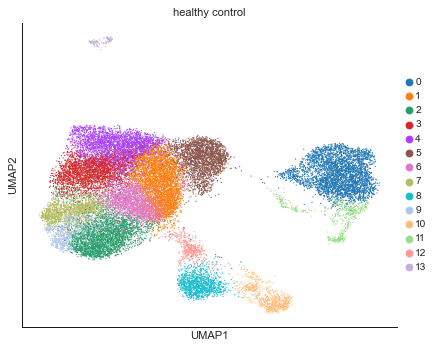

In [327]:
sc.set_figure_params(figsize=(6,5),frameon=True,fontsize=10.0)
category='healthy control'
tmp_adata=tmp_adata_batch_corrected_dict[category]
tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,
                   title=category,show=True,
                   color='louvain',add_outline=False)
del tmp_adata
sns.despine()
tmp_fig.savefig(path.join(expt_figdir,'healthy_controls_subpopulation_umap_fig3a.pdf'))


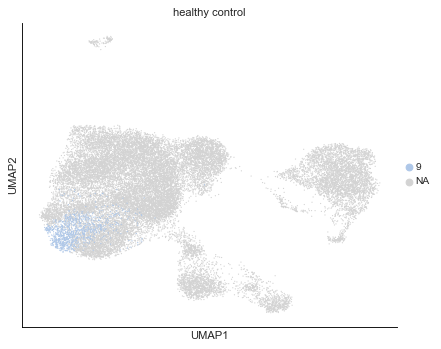

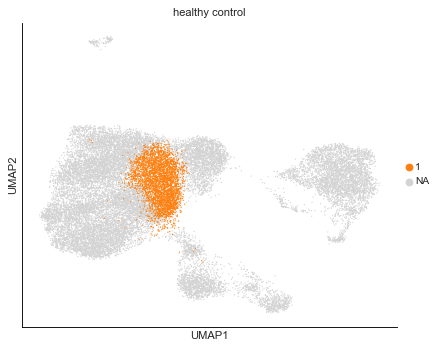

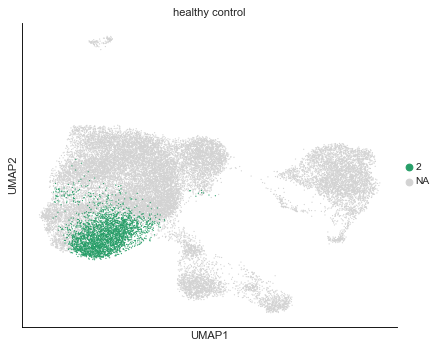

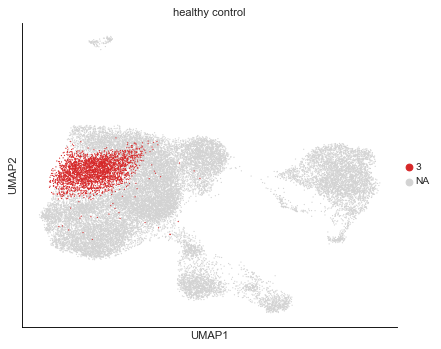

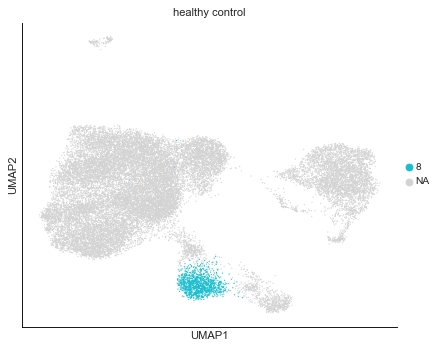

...

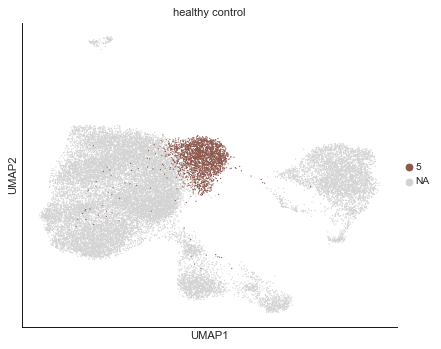

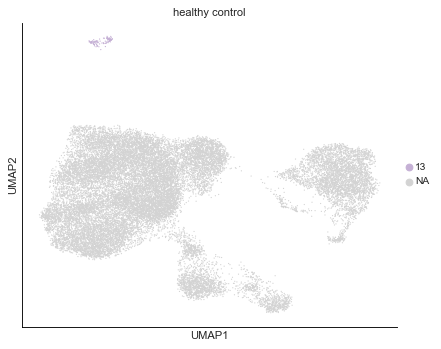

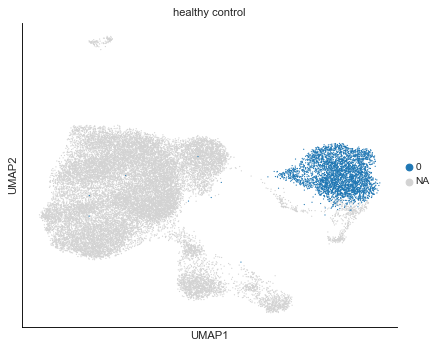

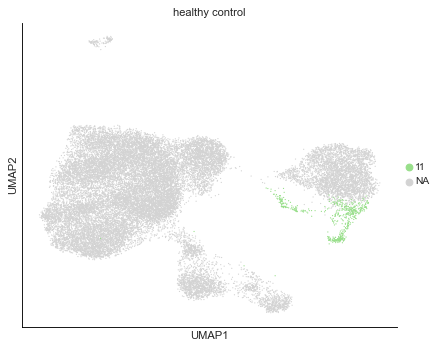

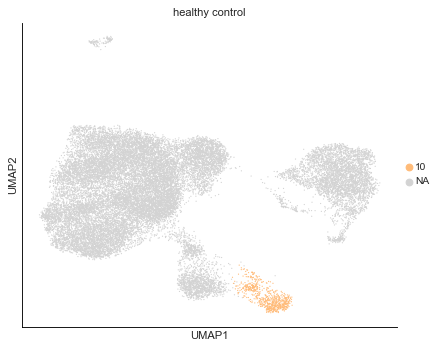

In [328]:
category='healthy control'
tmp_adata=tmp_adata_batch_corrected_dict[category]
for sp in tmp_adata.obs.louvain.unique():
    tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                       show=True,groups=sp,
                   color='louvain',add_outline=False)
    sns.despine()
del tmp_adata

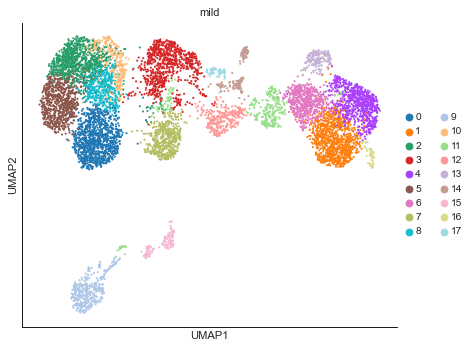

In [329]:
category='mild'
tmp_adata=tmp_adata_batch_corrected_dict[category]
tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,show=True,
                   color='louvain',add_outline=False)
del tmp_adata
sns.despine()
tmp_fig.savefig(path.join(expt_figdir,'covid19_mild_subpopulation_umap_fig3b.pdf'))

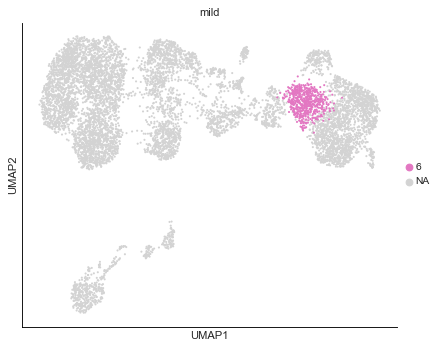

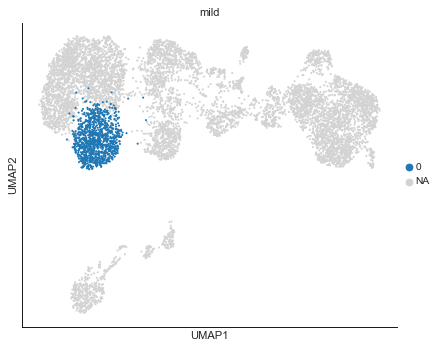

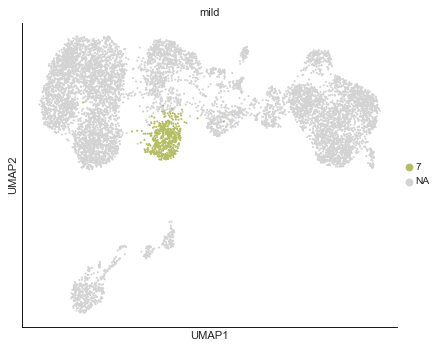

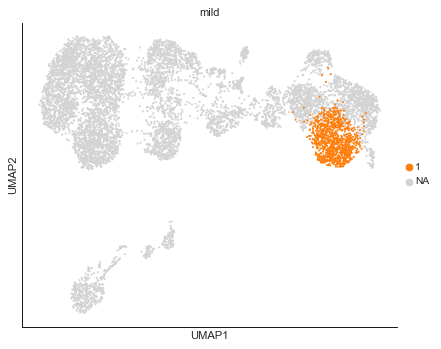

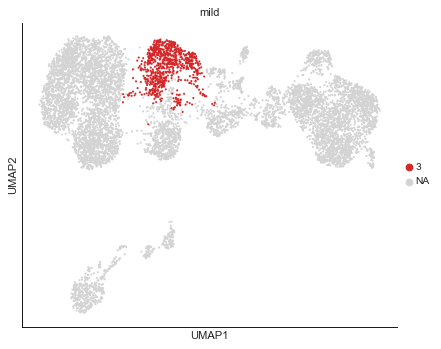

...

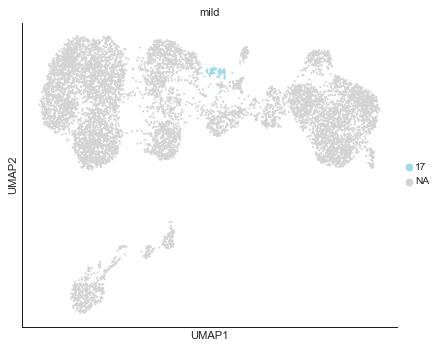

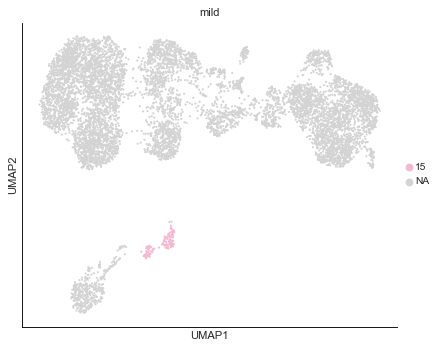

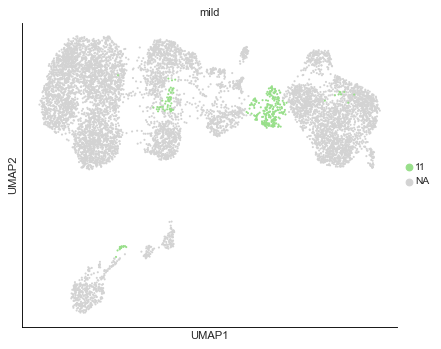

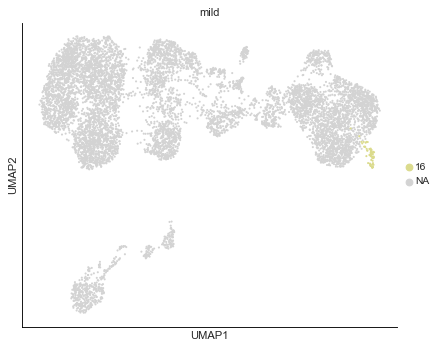

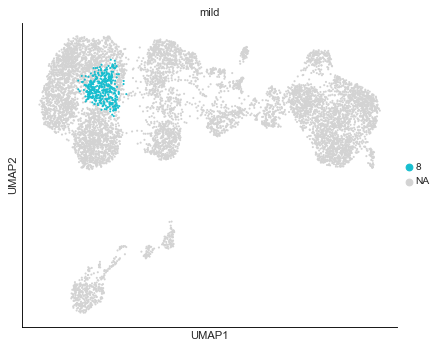

In [330]:
category='mild'
tmp_adata=tmp_adata_batch_corrected_dict[category]
for sp in tmp_adata.obs.louvain.unique():
    tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                       show=True,groups=sp,color='louvain',add_outline=False)
    sns.despine()
del tmp_adata

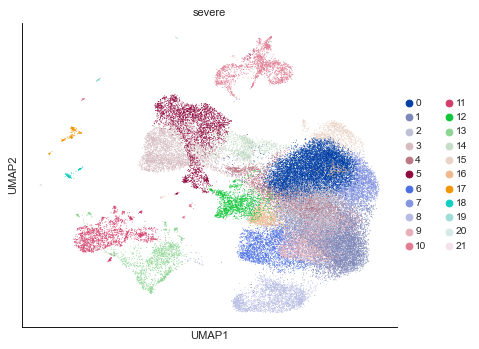

In [331]:
category='severe'
tmp_adata=tmp_adata_batch_corrected_dict[category]
tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                   color='louvain',add_outline=False)
sns.despine()
del tmp_adata
tmp_fig.savefig(path.join(expt_figdir,'covid19_severe_subpopulation_umap_fig3c.pdf'))


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = pl.figure()


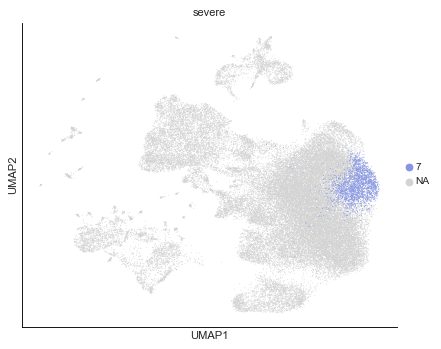

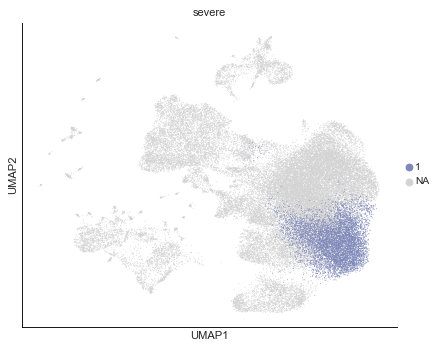

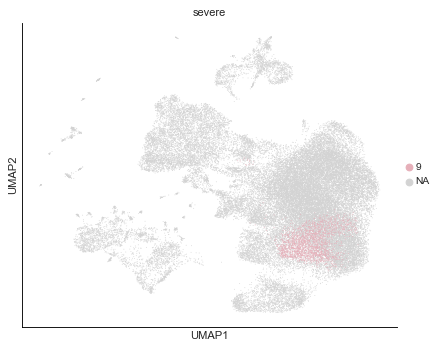

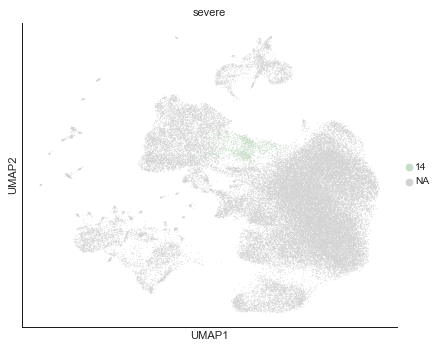

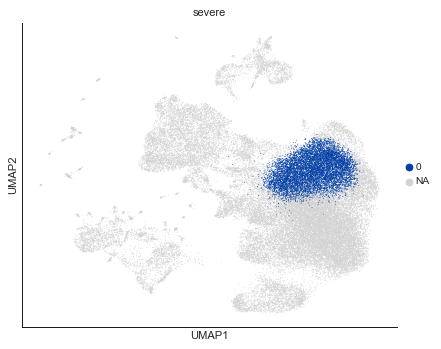

...

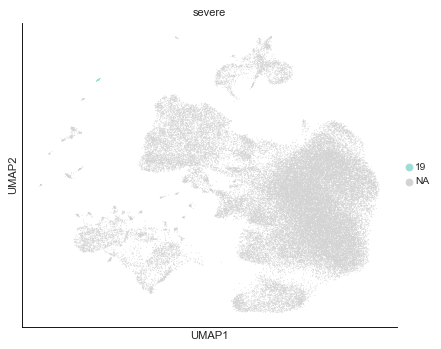

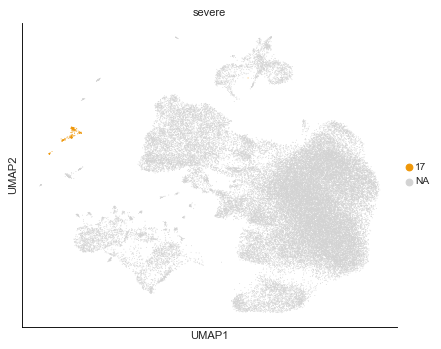

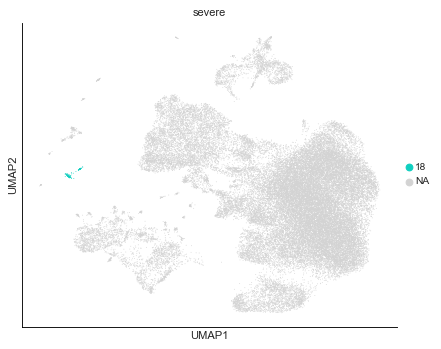

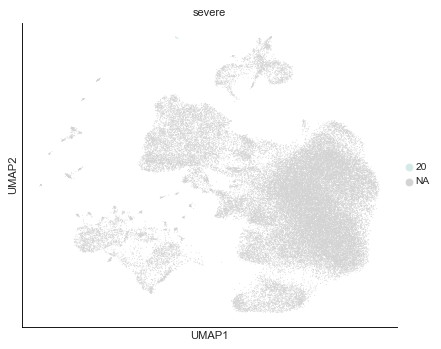

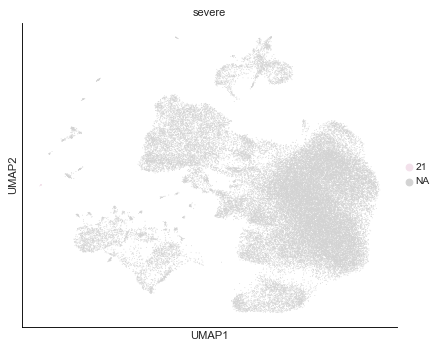

In [332]:
category='severe'
tmp_adata=tmp_adata_batch_corrected_dict[category]
for sp in tmp_adata.obs.louvain.unique():
    tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                       show=True,groups=sp,color='louvain',add_outline=False)
    sns.despine()
del tmp_adata

mild


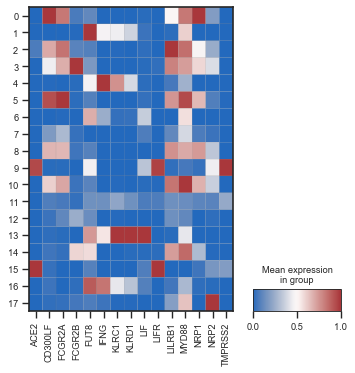

severe


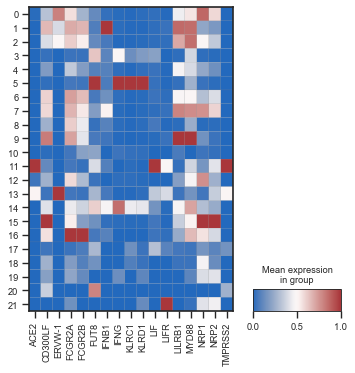

healthy control


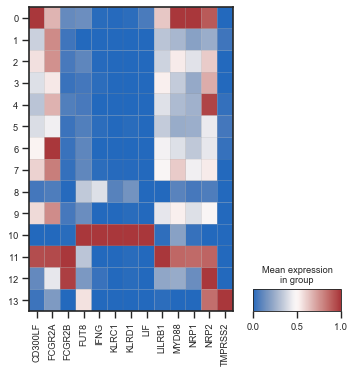

In [333]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
for k, v in tmp_adata_batch_corrected_dict.items():
    tmp_markers_genes_list=[g for g in sorted(set(ADE_GENES).intersection(v.var['all_genes_hgnc_symbol']))]
    if len(tmp_markers_genes_list)>=1:
        print(k)
        v.var_names_make_unique()
        tmp_fig=sc.pl.matrixplot(adata=v,groupby='louvain',gene_symbols='all_genes_hgnc_symbol',
                                 use_raw=False,figsize=(5,5),var_names=tmp_markers_genes_list,
                                 standard_scale='var',
                             cmap=HEATPLOT_PALETTE_CMAP,swap_axes=False,dendrogram=False)
        #plt.title(k)
        #sns.despine()
    del v

mild
severe
healthy control


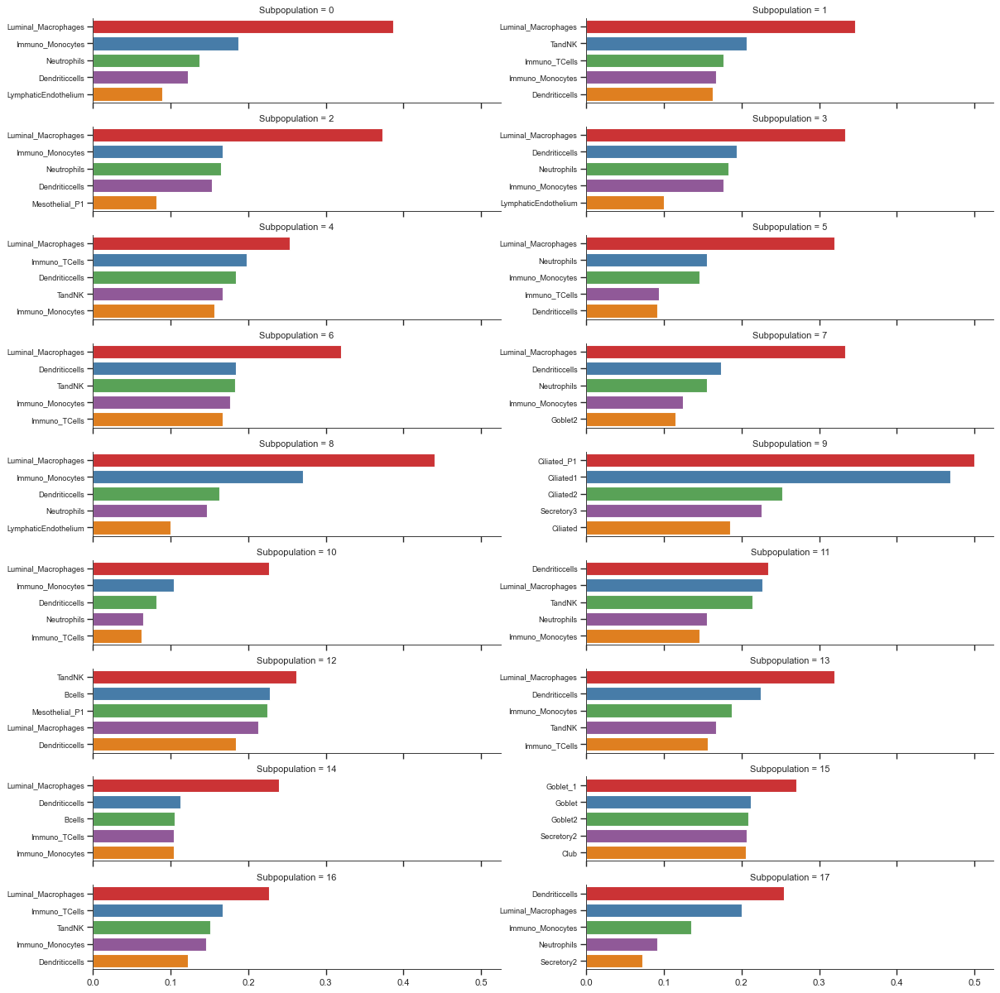

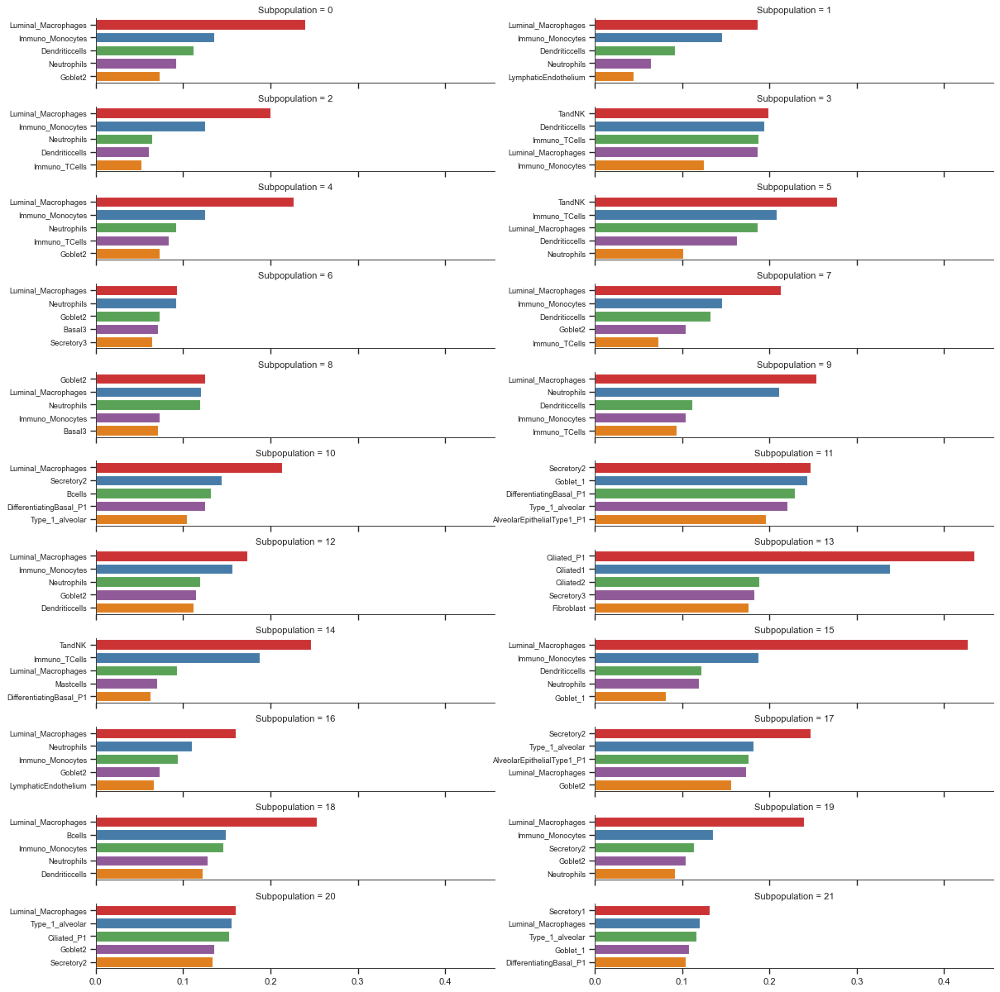

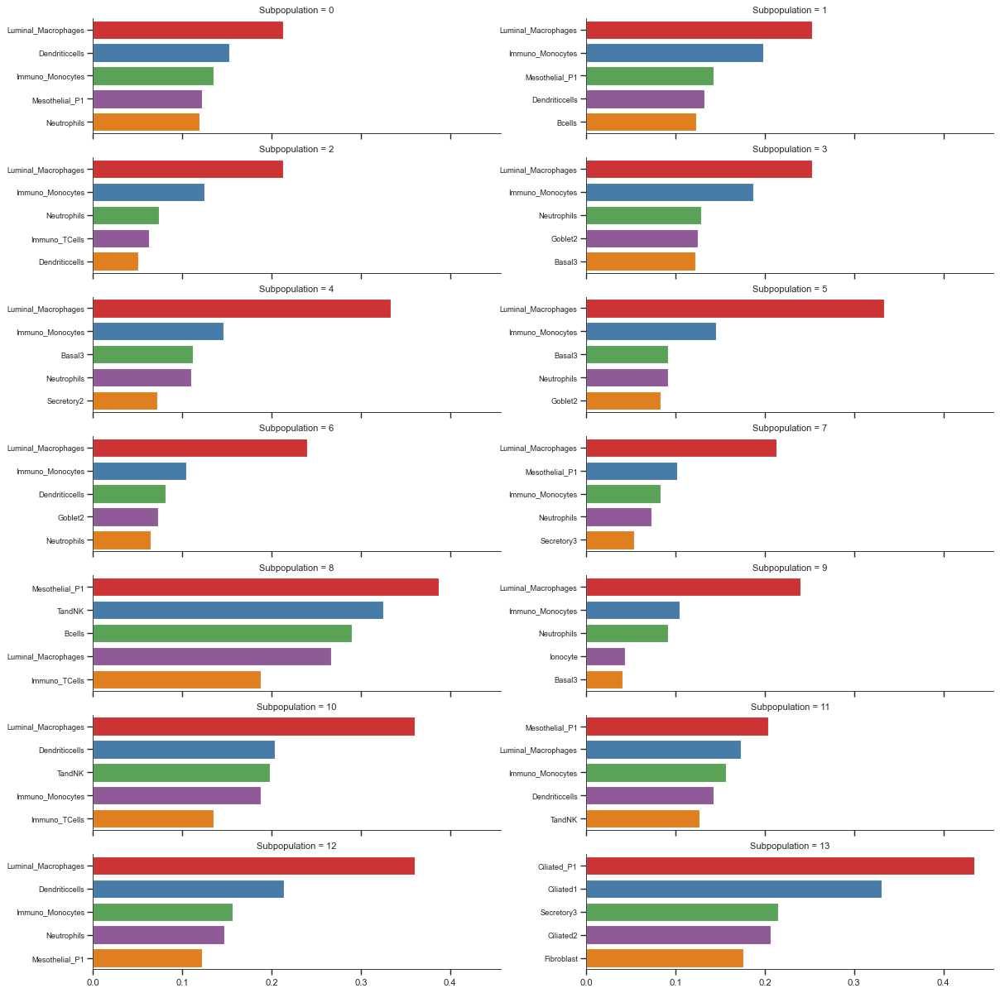

In [334]:
sns.set_style(style='ticks')
fig_size=(15,15)
markers_rank_top_n_markers=100
rank_top_n_reference='reference' #'reference','data'
out_df_lst=[]
tmp_cell_type_markers_ensemble_id_dict=dict()
for k,v in cell_type_markers_ensemble_id_dict.items():
    tmp_cell_type_markers_ensemble_id_dict[k]=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else gn for gn in v]
    
for k, v in tmp_adata_batch_corrected_dict.items():
    #if k=='mild':continue
    print(k)
    v.var_names_make_unique()
    temp_df=sc.tl.marker_gene_overlap(adata=v,reference_markers=tmp_cell_type_markers_ensemble_id_dict,
                                      top_n_markers=markers_rank_top_n_markers,normalize=rank_top_n_reference)
    temp_df['type']=temp_df.index
    temp_df=temp_df.melt(id_vars='type',var_name='subpopulation', value_name='markers')
    temp_groups_dict=temp_df.groupby('subpopulation')
    tmp_no_groups=len(temp_groups_dict.groups.keys())
    tmp_tracker=0
    tmp_no_cols=2
    tmp_no_rows=tmp_no_groups//tmp_no_cols if tmp_no_groups%tmp_no_cols==0 else  (tmp_no_groups//tmp_no_cols)+1
    tmp_fig,ax =plt.subplots(nrows=tmp_no_rows,ncols=tmp_no_cols,sharex=True,sharey=False,squeeze=False,
                         **{'figsize':fig_size,'frameon':False})
    tmp_ax_index=[]
    for r in range(tmp_no_rows):
        for c in range(tmp_no_cols):
            tmp_ax_index.append([r,c])
    #tmp_cell_type_colors=sns.color_palette(palette='Set2',n_colors=len([t for t in temp_df.type.unique()]))
    #tmp_cell_type_colors_dict=dict(zip([t for t in temp_df.type.unique()],tmp_cell_type_colors))
    for sp in range(tmp_no_groups):
        tmp_grp_df=temp_groups_dict.get_group(name=str(sp))
        tmp_grp_df=tmp_grp_df.loc[pd.Series.sort_values(tmp_grp_df.markers,ascending=False).index,:].head(5)
        tmp_grp_df['disease']=k
        #print(temp_groups_dict.groups[str(sp)].tolist())
        tmp_grp_df['cell_names']=','.join(v[temp_groups_dict.groups[str(sp)].tolist(),:].obs_names.to_list())
        out_df_lst.append(tmp_grp_df)
        tmp_axis=ax[tmp_ax_index[sp][0],tmp_ax_index[sp][1]]
        sns.barplot(data=tmp_grp_df,dodge=False,ci=None,hue='type',x='markers',y='type',ax=tmp_axis,
                    palette='Set1')
        sns.despine()
        tmp_axis.legend().set_visible(False)
        tmp_axis.set_title('Subpopulation = '+str(sp))
        tmp_y_labels = tmp_axis.get_yticklabels()
        #tmp_axis.set_xticklabels()
        tmp_axis.set_yticklabels(tmp_y_labels,fontdict={'fontsize':'small'})
        #plt.Axes.set_frame_on(False)
        tmp_axis.set_ylabel('')
        tmp_axis.set_xlabel('')
        tmp_fig.tight_layout(pad=0.75)
        tmp_out_fname=str(sc.settings.figdir)+'/'+k+'_cell_types_barplots.pdf'
        tmp_fig.savefig(tmp_out_fname)
        del tmp_grp_df
    del k,v
del tmp_cell_type_markers_ensemble_id_dict

In [335]:
tmp_df=pd.concat(out_df_lst)
print(tmp_df.head(20))
del out_df_lst

                     type subpopulation   markers disease  \
41    Luminal_Macrophages             0  0.386667    mild   
36       Immuno_Monocytes             0  0.187500    mild   
51            Neutrophils             0  0.137615    mild   
27         Dendriticcells             0  0.122449    mild   
43   LymphaticEndothelium             0  0.088889    mild   
104   Luminal_Macrophages             1  0.346667    mild   
121                TandNK             1  0.206349    mild   
100         Immuno_TCells             1  0.177083    mild   
99       Immuno_Monocytes             1  0.166667    mild   
90         Dendriticcells             1  0.163265    mild   
167   Luminal_Macrophages             2  0.373333    mild   
162      Immuno_Monocytes             2  0.166667    mild   
177           Neutrophils             2  0.165138    mild   
153        Dendriticcells             2  0.153061    mild   
173        Mesothelial_P1             2  0.081633    mild   
230   Luminal_Macrophage

In [336]:
sps_predicted_types_dict=dict()
for k, v in tmp_df.groupby(['subpopulation','disease']):
    tmp_dict={k[0]:v['type'].to_list()[0:2]}
    if k[1] in sps_predicted_types_dict:
         sps_predicted_types_dict[k[1]].update(tmp_dict)   
    else:
        sps_predicted_types_dict[k[1]]=tmp_dict
    del tmp_dict
    
sps_predicted_types_dict


{'healthy control': {'0': ['Luminal_Macrophages', 'Dendriticcells'],
  '1': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '10': ['Luminal_Macrophages', 'Dendriticcells'],
  '11': ['Mesothelial_P1', 'Luminal_Macrophages'],
  '12': ['Luminal_Macrophages', 'Dendriticcells'],
  '13': ['Ciliated_P1', 'Ciliated1'],
  '2': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '3': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '4': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '5': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '6': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '7': ['Luminal_Macrophages', 'Mesothelial_P1'],
  '8': ['Mesothelial_P1', 'TandNK'],
  '9': ['Luminal_Macrophages', 'Immuno_Monocytes']},
 'mild': {'0': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '1': ['Luminal_Macrophages', 'TandNK'],
  '10': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '11': ['Dendriticcells', 'Luminal_Macrophages'],
  '12': ['TandNK', 'Bcells'],
  '13': ['Luminal_Macrophages', 'Dendriticcells'],
 

In [337]:
all_types=set()
for k, v in cell_type_markers_ensemble_id_dict.items():
    all_types.add(k)
for all_type in sorted(all_types):
    print(all_type)

AT1
AT2
AdventitialFibroblast_P1
AirwaySmoothMuscle_P1
AirwaySmoothMuscle_P2
AlveolarEpithelialType1_P1
AlveolarEpithelialType1_P2
AlveolarEpithelialType2_P1
AlveolarFibroblast_P1
Artery_P1
Artery_P2
Basal1
Basal2
Basal3
Basal_Mitotic
Basal_P1
Bcells
BronchialVessel1_P1
BronchialVessel2_P1
CapillaryAerocyte_P1
Capillary_P1
Ciliated
Ciliated1
Ciliated2
Ciliated_P1
Club
Club_P1
Dendriticcells
DifferentiatingBasal_P1
Endothelial
FOXN4
Fibroblast
Fibroblasts
Goblet
Goblet2
Goblet_1
Immuno_Monocytes
Immuno_TCells
Ionocyte
Ionocytes
Lipofibroblast_P1
Luminal_Macrophages
Lymphatic
LymphaticEndothelium
Lymphatic_P1
Lymphatic_P2
Mastcells
Mesothelial_P1
Mesothelium
Myofibroblast_P1
Myofibroblast_P2
Neutrophils
Pericyte_P1
ProliferatingBasal_P1
Secretory1
Secretory2
Secretory3
Smoothmuscle
TandNK
Type2alveolar
Type_1_alveolar
VascularSmoothMuscle_P2
Vein_P1


In [338]:
counts_dir=path.join(expt_dir,'raw_counts')
loom_fnames=utils.get_list_of_specific_file_type(directory=counts_dir,
                                                 file_pattern='.loom')
subset= None # 
all_raw_counts_adata_lst=[]
for loom_fname in loom_fnames:
    tmp_loom_fname_parts=loom_fname.split('/')
    tmp_sample_name=tmp_loom_fname_parts[-1].strip('.loom')
    if not subset is None and tmp_sample_name not in subset : continue
    print('Started:',tmp_sample_name)
    tmp_adata=sc.read_loom(loom_fname,var_names='id')
    all_raw_counts_adata_lst.append(tmp_adata)
    del tmp_adata
tmp_adata=all_raw_counts_adata_lst[0].concatenate(all_raw_counts_adata_lst[1::],join='outer')
#tmp_adata=all_raw_counts_adata_lst[0].concatenate(all_raw_counts_adata_lst[1::],join='inner')
del all_raw_counts_adata_lst

Started: GSM4475052


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Started: GSM4475048
Started: GSM4475049
Started: GSM4475053
Started: GSM4339770
Started: GSM4339771
Started: GSM4339772
Started: GSM4339769
Started: GSM4339773
Started: GSM4475050
Started: GSM4339774
Started: GSM4475051


In [339]:
obs_names=[]
for i in zip([b.split('-')[0] for b in tmp_adata.obs['sample_barcode']],tmp_adata.obs['sample_title'].to_list()):
    obs_names.append('_'.join(i))
tmp_adata.obs_names=obs_names
del obs_names

gn_cols=[c for c in tmp_adata.var.columns if c.startswith('Gene')]
gn_name_lst=[]
for gn in tmp_adata.var.index:
    try:
        gn_name_lst.append('+'.join(list(set(tmp_adata.var.loc[gn,gn_cols].tolist()))))
    except:
        gn_name_lst.append('+'.join([n for n in set(tmp_adata.var.loc[gn,gn_cols].tolist()) if not type(n) ==float]))
tmp_adata.var['Gene']=gn_name_lst
tmp_patient_grp=['severe' if re.match(pattern='severe', string=g,flags=re.IGNORECASE) else g for g in tmp_adata.obs.Sample_characteristics_ch1_patient_group]
tmp_adata.obs['patient_group']=tmp_patient_grp
del gn_name_lst,tmp_patient_grp

In [340]:
ensembl_id_featuretype_dict=dict(zip(biomart_gene_names.ensembl_gene_id.to_list(),
                                     biomart_gene_names.gene_biotype.to_list()))


In [341]:
tmp_adata.obs.head()

,Sample_characteristics_ch1_cell_subsets,Sample_characteristics_ch1_patient_group,Sample_characteristics_ch1_sample_type,Sample_data_processing,Sample_data_processing_Genome_build,Sample_description,Sample_library_selection,Sample_library_source,Sample_library_strategy,Sample_source_name_ch1,obs_names,sample_accesssion,sample_barcode,sample_title,series,batch,patient_group
AAACCTGAGCGAAGGG_C149,Total cell,severe COVID-19 patient,bronchoalveolar lavage fluid (BALF),The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq,cDNA,transcriptomic,RNA-Seq,BALF,AAACCTGAGCGAAGGG_1,GSM4475052,AAACCTGAGCGAAGGG-1,C149,GSE145926,0,severe
AAACCTGCACCTCGTT_C149,Total cell,severe COVID-19 patient,bronchoalveolar lavage fluid (BALF),The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq,cDNA,transcriptomic,RNA-Seq,BALF,AAACCTGCACCTCGTT_1,GSM4475052,AAACCTGCACCTCGTT-1,C149,GSE145926,0,severe
AAACCTGCAGTGGGAT_C149,Total cell,severe COVID-19 patient,bronchoalveolar lavage fluid (BALF),The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq,cDNA,transcriptomic,RNA-Seq,BALF,AAACCTGCAGTGGGAT_1,GSM4475052,AAACCTGCAGTGGGAT-1,C149,GSE145926,0,severe
AAACCTGCATTCGACA_C149,Total cell,severe COVID-19 patient,bronchoalveolar lavage fluid (BALF),The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq,cDNA,transcriptomic,RNA-Seq,BALF,AAACCTGCATTCGACA_1,GSM4475052,AAACCTGCATTCGACA-1,C149,GSE145926,0,severe
AAACCTGTCACCTCGT_C149,Total cell,severe COVID-19 patient,bronchoalveolar lavage fluid (BALF),The TCR sequences for each single T cell were ...,GRCh38 + COVID(MN908947),Single-cell RNAseq,cDNA,transcriptomic,RNA-Seq,BALF,AAACCTGTCACCTCGT_1,GSM4475052,AAACCTGTCACCTCGT-1,C149,GSE145926,0,severe


In [342]:
sps_predicted_types_dict

{'healthy control': {'0': ['Luminal_Macrophages', 'Dendriticcells'],
  '1': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '10': ['Luminal_Macrophages', 'Dendriticcells'],
  '11': ['Mesothelial_P1', 'Luminal_Macrophages'],
  '12': ['Luminal_Macrophages', 'Dendriticcells'],
  '13': ['Ciliated_P1', 'Ciliated1'],
  '2': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '3': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '4': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '5': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '6': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '7': ['Luminal_Macrophages', 'Mesothelial_P1'],
  '8': ['Mesothelial_P1', 'TandNK'],
  '9': ['Luminal_Macrophages', 'Immuno_Monocytes']},
 'mild': {'0': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '1': ['Luminal_Macrophages', 'TandNK'],
  '10': ['Luminal_Macrophages', 'Immuno_Monocytes'],
  '11': ['Dendriticcells', 'Luminal_Macrophages'],
  '12': ['TandNK', 'Bcells'],
  '13': ['Luminal_Macrophages', 'Dendriticcells'],
 

In [343]:
sps_types_set=set()
for k, v in sps_predicted_types_dict.items():
    for tk,tv in v.items():
        sps_types_set.update(tv)
sorted(sps_types_set)

['Bcells',
 'Ciliated1',
 'Ciliated_P1',
 'Dendriticcells',
 'Goblet',
 'Goblet2',
 'Goblet_1',
 'Immuno_Monocytes',
 'Immuno_TCells',
 'Luminal_Macrophages',
 'Mesothelial_P1',
 'Neutrophils',
 'Secretory1',
 'Secretory2',
 'TandNK',
 'Type_1_alveolar']

In [344]:
# Covid patients ranking analysis

In [345]:
# Specific Ciliated SPs analysis

target_celltypes_lst=['Ciliated1','Ciliated_P1']
ade_mean_expr_df_lst=[]
subset_cells=100
replications=100
min_cells_detected=1
counts_per_cell_after= 10000 # None, 10000
samples_lst=[]
for k,v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for tv, tk in v.obs.groupby(['patient_group','louvain']):
        tmp_predicted_type_lst=sps_predicted_types_dict[tv[0]][tv[1]]
        if len(set(tmp_predicted_type_lst).intersection(target_celltypes_lst))==0:continue 
        samples_lst.extend(tk.index.to_list())
ade_diff_adata=tmp_adata[samples_lst,:]
ade_diff_adata.var['feature_type']=[ensembl_id_featuretype_dict.get(g) for g in ade_diff_adata.var.index]
ade_diff_adata=ade_diff_adata[:,ade_diff_adata.var.feature_type=='protein_coding']
tmp_patient_grp=['severe' if re.match(pattern='severe', string=g,flags=re.IGNORECASE) else g for g in ade_diff_adata.obs.Sample_characteristics_ch1_patient_group]
ade_diff_adata.obs['patient_group']=tmp_patient_grp
del tmp_patient_grp

for rep in range(replications):
    print('Replicate:',rep+1)
    for k, v in ade_diff_adata.obs.groupby('patient_group'):
        print(k)
        tmp_diff_adata=ade_diff_adata[v.index,:]
        if not subset_cells is None and v.shape[0]>subset_cells:
            tmp_diff_samples=v.index.tolist()
            #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
            tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
            tmp_diff_adata=ade_diff_adata[tmp_diff_samples,:]
            del tmp_diff_samples
        else:
            print('Less than cut off')
        #tmp_diff_adata=tmp_diff_adata[:,tmp_diff_adata.var[tmp_diff_adata.var.feature_type=='protein_coding'].index.tolist()]
        sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected,inplace=True)
        sc.pp.calculate_qc_metrics(adata=tmp_diff_adata,inplace=True)
        if not counts_per_cell_after is None:
            sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
        tmp_mean_expression=tmp_diff_adata.to_df().mean(axis=0)
        tmp_diff_var_df=tmp_diff_adata.var
        tmp_diff_var_df['patient_group']=k
        tmp_diff_var_df['replication']=rep
        tmp_diff_var_df['norm_mean_expression']=tmp_mean_expression
        tmp_diff_var_df['pct_detected']=100-tmp_diff_var_df.pct_dropout_by_counts
        ade_mean_expr_df_lst.append(tmp_diff_var_df)
        del k,v, tmp_diff_var_df, tmp_diff_adata
        print()
ade_mean_expr_df=pd.concat(ade_mean_expr_df_lst)
del ade_mean_expr_df_lst
ade_mean_expr_df.head(10)


Trying to set attribute `.var` of view, copying.


mild
severe
healthy control


Trying to set attribute `.obs` of view, copying.
filtered out 7790 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


Replicate: 1
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5540 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6050 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7827 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 2
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5458 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6292 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7819 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 3
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5852 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6276 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7863 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 4
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5656 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6132 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7758 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 5
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5525 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6282 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7790 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 6
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5700 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6026 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7770 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 7
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5776 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6164 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7781 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 8
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5513 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6293 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7843 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 9
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5567 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6156 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7835 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 10
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5550 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5999 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7795 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 11
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5661 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6199 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7799 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 12
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5573 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6085 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 8006 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 13
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5657 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6310 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7835 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 14
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5627 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6181 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7752 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 15
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5855 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6121 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7850 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 16
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5367 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6016 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7803 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 17
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5591 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6071 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7812 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 18
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5583 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6060 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7777 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 19
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5652 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6182 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7771 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 20
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5605 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6029 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7851 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 21
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5592 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5853 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7760 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 22
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5533 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6277 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7881 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 23
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5717 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6054 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7812 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 24
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5465 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6063 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7782 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 25
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5458 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6255 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7785 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 26
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5522 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6399 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7886 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 27
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5546 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5952 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7785 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 28
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5626 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6202 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7824 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 29
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5533 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6207 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7750 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 30
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5593 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5894 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7802 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 31
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5596 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6010 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7819 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 32
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5705 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6320 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7835 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 33
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5582 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6544 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7813 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 34
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5659 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5966 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7782 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 35
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5695 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5820 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7733 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 36
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5534 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6069 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7780 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 37
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5500 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5924 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7768 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 38
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5713 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6070 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7761 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 39
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5641 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6260 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 40
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5716 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6116 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7821 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 41
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5691 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



mild


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6208 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7778 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 42
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5734 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



mild


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6110 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7762 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)



Replicate: 43
healthy control


filtered out 5611 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



mild


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6394 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7836 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 44
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5718 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



mild


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5987 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7785 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)



Replicate: 45
healthy control


filtered out 5555 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6343 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7765 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 46
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5674 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5794 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7753 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 47
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5723 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6003 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7802 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 48
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5499 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6111 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7871 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 49
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5512 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5992 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7810 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 50
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5611 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6396 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7773 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 51
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5593 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6149 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7748 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 52
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5697 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6255 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7806 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 53
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5496 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6109 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7826 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 54
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5528 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5969 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7847 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 55
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5692 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6269 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7804 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 56
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5579 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5882 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7801 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 57
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5458 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6393 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 58
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5599 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5990 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7771 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 59
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5581 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6195 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7860 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 60
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5645 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6217 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7776 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 61
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5502 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6186 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7803 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 62
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5442 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6142 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 63
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5557 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6043 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7756 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 64
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5557 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6116 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7865 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 65
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5580 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6280 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7799 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 66
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5578 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5959 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7852 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 67
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5580 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6348 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7795 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 68
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5556 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5995 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7797 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 69
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5885 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6158 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7781 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 70
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5687 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5941 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7752 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 71
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5642 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6164 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7781 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 72
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5552 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5944 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7761 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 73
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5557 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6127 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7823 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 74
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5486 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6077 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7790 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 75
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5826 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6100 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7791 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 76
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5447 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6166 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7809 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 77
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5547 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5990 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7810 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 78
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5636 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6173 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 8037 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 79
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5755 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6087 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7871 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 80
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5653 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6334 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7808 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 81
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5590 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5985 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7879 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 82
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5531 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6125 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7792 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 83
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5491 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6259 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7804 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 84
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5575 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5969 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7839 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 85
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5555 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6187 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7753 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 86
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5590 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6184 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 8015 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 87
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5628 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6322 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7858 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 88
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5664 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6423 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7829 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 89
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5775 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6205 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



severe


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7808 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 90
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5756 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5882 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7828 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 91
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5628 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6279 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7757 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 92
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5554 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5769 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7787 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 93
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5639 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5849 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7788 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 94
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5596 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6197 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7868 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 95
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5570 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6159 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



severe


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7776 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 96
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5645 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6105 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7816 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 97
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5583 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6084 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7851 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 98
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5714 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6074 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7813 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



Replicate: 99
healthy control


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5552 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6082 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 7811 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



Replicate: 100
healthy control


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 5470 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.



mild


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 6283 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell



severe


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


,Gene-0,feature_type-0,genome-0,var_names-0,Gene-1,feature_type-1,genome-1,var_names-1,Gene-10,feature_type-10,...,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,patient_group,replication,norm_mean_expression,pct_detected
id,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,TSPAN6,Gene Expression,GRCh38_nCoV,ENSG00000000003,TSPAN6,Gene Expression,GRCh38,ENSG00000000003,TSPAN6,Gene Expression,...,30,0.80,0.587787,70.0,80.0,4.394449,healthy control,0,1.663979,30.0
ENSG00000000419,DPM1,Gene Expression,GRCh38_nCoV,ENSG00000000419,DPM1,Gene Expression,GRCh38,ENSG00000000419,DPM1,Gene Expression,...,13,0.19,0.173953,87.0,19.0,2.995732,healthy control,0,0.456379,13.0
ENSG00000000457,SCYL3,Gene Expression,GRCh38_nCoV,ENSG00000000457,SCYL3,Gene Expression,GRCh38,ENSG00000000457,SCYL3,Gene Expression,...,7,0.08,0.076961,93.0,8.0,2.197225,healthy control,0,0.210100,7.0
ENSG00000000460,C1orf112,Gene Expression,GRCh38_nCoV,ENSG00000000460,C1orf112,Gene Expression,GRCh38,ENSG00000000460,C1orf112,Gene Expression,...,1,0.01,0.009950,99.0,1.0,0.693147,healthy control,0,0.001956,1.0
ENSG00000000938,FGR,Gene Expression,GRCh38_nCoV,ENSG00000000938,FGR,Gene Expression,GRCh38,ENSG00000000938,FGR,Gene Expression,...,7,0.07,0.067659,93.0,7.0,2.079442,healthy control,0,0.374383,7.0
ENSG00000000971,CFH,Gene Expression,GRCh38_nCoV,ENSG00000000971,CFH,Gene Expression,GRCh38,ENSG00000000971,CFH,Gene Expression,...,6,0.06,0.058269,94.0,6.0,1.945910,healthy control,0,0.211891,6.0
ENSG00000001036,FUCA2,Gene Expression,GRCh38_nCoV,ENSG00000001036,FUCA2,Gene Expression,GRCh38,ENSG00000001036,FUCA2,Gene Expression,...,4,0.04,0.039221,96.0,4.0,1.609438,healthy control,0,0.064066,4.0
ENSG00000001084,GCLC,Gene Expression,GRCh38_nCoV,ENSG00000001084,GCLC,Gene Expression,GRCh38,ENSG00000001084,GCLC,Gene Expression,...,23,0.72,0.542324,77.0,72.0,4.290460,healthy control,0,1.247386,23.0
ENSG00000001167,NFYA,Gene Expression,GRCh38_nCoV,ENSG00000001167,NFYA,Gene Expression,GRCh38,ENSG00000001167,NFYA,Gene Expression,...,1,0.02,0.019803,99.0,2.0,1.098612,healthy control,0,0.003912,1.0


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 86.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 15.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 30.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/

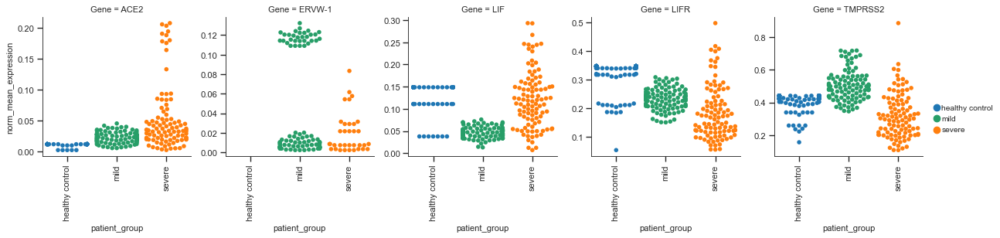

In [346]:
sns.set_style(style='ticks')
kind='swarm'
target_gns=sorted(['LIFR','ACE2','TMPRSS2','LIF','ERVW-1'])
target_gns_df=ade_mean_expr_df[ade_mean_expr_df.Gene.isin(target_gns)]
#col_pal_dict=dict(zip(target_gns_df.patient_group.unique(),sns.color_palette(n_colors=3).as_hex()))
#col_pal_dict={'healthy control': '#4daf4a', 'mild': '#e41a1c', 'severe': '#377eb8'}
col_pal_dict={'severe':'#ff7f0e', 'mild':'#279e68','healthy control':'#1f77b4'}
tmp_fig=sns.catplot(data=target_gns_df,col='Gene',hue='patient_group',kind=kind,sharey=False,
                    palette=col_pal_dict,col_order=target_gns,x='patient_group',height=3.0,
                    y='norm_mean_expression',
                    col_wrap=5).add_legend()
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
del target_gns_df,target_gns

/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 83.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 38.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 52.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 58.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/

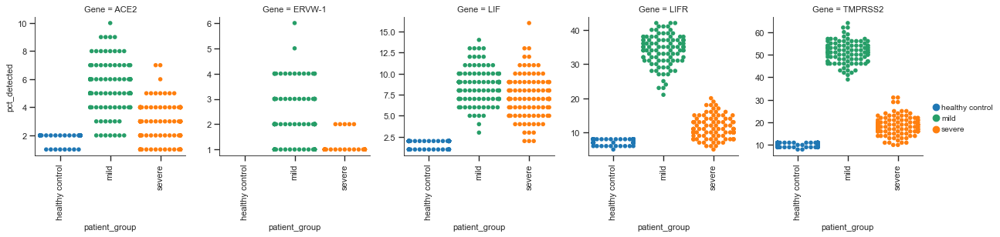

In [347]:
sns.set_style(style='ticks')
kind='swarm'
target_gns=sorted(['LIFR','ACE2','TMPRSS2','LIF','ERVW-1'])
target_gns_df=ade_mean_expr_df[ade_mean_expr_df.Gene.isin(target_gns)]
#col_pal_dict=dict(zip(target_gns_df.patient_group.unique(),sns.color_palette(n_colors=3).as_hex()))
#col_pal_dict={'healthy control': '#4daf4a', 'mild': '#e41a1c', 'severe': '#377eb8'}
col_pal_dict={'severe':'#ff7f0e', 'mild':'#279e68','healthy control':'#1f77b4'}
tmp_fig=sns.catplot(data=target_gns_df,col='Gene',hue='patient_group',kind=kind,sharey=False,
                    palette=col_pal_dict,col_order=target_gns,x='patient_group',height=3.0,y='pct_detected',
                    col_wrap=5).add_legend()
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
del target_gns_df,target_gns

/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 80.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 44.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 48.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 69.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/

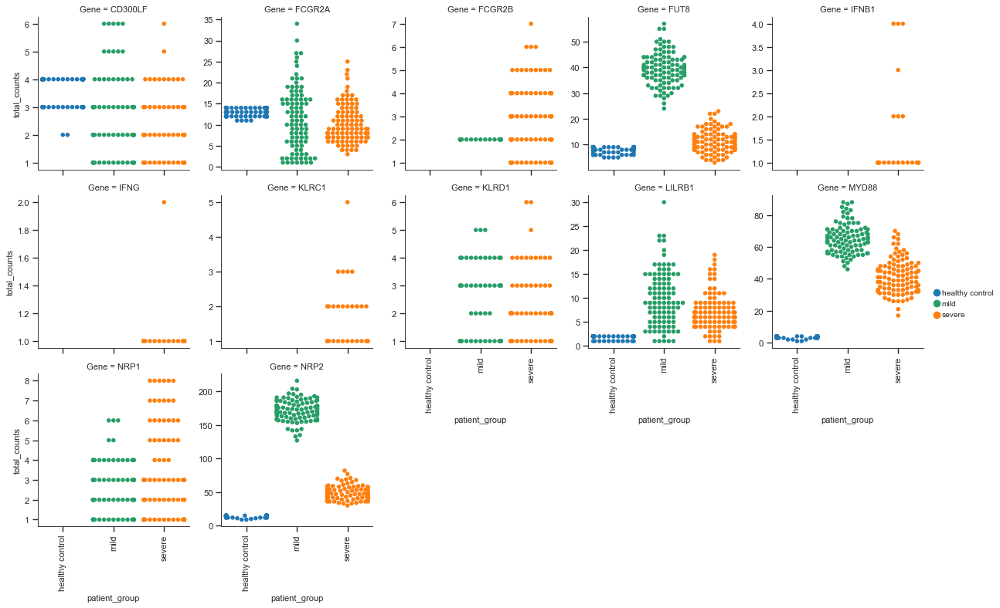

In [348]:
sns.set_style(style='ticks')
kind='swarm'
excluded_target_gns=['LIFR','ACE2','TMPRSS2','LIF','ERVW-1']
target_gns=sorted([g for g in ADE_GENES if not g in excluded_target_gns ])
target_gns_df=ade_mean_expr_df[ade_mean_expr_df.Gene.isin(target_gns)]
tmp_fig=sns.catplot(data=target_gns_df,col='Gene',hue='patient_group',kind=kind,sharey=False,
                    palette=col_pal_dict,col_order=target_gns,x='patient_group',height=3.0,
                    y='total_counts',col_wrap=5).add_legend()
for ax in tmp_fig.axes.flatten():
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
del target_gns_df,target_gns


In [349]:
# In specific cell populations

target_celltypes_lst=['Ciliated1','Ciliated_P1']
samples_lst=[]
ade_mean_expr_df_lst=[]
diff_res_lst=[]
subset_cells=100
replications=100
min_cells_detected=1
counts_per_cell_after= 10000 # None, 10000
#tmp_grp_dict={'mild':'mild', 'healthy control':'healthy control', 'severe':'severe'}
tmp_grp_dict={'mild':'covid', 'healthy control':'healthy control', 'severe':'covid'}
rank_genes_reference='healthy control'
rank_method='wilcoxon'
groupby='patient_group'
for k,v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for tv, tk in v.obs.groupby([groupby,'louvain']):
        tmp_predicted_type_lst=sps_predicted_types_dict[tv[0]][tv[1]]
        if len(set(tmp_predicted_type_lst).intersection(target_celltypes_lst))==0:continue 
        samples_lst.extend(tk.index.to_list())
ade_diff_adata=tmp_adata[samples_lst,:]
ade_diff_adata.var['feature_type']=[ensembl_id_featuretype_dict.get(g) for g in ade_diff_adata.var.index ]
tmp_patient_grp=['severe' if re.match(pattern='severe', string=g,flags=re.IGNORECASE) else g for g in ade_diff_adata.obs.Sample_characteristics_ch1_patient_group]
ade_diff_adata.obs[groupby]=[tmp_grp_dict[grp] for grp in tmp_patient_grp]

print(set(tmp_patient_grp))
del tmp_patient_grp

for rep in range(replications):
    print('Replicate:',rep+1)
    tmp_filt_samples=[]
    for k, v in ade_diff_adata.obs.groupby(groupby):
        tmp_diff_adata=ade_diff_adata[v.index,:]
        if not subset_cells is None and v.shape[0]>subset_cells:
            tmp_diff_samples=v.index.tolist()
            #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
            tmp_filt_samples.extend(np.random.choice(tmp_diff_samples,size=subset_cells,replace=False).tolist())
        else:
            print('Lessss than cut_off.....')
            tmp_filt_samples.extend(v.index.tolist())
            
    tmp_diff_adata=ade_diff_adata[tmp_filt_samples,:]
    del tmp_filt_samples
    tmp_diff_adata=tmp_diff_adata[:,tmp_diff_adata.var[tmp_diff_adata.var.feature_type=='protein_coding'].index.tolist()]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected,inplace=True)
    sc.pp.calculate_qc_metrics(adata=tmp_diff_adata,inplace=True)
    tmp_diff_adata.raw=tmp_diff_adata
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby=groupby, use_raw=False, 
                            method=rank_method,corr_method='benjamini-hochberg', n_genes=None,
                            reference=rank_genes_reference)
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj','logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=rep+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
        
    del tmp_names_df,tmp_scores_df,tmp_pvals_df
        
covid_patients_diff_res_df=pd.concat(diff_res_lst)  
covid_patients_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in covid_patients_diff_res_df.names]
del diff_res_lst
covid_patients_diff_res_df.head()

Trying to set attribute `.var` of view, copying.


mild
severe
healthy control
{'healthy control', 'mild', 'severe'}
Replicate: 1


filtered out 5605 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 2


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 3


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 4


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 5


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 6


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 7


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 8


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 9


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 10


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 11


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 12


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 13


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 14


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 15


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 16


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 17


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 18


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 19


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 20


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 21


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 22


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 23


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 24


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 25


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 26


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 27


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 28


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 29


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 30


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 31


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 32


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 33


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 34


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 35


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 36


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 37


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 38


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 39


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 40


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 41


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 42


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 43


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 44


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 45


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 46


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 47


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 48


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical


Replicate: 49


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 50


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 51


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 52


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 53


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 54


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 55


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 56


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 57


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 58


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 59


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 60


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 61


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 62


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 63


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 64


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 65


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 66


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 67


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 68


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 69


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 70


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 71


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 72


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 73


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 74


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 75


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 76


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 77


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 78


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 79


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 80


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 81


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 82


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 83


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 84


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 85


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 86


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 87


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 88


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 89


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 90


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 91


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 92


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 93


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 94


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 95


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 96


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 97


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 98


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 99


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

Replicate: 100


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical
... storing 'feature_type-0' as categorical
...

,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000160551,11.545,7.82301e-31,1.10656e-26,55.3749,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,1,healthy control_vs_covid,1,TAOK1
1,ENSG00000269028,10.2622,1.04267e-24,7.37428e-21,132.296,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,2,healthy control_vs_covid,1,MTRNR2L12
2,ENSG00000187608,9.85541,6.49517e-23,3.06247e-19,46.2152,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,3,healthy control_vs_covid,1,ISG15
3,ENSG00000228253,8.86706,7.51036e-19,2.65585e-15,31.4521,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,4,healthy control_vs_covid,1,MT-ATP8
4,ENSG00000185885,8.53476,1.4045e-17,3.97333e-14,17.7695,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,5,healthy control_vs_covid,1,IFITM1


In [350]:
groupby=['hgnc_symbol','comparison']
tmp_df=covid_patients_diff_res_df[covid_patients_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'healthy control_vs_covid')
pvals: 0.8988959002473977
pvals_adj: 0.9435637549499476
logfoldchanges: 1.6616747379302979

('CD300LF', 'healthy control_vs_covid')
pvals: 0.7994086897275259
pvals_adj: 0.9433549358884229
logfoldchanges: -3.431643009185791

('ERVW-1', 'healthy control_vs_covid')
pvals: 0.9027648250246225
pvals_adj: 0.9450220330308012
logfoldchanges: 22.80829429626465

('FCGR2A', 'healthy control_vs_covid')
pvals: 0.36338144645262993
pvals_adj: 0.689475292218515
logfoldchanges: -2.7619810104370117

('FCGR2B', 'healthy control_vs_covid')
pvals: 0.806968367170738
pvals_adj: 0.9450170927540729
logfoldchanges: 24.901305198669434

('FUT8', 'healthy control_vs_covid')
pvals: 0.41865221796640495
pvals_adj: 0.730266818534212
logfoldchanges: -1.354337990283966

('IFNB1', 'healthy control_vs_covid')
pvals: 0.9027648250246225
pvals_adj: 0.9440351478316534
logfoldchanges: 24.555295944213867

('IFNG', 'healthy control_vs_covid')
pvals: 0.9027648250246225
pvals_adj: 0.942511925278

In [351]:
# Specific Ciliated SPs analysis

target_celltypes_lst=['Ciliated1','Ciliated_P1']
samples_lst=[]
ade_mean_expr_df_lst=[]
diff_res_lst=[]
subset_cells=300
replications=100
min_cells_detected=1
counts_per_cell_after= 10000 # None, 10000
rank_genes_reference='healthy control'
rank_method='wilcoxon'
for k,v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for tv, tk in v.obs.groupby(['patient_group','louvain']):
        tmp_predicted_type_lst=sps_predicted_types_dict[tv[0]][tv[1]]
        if len(set(tmp_predicted_type_lst).intersection(target_celltypes_lst))==0:continue 
        samples_lst.extend(tk.index.to_list())
ade_diff_adata=tmp_adata[samples_lst,:]
ade_diff_adata.var['feature_type']=[ensembl_id_featuretype_dict.get(g) for g in ade_diff_adata.var.index ]
tmp_patient_grp=['severe' if re.match(pattern='severe', string=g,flags=re.IGNORECASE) else g for g in ade_diff_adata.obs.Sample_characteristics_ch1_patient_group]
ade_diff_adata.obs['patient_group']=tmp_patient_grp
del tmp_patient_grp

for rep in range(replications):
    print('Replicate:',rep+1)
    tmp_filt_samples=[]
    for k, v in ade_diff_adata.obs.groupby('patient_group'):
        tmp_diff_adata=ade_diff_adata[v.index,:]
        if not subset_cells is None and v.shape[0]>subset_cells:
            tmp_diff_samples=v.index.tolist()
            #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
            tmp_filt_samples.extend(np.random.choice(tmp_diff_samples,size=subset_cells,replace=False).tolist())
        else:
            tmp_filt_samples.extend(v.index.tolist())
            
    tmp_diff_adata=ade_diff_adata[tmp_filt_samples,:]
    del tmp_filt_samples
    tmp_diff_adata=tmp_diff_adata[:,tmp_diff_adata.var[tmp_diff_adata.var.feature_type=='protein_coding'].index.tolist()]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected,inplace=True)
    sc.pp.calculate_qc_metrics(adata=tmp_diff_adata,inplace=True)
    tmp_diff_adata.raw=tmp_diff_adata
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby='patient_group', use_raw=False, 
                            method=rank_method,corr_method='benjamini-hochberg', n_genes=None,
                            reference=rank_genes_reference)
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj','logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=rep+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
        
    del tmp_names_df,tmp_scores_df,tmp_pvals_df
        
covid_patients_diff_res_df=pd.concat(diff_res_lst)  
covid_patients_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in covid_patients_diff_res_df.names]
del diff_res_lst
covid_patients_diff_res_df.head()

Trying to set attribute `.var` of view, copying.


mild
severe
healthy control
Replicate: 1


filtered out 3828 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 2


filtered out 3868 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 3


filtered out 3814 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 4


filtered out 3780 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... stori

Replicate: 5


filtered out 3877 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 6


filtered out 3828 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 7


filtered out 3806 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 8


filtered out 3815 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 9


filtered out 3805 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 10


filtered out 3804 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 11


filtered out 3878 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... stori

Replicate: 12


filtered out 3910 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 13


filtered out 3871 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 14


filtered out 3814 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 15


filtered out 3899 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 16


filtered out 3810 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 17


filtered out 3836 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 18


filtered out 3803 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 19


filtered out 3881 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 20


filtered out 3847 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 21


filtered out 3785 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 22


filtered out 3759 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 23


filtered out 3832 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 24


filtered out 3819 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 25


filtered out 3851 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 26


filtered out 3842 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 27


filtered out 3838 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 28


filtered out 3868 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 29


filtered out 3836 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 30


filtered out 3819 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 31


filtered out 3893 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... stori

Replicate: 32


filtered out 3755 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 33


filtered out 3849 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 34


filtered out 3801 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 35


filtered out 3779 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 36


filtered out 3848 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 37


filtered out 3765 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... stori

Replicate: 38


filtered out 3784 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 39


filtered out 3766 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 40


filtered out 3836 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 41


filtered out 3854 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 42


filtered out 3838 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 43


filtered out 3910 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 44


filtered out 3830 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 45


filtered out 3851 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 46


filtered out 3784 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 47


filtered out 3823 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 48


filtered out 3858 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 49


filtered out 3829 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 50


filtered out 3823 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 51


filtered out 3862 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 52


filtered out 3809 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 53


filtered out 3837 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 54


filtered out 3868 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 55


filtered out 3879 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 56


filtered out 3826 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 57


filtered out 3891 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... stori

Replicate: 58


filtered out 3837 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 59


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 60


filtered out 3854 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 61


filtered out 3840 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 62


filtered out 3882 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 63


filtered out 3854 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 64


filtered out 3809 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 65


filtered out 3784 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 66


filtered out 3768 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 67


filtered out 3832 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 68


filtered out 3831 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 69


filtered out 3822 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 70


filtered out 3868 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... stori

Replicate: 71


filtered out 3864 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 72


filtered out 3844 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 73


filtered out 3869 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 74


filtered out 3866 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 75


filtered out 3832 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... stori

Replicate: 76


filtered out 3895 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 77


filtered out 3848 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 78


filtered out 3841 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 79


filtered out 3832 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 80


filtered out 3928 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 81


filtered out 3885 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 82


filtered out 3860 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 83


filtered out 3930 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 84


filtered out 3845 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 85


filtered out 3824 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 86


filtered out 3838 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 87


filtered out 3838 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 88


filtered out 3877 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 89


filtered out 3840 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 90


filtered out 3917 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 91


filtered out 3811 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 92


filtered out 3806 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 93


filtered out 3816 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 94


filtered out 3805 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 95


filtered out 3835 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 96


filtered out 3836 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 97


filtered out 3844 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 98


filtered out 3854 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 99


filtered out 3813 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

Replicate: 100


filtered out 3863 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'p

,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000228253,14.6362,1.65154e-48,2.62958e-44,67.069,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,1,healthy control_vs_mild,1,MT-ATP8
1,ENSG00000269028,14.3883,6.13199e-47,4.88168e-43,47.3277,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,2,healthy control_vs_mild,1,MTRNR2L12
2,ENSG00000185885,14.237,5.40312e-46,2.54952e-42,21.9178,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,3,healthy control_vs_mild,1,IFITM1
3,ENSG00000212907,14.2251,6.40502e-46,2.54952e-42,60.99,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,4,healthy control_vs_mild,1,MT-ND4L
4,ENSG00000160551,14.1056,3.5063e-45,1.11655e-41,16.0187,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,5,healthy control_vs_mild,1,TAOK1


In [352]:
groupby=['hgnc_symbol','comparison']
tmp_df=covid_patients_diff_res_df[covid_patients_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'healthy control_vs_mild')
pvals: 0.5914714643542411
pvals_adj: 0.7971491037572188
logfoldchanges: 1.1392801403999329

('ACE2', 'healthy control_vs_severe')
pvals: 0.8557738631721844
pvals_adj: 1.0
logfoldchanges: 1.8731011152267456

('CD300LF', 'healthy control_vs_mild')
pvals: 0.7462821451775665
pvals_adj: 0.9529327568501459
logfoldchanges: -3.4645633697509766

('CD300LF', 'healthy control_vs_severe')
pvals: 0.7462821451775665
pvals_adj: 1.0
logfoldchanges: -2.366229295730591

('ERVW-1', 'healthy control_vs_mild')
pvals: 0.7190666442862423
pvals_adj: 0.9265993026606236
logfoldchanges: 25.41079330444336

('ERVW-1', 'healthy control_vs_severe')
pvals: 0.9181429120066437
pvals_adj: 1.0
logfoldchanges: 22.932331085205078

('FCGR2A', 'healthy control_vs_mild')
pvals: 0.1141839748774719
pvals_adj: 0.18341910805735678
logfoldchanges: -4.697281360626221

('FCGR2A', 'healthy control_vs_severe')
pvals: 0.2731783900296426
pvals_adj: 0.7951965179026503
logfoldchanges: -2.712196707725525

In [353]:
# Specific Ciliated SPs analysis

target_celltypes_lst=['Ciliated1','Ciliated_P1']
samples_lst=[]
ade_mean_expr_df_lst=[]
diff_res_lst=[]
subset_cells=100
replications=100
min_cells_detected=1
counts_per_cell_after= 10000 # None, 10000
rank_genes_reference='healthy control'
rank_method='wilcoxon'
ade_diff_adata_lst=[]
for k,v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for tv, tk in v.obs.groupby(['patient_group','louvain']):
        tmp_predicted_type_lst=sps_predicted_types_dict[tv[0]][tv[1]]
        if len(set(tmp_predicted_type_lst).intersection(target_celltypes_lst))==0:continue 
        ade_diff_adata_lst.append(v[tk.index.to_list(),:])
    del v
    
ade_diff_adata=ade_diff_adata_lst[0].concatenate(ade_diff_adata_lst[1::],join='inner')
ade_diff_adata.obs_names=[n.split('-')[0] for n in ade_diff_adata.obs_names]
ade_diff_adata.var_names=[n for n in ade_diff_adata.var_names]
del ade_diff_adata_lst
print(ade_diff_adata.shape)

ade_diff_adata.var['feature_type']=[ensembl_id_featuretype_dict.get(g) for g in ade_diff_adata.var.index]
tmp_patient_grp=['severe' if re.match(pattern='severe', string=g,flags=re.IGNORECASE) else g for g in ade_diff_adata.obs.Sample_characteristics_ch1_patient_group]
ade_diff_adata.obs['patient_group']=tmp_patient_grp
del tmp_patient_grp

for rep in range(replications):
    print('Replicate:',rep+1)
    tmp_filt_samples=[]
    for k, v in ade_diff_adata.obs.groupby('patient_group'):
        print(k)
        tmp_diff_adata=ade_diff_adata[v.index,:]
        if not subset_cells is None and v.shape[0]>subset_cells:
            tmp_diff_samples=v.index.tolist()
            #tmp_diff_samples=[tmp_diff_samples[n] for n in np.random.choice([i for i in range(len(tmp_diff_samples))],size=subset_cells,replace=False)]
            tmp_filt_samples.extend(np.random.choice(tmp_diff_samples,size=subset_cells,replace=False).tolist())
        else:
            tmp_filt_samples.extend(v.index.tolist())
            
    tmp_diff_adata=ade_diff_adata[tmp_filt_samples,:]
    del tmp_filt_samples
    #tmp_diff_adata=tmp_diff_adata[:,tmp_diff_adata.var[tmp_diff_adata.var.feature_type=='protein_coding'].index.tolist()]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected,inplace=True)
    sc.pp.calculate_qc_metrics(adata=tmp_diff_adata,inplace=True)
    tmp_diff_adata.raw=tmp_diff_adata
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby='patient_group', use_raw=False, 
                            method=rank_method,corr_method='benjamini-hochberg', n_genes=None,
                            reference=rank_genes_reference)
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj','logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=rep+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
        
    del tmp_names_df,tmp_scores_df,tmp_pvals_df
        
covid_patients_diff_res_df=pd.concat(diff_res_lst)  
covid_patients_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in covid_patients_diff_res_df.names]
del diff_res_lst
covid_patients_diff_res_df.head()

mild
severe
healthy control
(1972, 14845)
Replicate: 1
healthy control
mild
severe


filtered out 677 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 2
healthy control
mild
severe


filtered out 670 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 3
healthy control
mild
severe


filtered out 684 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 4
healthy control
mild
severe


filtered out 636 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 5
healthy control
mild
severe


filtered out 702 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 6
healthy control
mild
severe


filtered out 691 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 7
healthy control
mild
severe


filtered out 650 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 8
healthy control
mild
severe


filtered out 685 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 9
healthy control
mild
severe


filtered out 671 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 10
healthy control
mild
severe


filtered out 648 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 11
healthy control
mild
severe


filtered out 622 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 12
healthy control
mild
severe


filtered out 671 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 13
healthy control
mild
severe


filtered out 736 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 14
healthy control
mild
severe


filtered out 632 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 15
healthy control
mild
severe


filtered out 717 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 16
healthy control
mild
severe


filtered out 690 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 17
healthy control
mild
severe


filtered out 676 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 18
healthy control
mild
severe


filtered out 679 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 19
healthy control
mild
severe


filtered out 698 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 20
healthy control
mild
severe


filtered out 701 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 21
healthy control
mild
severe


filtered out 665 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 22
healthy control
mild
severe


filtered out 699 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 23
healthy control
mild
severe


filtered out 710 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 24
healthy control
mild
severe


filtered out 720 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 25
healthy control
mild
severe


filtered out 692 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 26
healthy control
mild
severe


filtered out 670 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 27
healthy control
mild
severe


filtered out 620 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 28
healthy control
mild
severe


filtered out 715 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 29
healthy control
mild
severe


filtered out 682 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 30
healthy control
mild
severe


filtered out 653 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 31
healthy control
mild
severe


filtered out 761 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 32
healthy control
mild
severe


filtered out 674 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 33
healthy control
mild
severe


filtered out 756 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 34
healthy control
mild
severe


filtered out 618 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 35
healthy control
mild
severe


filtered out 696 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 36
healthy control
mild
severe


filtered out 726 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 37
healthy control
mild
severe


filtered out 749 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 38
healthy control
mild
severe


filtered out 609 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 39
healthy control
mild
severe


filtered out 722 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 40
healthy control
mild
severe


filtered out 697 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 41
healthy control
mild
severe


filtered out 639 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 42
healthy control
mild
severe


filtered out 713 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 43
healthy control
mild
severe


filtered out 697 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 44
healthy control
mild
severe


filtered out 724 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 45
healthy control
mild
severe


filtered out 690 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 46
healthy control
mild
severe


filtered out 721 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 47
healthy control
mild
severe


filtered out 723 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 48
healthy control
mild
severe


filtered out 729 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 49
healthy control
mild
severe


filtered out 708 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 50
healthy control
mild
severe


filtered out 664 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 51
healthy control
mild
severe


filtered out 715 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 52
healthy control
mild
severe


filtered out 717 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 53
healthy control
mild
severe


filtered out 692 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 54
healthy control
mild
severe


filtered out 644 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 55
healthy control
mild
severe


filtered out 762 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 56
healthy control
mild
severe


filtered out 689 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 57
healthy control
mild
severe


filtered out 711 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 58
healthy control
mild
severe


filtered out 627 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 59
healthy control
mild
severe


filtered out 753 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 60
healthy control
mild
severe


filtered out 703 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 61
healthy control
mild
severe


filtered out 685 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 62
healthy control
mild
severe


filtered out 718 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 63
healthy control
mild
severe


filtered out 702 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 64
healthy control
mild
severe


filtered out 637 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 65
healthy control
mild
severe


filtered out 646 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 66
healthy control
mild
severe


filtered out 764 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 67
healthy control
mild
severe


filtered out 690 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 68
healthy control
mild
severe


filtered out 727 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 69
healthy control
mild
severe


filtered out 673 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 70
healthy control
mild
severe


filtered out 711 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 71
healthy control
mild
severe


filtered out 689 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 72
healthy control
mild
severe


filtered out 741 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 73
healthy control
mild
severe


filtered out 657 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 74
healthy control
mild
severe


filtered out 643 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 75
healthy control
mild
severe


filtered out 683 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 76
healthy control
mild
severe


filtered out 693 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 77
healthy control
mild
severe


filtered out 637 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 78
healthy control
mild
severe


filtered out 630 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 79
healthy control
mild
severe


filtered out 685 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sor

Replicate: 80
healthy control
mild
severe


filtered out 689 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 81
healthy control
mild
severe


filtered out 680 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 82
healthy control
mild
severe


filtered out 656 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 83
healthy control
mild
severe


filtered out 730 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 84
healthy control
mild
severe


filtered out 688 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 85
healthy control
mild
severe


filtered out 721 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 86
healthy control
mild
severe


filtered out 664 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 87
healthy control
mild
severe


filtered out 649 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 88
healthy control
mild
severe


filtered out 748 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 89
healthy control
mild
severe


filtered out 644 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 90
healthy control
mild
severe


filtered out 708 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 91
healthy control
mild
severe


filtered out 707 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 92
healthy control
mild
severe


filtered out 764 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 93
healthy control
mild
severe


filtered out 655 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 94
healthy control
mild
severe


filtered out 708 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 95
healthy control
mild
severe


filtered out 628 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 96
healthy control
mild
severe


filtered out 637 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 97
healthy control
mild
severe


filtered out 692 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 98
healthy control
mild
severe


filtered out 733 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 99
healthy control
mild
severe


filtered out 725 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

Replicate: 100
healthy control
mild
severe


filtered out 694 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_description' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_title' as categorical
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
 

,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,MTRNR2L12,11.6061,3.83734e-31,1.81225e-27,38.1869,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,1,healthy control_vs_mild,1,nan
1,MT-ATP8,11.1981,4.16801e-29,1.18105e-25,13.5726,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,2,healthy control_vs_mild,1,nan
2,IFITM1,11.1614,6.29914e-29,1.48744e-25,10.0899,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,3,healthy control_vs_mild,1,nan
3,IFIT1,10.7411,6.52356e-27,1.05449e-23,7.54519,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,4,healthy control_vs_mild,1,nan
4,TAOK1,10.6019,2.92098e-26,3.76222e-23,7.73478,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,5,healthy control_vs_mild,1,nan


In [354]:
groupby=['names','comparison']
tmp_df=covid_patients_diff_res_df[covid_patients_diff_res_df.names.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals min:',tmp_df.loc[v,:]['pvals'].min(),':','pvals max:',tmp_df.loc[v,:]['pvals'].max())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('CD300LF', 'healthy control_vs_mild')
pvals: 0.7121645311238327
pvals min: 0.17121888641309146 : pvals max: 0.9961009309805384
pvals_adj: 0.9032374517078603
logfoldchanges: -3.2733240127563477

('CD300LF', 'healthy control_vs_severe')
pvals: 0.7994086897275259
pvals min: 0.38438432655641375 : pvals max: 1.0
pvals_adj: 1.0
logfoldchanges: -2.674123167991638

('FCGR2A', 'healthy control_vs_mild')
pvals: 0.20128737241155936
pvals min: 0.0871970644902114 : pvals max: 0.4371601472973765
pvals_adj: 0.2964722920994284
logfoldchanges: -5.37216329574585

('FCGR2A', 'healthy control_vs_severe')
pvals: 0.43356478685131283
pvals min: 0.16518428282056707 : pvals max: 0.8969623327234771
pvals_adj: 0.9401629713417206
logfoldchanges: -3.1683743000030518

('FCGR2B', 'healthy control_vs_mild')
pvals: 1.0
pvals min: 0.7103432665782834 : pvals max: 1.0
pvals_adj: 1.0
logfoldchanges: 0.0

('FCGR2B', 'healthy control_vs_severe')
pvals: 0.806968367170738
pvals min: 0.010520703830363243 : pvals max: 1.0
pval

In [355]:
# non-specific populations 

samples_lst=[]
ade_mean_expr_df_lst=[]
diff_res_lst=[]
subset_cells=1000
replications=10
min_cells_detected=1
counts_per_cell_after= 10000 # None, 10000
rank_genes_reference='healthy control'
rank_method='wilcoxon'
for k,v in tmp_adata_batch_corrected_dict.items():
    print(k)
    samples_lst.extend(v.obs.index.to_list())

ade_diff_adata=tmp_adata[samples_lst,:]
ade_diff_adata.var['feature_type']=[ensembl_id_featuretype_dict.get(g) for g in ade_diff_adata.var.index ]
tmp_patient_grp=['severe' if re.match(pattern='severe', string=g,flags=re.IGNORECASE) else g for g in ade_diff_adata.obs.Sample_characteristics_ch1_patient_group]
ade_diff_adata.obs['patient_group']=tmp_patient_grp
del tmp_patient_grp

for rep in range(replications):
    print('Replicate:',rep+1)
    tmp_filt_samples=[]
    for k, v in ade_diff_adata.obs.groupby('patient_group'):
        tmp_diff_adata=ade_diff_adata[v.index,:]
        if not subset_cells is None and v.shape[0]>subset_cells:
            
            tmp_diff_samples=v.index.tolist()
            tmp_filt_samples.extend(np.random.choice(tmp_diff_samples,size=subset_cells,replace=False).tolist())
        else:
            tmp_filt_samples.extend(v.index.tolist())
    tmp_diff_adata=ade_diff_adata[tmp_filt_samples,:]
    del tmp_filt_samples
    tmp_diff_adata=tmp_diff_adata[:,tmp_diff_adata.var[tmp_diff_adata.var.feature_type=='protein_coding'].index.tolist()]
    sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected,inplace=True)
    sc.pp.calculate_qc_metrics(adata=tmp_diff_adata,inplace=True)
    print(tmp_diff_adata.shape)
    tmp_diff_adata.raw=tmp_diff_adata
    if not counts_per_cell_after is None:
        sc.pp.normalize_per_cell(tmp_diff_adata,counts_per_cell_after=counts_per_cell_after)
    sc.tl.rank_genes_groups(tmp_diff_adata, groupby='patient_group', use_raw=False, 
                            method=rank_method,corr_method='benjamini-hochberg', n_genes=None,
                            reference=rank_genes_reference)
    test_array=tmp_diff_adata.uns['rank_genes_groups']
    temp_params_dict=test_array['params']
    tmp_names_df=pd.DataFrame(test_array['names'])
    tmp_scores_df=pd.DataFrame(test_array['scores'])
    tmp_pvals_df=pd.DataFrame(test_array['pvals'])
    tmp_pvals_adj_df=pd.DataFrame(test_array['pvals_adj'])
    tmp_lfc_df=pd.DataFrame(test_array['logfoldchanges'])
    for grp in tmp_names_df.columns:
        tmp_grp_diff_res_df=pd.DataFrame([tmp_names_df[grp].to_list(),tmp_scores_df[grp].to_list(),
                                          tmp_pvals_df[grp].to_list(),tmp_pvals_adj_df[grp].to_list(),
                                          tmp_lfc_df[grp].to_list()],
                                         index=['names','scores','pvals','pvals_adj','logfoldchanges']).transpose()
        for tk, tv in temp_params_dict.items():
            tmp_grp_diff_res_df[tk]=tv 
        tmp_grp_diff_res_df['rank']=[r+1 for r in range(tmp_grp_diff_res_df.shape[0])]
        tmp_grp_diff_res_df['comparison']=temp_params_dict['reference']+'_vs_'+grp    
        tmp_grp_diff_res_df['replicate']=rep+1
        diff_res_lst.append(tmp_grp_diff_res_df)
        del tmp_grp_diff_res_df
        
    del tmp_names_df,tmp_scores_df,tmp_pvals_df
        
covid_patients_diff_res_df=pd.concat(diff_res_lst)  
covid_patients_diff_res_df['hgnc_symbol']=[ensemble_gn_hugo_name_dict[gn] if gn in ensemble_gn_hugo_name_dict else 'nan' for gn in covid_patients_diff_res_df.names]
del diff_res_lst
covid_patients_diff_res_df.head()

mild
severe
healthy control


Trying to set attribute `.var` of view, copying.


Replicate: 1


filtered out 3470 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16280)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 2


filtered out 3535 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16215)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 3


filtered out 3542 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16208)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 4


filtered out 3467 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16283)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 5


filtered out 3487 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16263)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 6


filtered out 3525 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16225)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 7


filtered out 3452 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16298)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 8


filtered out 3490 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16260)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 9


filtered out 3531 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16219)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


Replicate: 10


filtered out 3539 genes that are detected in less than 1 cells
Trying to set attribute `.var` of view, copying.
normalizing by total count per cell


(3000, 16211)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
ranking genes
... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'obs_names' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'patient_group' as categorical
... storing 'Gene-0' as categorical


,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000142089,33.8811,1.26295e-251,2.05608e-247,48.1835,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,1,healthy control_vs_mild,1,IFITM3
1,ENSG00000160551,33.4304,4.95973e-245,3.80858e-241,17.0094,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,2,healthy control_vs_mild,1,TAOK1
2,ENSG00000269028,33.42,7.01826e-245,3.80858e-241,18.2501,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,3,healthy control_vs_mild,1,MTRNR2L12
3,ENSG00000185885,33.2392,2.9202e-242,1.18852e-238,38.5207,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,4,healthy control_vs_mild,1,IFITM1
4,ENSG00000185745,32.9134,1.41495e-237,3.83924e-234,20.588,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,5,healthy control_vs_mild,1,IFIT1


In [356]:
groupby=['hgnc_symbol','comparison']
tmp_df=covid_patients_diff_res_df[covid_patients_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals min:',tmp_df.loc[v,:]['pvals'].min(),':','pvals max:',tmp_df.loc[v,:]['pvals'].max())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'healthy control_vs_mild')
pvals: 0.8769154334286673
pvals min: 0.7274786863552671 : pvals max: 1.0
pvals_adj: 1.0
logfoldchanges: 20.648510932922363

('ACE2', 'healthy control_vs_severe')
pvals: 0.8769612226628399
pvals min: 0.786359435228071 : pvals max: 1.0
pvals_adj: 1.0
logfoldchanges: 21.455114364624023

('CD300LF', 'healthy control_vs_mild')
pvals: 0.012759762086669027
pvals min: 1.2438142675058163e-05 : pvals max: 0.13316879643129192
pvals_adj: 0.026185000936355184
logfoldchanges: -1.119320571422577

('CD300LF', 'healthy control_vs_severe')
pvals: 3.812810181146856e-12
pvals min: 2.7882640034598806e-15 : pvals max: 1.8555708819876532e-08
pvals_adj: 7.196291437441893e-11
logfoldchanges: -2.427499771118164

('ERVW-1', 'healthy control_vs_mild')
pvals: 0.9382732748866658
pvals min: 0.8769154334286673 : pvals max: 1.0
pvals_adj: 1.0
logfoldchanges: 19.951448440551758

('ERVW-1', 'healthy control_vs_severe')
pvals: 0.9691135043841288
pvals min: 0.1753521208389327 : pvals ma

In [357]:
hca_diff_res_df.head()

,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000197728,12.4491,1.41454e-35,7.54702e-33,10.7382,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,1,right_normal_vs_hypertensive,1,RPS26
1,ENSG00000140988,12.1665,4.6887e-34,2.34523e-31,43.9622,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,2,right_normal_vs_hypertensive,1,RPS2
2,ENSG00000184007,11.7058,1.18989e-31,5.60159e-29,5.24354,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,3,right_normal_vs_hypertensive,1,PTP4A2
3,ENSG00000089157,11.4689,1.89023e-30,7.7577e-28,18.764,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,4,right_normal_vs_hypertensive,1,RPLP0
4,ENSG00000074800,11.398,4.27719e-30,1.71152e-27,10.3693,disease_state,right_normal,wilcoxon,False,None,benjamini-hochberg,5,right_normal_vs_hypertensive,1,ENO1


In [358]:
covid_patients_diff_res_df.head()

,names,scores,pvals,pvals_adj,logfoldchanges,groupby,reference,method,use_raw,layer,corr_method,rank,comparison,replicate,hgnc_symbol
0,ENSG00000142089,33.8811,1.26295e-251,2.05608e-247,48.1835,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,1,healthy control_vs_mild,1,IFITM3
1,ENSG00000160551,33.4304,4.95973e-245,3.80858e-241,17.0094,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,2,healthy control_vs_mild,1,TAOK1
2,ENSG00000269028,33.42,7.01826e-245,3.80858e-241,18.2501,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,3,healthy control_vs_mild,1,MTRNR2L12
3,ENSG00000185885,33.2392,2.9202e-242,1.18852e-238,38.5207,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,4,healthy control_vs_mild,1,IFITM1
4,ENSG00000185745,32.9134,1.41495e-237,3.83924e-234,20.588,patient_group,healthy control,wilcoxon,False,None,benjamini-hochberg,5,healthy control_vs_mild,1,IFIT1


In [359]:
groupby=['hgnc_symbol','comparison']
tmp_df=covid_patients_diff_res_df[covid_patients_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'healthy control_vs_mild')
pvals: 0.8769154334286673
pvals_adj: 1.0
logfoldchanges: 20.648510932922363

('ACE2', 'healthy control_vs_severe')
pvals: 0.8769612226628399
pvals_adj: 1.0
logfoldchanges: 21.455114364624023

('CD300LF', 'healthy control_vs_mild')
pvals: 0.012759762086669027
pvals_adj: 0.026185000936355184
logfoldchanges: -1.119320571422577

('CD300LF', 'healthy control_vs_severe')
pvals: 3.812810181146856e-12
pvals_adj: 7.196291437441893e-11
logfoldchanges: -2.427499771118164

('ERVW-1', 'healthy control_vs_mild')
pvals: 0.9382732748866658
pvals_adj: 1.0
logfoldchanges: 19.951448440551758

('ERVW-1', 'healthy control_vs_severe')
pvals: 0.9691135043841288
pvals_adj: 1.0
logfoldchanges: 4.730001449584961

('FCGR2A', 'healthy control_vs_mild')
pvals: 0.11437398191012371
pvals_adj: 0.19077520212228471
logfoldchanges: -0.7953299582004547

('FCGR2A', 'healthy control_vs_severe')
pvals: 0.38209832491910034
pvals_adj: 0.9997601875172255
logfoldchanges: 0.6409369707107544

(

In [360]:
groupby=['hgnc_symbol','comparison']
tmp_df=hca_diff_res_df[hca_diff_res_df.hgnc_symbol.isin(ADE_GENES)]
for k,v in tmp_df.groupby(groupby).groups.items():
    print(k)
    print('pvals:',tmp_df.loc[v,:]['pvals'].median())
    print('pvals_adj:',tmp_df.loc[v,:]['pvals_adj'].median())
    print('logfoldchanges:',tmp_df.loc[v,:]['logfoldchanges'].median())
    print()

('ACE2', 'right_normal_vs_hypertensive')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 0.0

('ACE2', 'right_normal_vs_left_normal')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 0.0

('CD300LF', 'right_normal_vs_hypertensive')
pvals: 0.01097588200629427
pvals_adj: 0.12887029548928514
logfoldchanges: -4.1761474609375

('CD300LF', 'right_normal_vs_left_normal')
pvals: 0.5043508039078508
pvals_adj: 1.0
logfoldchanges: -0.31556594371795654

('ERVW-1', 'right_normal_vs_hypertensive')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 21.657133102416992

('ERVW-1', 'right_normal_vs_left_normal')
pvals: 0.943674862164647
pvals_adj: 1.0
logfoldchanges: 0.0

('FCGR2A', 'right_normal_vs_hypertensive')
pvals: 1.3922028073575716e-05
pvals_adj: 0.00040204885257471624
logfoldchanges: -3.879995346069336

('FCGR2A', 'right_normal_vs_left_normal')
pvals: 0.5914955705457708
pvals_adj: 1.0
logfoldchanges: 0.3570702373981476

('FCGR2B', 'right_normal_vs_hypertensive')
pvals: 0.005

In [ ]:
ade_ensembl_id_dict

In [ ]:
# Perform differential expression analysis based on Libra methods( negative binomial and wilkoxan test)

In [ ]:
# Specific Ciliated SPs analysis

In [428]:
sps_types_set=set()
for k, v in sps_predicted_types_dict.items():
    for tk,tv in v.items():
        sps_types_set.update(tv)
sorted(sps_types_set)

['Bcells',
 'Ciliated1',
 'Ciliated_P1',
 'Dendriticcells',
 'Goblet',
 'Goblet2',
 'Goblet_1',
 'Immuno_Monocytes',
 'Immuno_TCells',
 'Luminal_Macrophages',
 'Mesothelial_P1',
 'Neutrophils',
 'Secretory1',
 'Secretory2',
 'TandNK',
 'Type_1_alveolar']

In [ ]:
target_celltypes_lst=['Ciliated1','Ciliated_P1']
subset_cells=100
replications=1000
min_cells_detected=3
cell_type='ciliated'
out_dir=path.join(str(sc.settings.writedir),'results/diff_expression_analysis/covid_samples')
utils.safe_mkdir(out_dir)
print(path.abspath(out_dir))
samples_lst=[]
for k,v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for tv, tk in v.obs.groupby(['patient_group','louvain']):
        tmp_predicted_type_lst=sps_predicted_types_dict[tv[0]][tv[1]]
        if len(set(tmp_predicted_type_lst).intersection(target_celltypes_lst))==0:continue 
        samples_lst.extend(tk.index.to_list())
ade_diff_adata=tmp_adata[samples_lst,:]
ade_diff_adata.var['feature_type']=[ensembl_id_featuretype_dict.get(g) for g in ade_diff_adata.var.index]
ade_diff_adata=ade_diff_adata[:,ade_diff_adata.var.feature_type=='protein_coding']
tmp_patient_grp=['severe' if re.match(pattern='severe', string=g,flags=re.IGNORECASE) else g for g in ade_diff_adata.obs.Sample_characteristics_ch1_patient_group]
ade_diff_adata.obs['patient_group']=tmp_patient_grp
del tmp_patient_grp
tmp_dir=path.join(out_dir,cell_type)
utils.safe_mkdir(tmp_dir)
print(path.abspath(tmp_dir))
for rep in range(replications):
    print('Replicate:',rep+1)
    tmp_diff_adata_lst=[]
    for k, v in ade_diff_adata.obs.groupby('patient_group'):
        print(k)
        tmp_diff_adata=ade_diff_adata[v.index,:]
        if not subset_cells is None and v.shape[0]>subset_cells:
            tmp_diff_samples=v.index.tolist()
            tmp_diff_samples=np.random.choice(tmp_diff_samples,size=subset_cells,replace=False)
            tmp_diff_adata=ade_diff_adata[tmp_diff_samples,:]
            tmp_diff_adata_lst.append(tmp_diff_adata)
            del tmp_diff_samples,tmp_diff_adata
        else:
            print('Less than cut off')
            tmp_diff_adata=ade_diff_adata[v.index.tolist(),:]
            tmp_diff_adata_lst.append(tmp_diff_adata)
            print(tmp_diff_adata.shape)
            del tmp_diff_adata
            
    tmp_diff_adata=tmp_diff_adata_lst[0].concatenate(tmp_diff_adata_lst[1::])
    del tmp_diff_adata_lst
    #sc.pp.filter_genes(data=tmp_diff_adata,min_cells=min_cells_detected,inplace=True)
    tmp_diff_adata.var_names=[gn.replace('_','-') for gn in tmp_diff_adata.var_names]
    tmp_diff_adata.obs_names=[c.replace('_','-') for c in tmp_diff_adata.obs_names]
    
    tmp_diff_adata.obs["replicate"]=[rp.split('-')[1] for rp in tmp_diff_adata.obs.index]
    #tmp_diff_adata.obs["label"]=['healthy' if grp=='healthy control' else 'disease' for grp in tmp_diff_adata.obs['patient_group']]
    tmp_diff_adata.obs["label"]=tmp_diff_adata.obs['patient_group'].to_list()
    tmp_diff_adata.obs["cell_type"]=[cell_type for rp in tmp_diff_adata.obs.index]
    
    for combn in itertools.combinations(set(tmp_diff_adata.obs['label']),2):
        print(combn)
        tmp_diff_out_adata=tmp_diff_adata[tmp_diff_adata.obs.label.isin(combn),:]
        sc.pp.filter_genes(data=tmp_diff_out_adata,min_cells=min_cells_detected)
        tmp_diff_out_adata=tmp_diff_out_adata[:,sorted(set(ade_ensembl_id_dict.keys()).intersection(tmp_diff_out_adata.var_names))]
        tmp_cnts_fname='_'.join(sorted(combn))+'_replicate_'+str(rep+1)+'_'+cell_type+'_counts.tab.gz'
        tmp_meta_fname='_'.join(sorted(combn))+'_replicate_'+str(rep+1)+'_'+cell_type+'_meta.tab.gz'
        tmp_cnts_out_fname=path.join(tmp_dir,tmp_cnts_fname)
        tmp_meta_fname=path.join(tmp_dir,tmp_meta_fname)
        tmp_diff_out_adata.to_df().transpose().to_csv(path_or_buf=tmp_cnts_out_fname,sep='\t',index=True)
        tmp_diff_out_adata.obs.loc[:,['label','replicate','cell_type']].to_csv(path_or_buf=tmp_meta_fname,sep='\t',index=True)
        print(tmp_diff_out_adata.shape)
        del tmp_diff_out_adata
    del tmp_diff_adata
    

In [508]:
ade_ensembl_id_dict

{'ENSG00000276452': 'LILRB1',
 'ENSG00000277807': 'LILRB1',
 'ENSG00000274669': 'LILRB1',
 'ENSG00000277134': 'LILRB1',
 'ENSG00000128342': 'LIF',
 'ENSG00000099250': 'NRP1',
 'ENSG00000184012': 'TMPRSS2',
 'ENSG00000171855': 'IFNB1',
 'ENSG00000134539': 'KLRD1',
 'ENSG00000033170': 'FUT8',
 'ENSG00000242950': 'ERVW-1',
 'ENSG00000186074': 'CD300LF',
 'ENSG00000130234': 'ACE2',
 'ENSG00000111537': 'IFNG',
 'ENSG00000113594': 'LIFR',
 'ENSG00000172936': 'MYD88',
 'ENSG00000134545': 'KLRC1',
 'ENSG00000104972': 'LILRB1',
 'ENSG00000072694': 'FCGR2B',
 'ENSG00000143226': 'FCGR2A',
 'ENSG00000118257': 'NRP2'}

In [559]:
in_dir='/Users/mt1874ng/Documents/research/covid19/analysis/final_analysis/datasets/results/diff_expression_analysis/covid_samples/ciliated'
replications_set=set()
start_pattern='mild_severe' #{'healthy control_mild', 'healthy control_severe', 'mild_severe'}
tracker=0
break_point=10
out_lst=[]
target_gn='ENSG00000242950'
#target_gn='ENSG00000113594'
for fname in scandir(in_dir):
    #if not fname.name.startswith(start_pattern):continue
    if not fname.name.endswith('_ciliated_counts.tab.gz'):continue
    replications_set.add(fname.name.split('_')[-3])
    tmp_cnts_df=pd.read_table(fname.path,index_col=0,header=0)
    tmp_meta_fname=fname.name.rstrip('counts.tab.gz')+'meta.tab.gz'
    tmp_meta_fname=path.join(path.dirname(fname.path),tmp_meta_fname)
    tmp_meta_df=pd.read_table(tmp_meta_fname,index_col=0,header=0)
    if not tmp_meta_df.index.to_list()==tmp_cnts_df.columns.to_list():
        print(fname.name)
    for k, v in tmp_meta_df.groupby('label').groups.items():
        try:
            out_lst.append([k,tmp_cnts_df.loc[target_gn,v.to_list()].sum(),
                            (tmp_cnts_df.loc[target_gn,v.to_list()]>0).sum()])
        except:
            out_lst.append([k,0,0])
    #if tracker>=break_point:break
    tracker+=1
print(len(replications_set))
out_df=pd.DataFrame(out_lst,columns=['disease_state','total_counts','no_cells_detected'])
out_df['gene']=ade_ensembl_id_dict[target_gn]
out_df

1000


,disease_state,total_counts,no_cells_detected,gene
0,healthy control,0.0,0,ERVW-1
1,mild,4.0,4,ERVW-1
2,healthy control,0.0,0,ERVW-1
3,mild,0.0,0,ERVW-1
4,mild,3.0,2,ERVW-1
...,...,...,...,...
5995,severe,0.0,0,ERVW-1
5996,healthy control,0.0,0,ERVW-1
5997,mild,3.0,3,ERVW-1
5998,healthy control,0.0,0,ERVW-1


/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 99.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 97.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 98.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


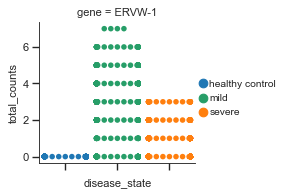

In [560]:
kind='swarm'
y='total_counts'
x='disease_state'
col_dict=dict(zip(['healthy control', 'mild','severe'],['#1f77b4','#279e68','#ff7f0e']))
tmp_fig=sns.catplot(data=out_df,col='gene',hue='disease_state',kind=kind,ci=None,sharey=False,
                    palette=col_dict,
                    x=x,height=2.5,y=y).add_legend()
for ax in tmp_fig.axes.flatten():
    #ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    ax.set_xticklabels('',rotation=90)
    #ax.set_ylabel('Expression')
    #ax.set_xlabel('')

/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 99.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 97.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/covid_sc_immuno/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 98.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


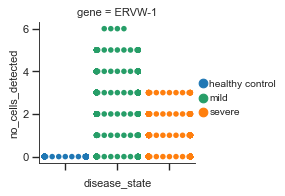

In [561]:
kind='swarm'
y='no_cells_detected'
x='disease_state'
col_dict=dict(zip(['healthy control', 'mild','severe'],['#1f77b4','#279e68','#ff7f0e']))
tmp_fig=sns.catplot(data=out_df,col='gene',hue='disease_state',kind=kind,ci=None,sharey=False,
                    palette=col_dict,
                    x=x,height=2.5,y=y).add_legend()
for ax in tmp_fig.axes.flatten():
    #ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    ax.set_xticklabels('',rotation=90)
    #ax.set_ylabel('Expression')
    #ax.set_xlabel('')

In [577]:
cell_type='ciliated'
in_dir=path.join(str(sc.settings.writedir),'results/diff_expression_analysis/covid_samples',cell_type,'diff_expr_test_results')
target_rep_fname= None # 'hypertensive_left_normal_replicate_1_alveolar_ciliated_diff_negbinom_expr_test.tab'
out_df_lst=[]
for fname in scandir(in_dir):
    if not fname.name.endswith('_expr_test.tab'):continue
    print(fname.name)
    tmp_diff_df=pd.read_csv(fname.path,header=0,index_col=1,sep='\t')
    tmp_diff_df=tmp_diff_df.loc[sorted(set(ade_ensembl_id_dict.keys()).intersection(tmp_diff_df.index)),:]
    tmp_diff_df['gene_name']=[ade_ensembl_id_dict[gn] for gn in tmp_diff_df.index]
    tmp_diff_df['method']=fname.name.split('_')[-3]
    tmp_diff_df['tested_group']=[grp.split('_replicate')[0].strip() for grp in tmp_diff_df.test_id.to_list()]
    tmp_diff_df=tmp_diff_df.loc[:,['gene_name','method','cell_type','de_type','avg_logFC','p_val','p_val_adj','tested_group','test_id']]
    out_df_lst.append(tmp_diff_df)
    del tmp_diff_df
    print()
diff_out_df=pd.concat(out_df_lst)
del out_df_lst

healthy control_severe_replicate_880_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_563_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_170_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_958_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_897_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_963_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_500_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_161_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_485_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_113_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_176_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_51_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_876_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_36_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_r


healthy control_mild_replicate_23_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_471_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_510_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_466_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_172_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_34_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_502_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_442_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_887_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_534_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_13_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_902_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_9_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_487_ciliated_diff_wilcox_expr_test.tab


healthy control_severe_replicate_742_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_351_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_341_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_237_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_164_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_979_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_458_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_866_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_173_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_818_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_858_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_885_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_405_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_980_ciliated_diff_wilcox_expr_test.tab

heal


healthy control_mild_replicate_137_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_859_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_192_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_404_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_113_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_878_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_981_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_104_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_919_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_804_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_581_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_37_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_365_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_572_ciliated_diff_negbinom_expr_test.tab

mild_severe_re


mild_severe_replicate_30_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_465_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_575_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_865_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_562_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_27_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_438_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_489_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_190_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_430_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_406_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_838_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_427_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_78_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_583_ciliated_diff_wilcox_ex


mild_severe_replicate_938_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_981_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_996_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_901_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_112_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_544_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_432_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_63_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_74_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_673_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_553_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_425_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_53_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_401_ciliated_diff_negbinom_expr_test.tab

mild_

healthy control_mild_replicate_12_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_440_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_846_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_61_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_536_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_512_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_464_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_35_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_22_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_505_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_825_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_473_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_703_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_375_ciliated_diff_negbinom_ex


healthy control_mild_replicate_515_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_708_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_474_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_502_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_25_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_736_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_674_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_640_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_253_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_663_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_623_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_788_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_731_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_726_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_repl


mild_severe_replicate_802_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_8_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_522_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_454_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_22_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_470_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_461_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_506_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_467_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_78_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_35_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_511_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_711_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_917_ciliated_diff_wilcox_expr_test.tab




mild_severe_replicate_634_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_893_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_166_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_766_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_575_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_771_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_55_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_407_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_986_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_571_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_403_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_586_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_43_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_803_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_24_cilia


healthy control_severe_replicate_808_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_267_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_408_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_270_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_436_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_744_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_770_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_606_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_767_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_369_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_611_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_357_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_635_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_719_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_repli


healthy control_severe_replicate_481_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_904_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_129_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_121_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_567_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_559_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_198_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_136_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_959_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_174_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_313_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_265_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_643_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_304_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replica


healthy control_severe_replicate_508_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_381_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_178_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_955_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_338_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_555_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_90_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_396_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_844_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_423_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_932_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_998_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_853_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_598_ciliated_diff_wilcox_expr_test.tab

healthy


healthy control_mild_replicate_753_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_867_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_911_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_625_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_208_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_386_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_678_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_391_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_255_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_328_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_628_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_934_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_119_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_691_ciliated_diff_negbinom_expr_test.tab

mild_severe_repli


healthy control_mild_replicate_787_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_211_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_385_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_359_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_857_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_921_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_185_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_774_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_192_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_840_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_936_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_304_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_912_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_88_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_re


healthy control_mild_replicate_282_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_714_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_709_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_78_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_271_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_668_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_601_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_783_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_784_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_794_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_527_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_836_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_134_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_919_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_821_ciliated_diff_negbinom_expr


healthy control_mild_replicate_972_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_804_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_305_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_899_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_820_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_693_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_956_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_837_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_280_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_941_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_728_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_716_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_293_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_660_ciliated_diff_wilcox_expr_test.tab

health


mild_severe_replicate_591_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_202_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_586_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_18_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_387_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_449_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_767_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_786_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_649_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_374_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_791_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_292_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_704_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_317_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_re


mild_severe_replicate_193_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_674_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_937_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_841_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_538_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_493_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_883_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_938_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_115_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_484_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_906_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_565_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_965_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_578_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_148_cili


healthy control_mild_replicate_401_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_186_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_197_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_922_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_935_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_584_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_191_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_18_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_867_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_462_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_870_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_862_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_107_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_914_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_139_cilia


mild_severe_replicate_860_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_877_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_771_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_986_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_403_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_195_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_586_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_59_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_803_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_559_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_460_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_79_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_69_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_438_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_rep


healthy control_severe_replicate_458_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_587_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_539_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_42_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_802_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_25_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_580_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_39_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_861_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_659_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_745_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_368_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_356_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_738_ciliated_diff_negbinom_expr_test.tab

mild_severe_r


mild_severe_replicate_782_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_684_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_795_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_708_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_371_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_669_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_444_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_972_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_965_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_837_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_427_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_820_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_819_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_827_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_899_ciliated_diff_negbinom_expr_tes


healthy control_mild_replicate_563_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_170_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_759_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_500_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_885_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_900_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_485_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_113_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_876_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_848_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_38_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_448_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_496_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_590_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_55_c


mild_severe_replicate_54_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_628_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_670_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_796_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_200_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_613_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_385_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_394_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_864_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_383_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_268_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_439_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_407_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_982_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_rep


mild_severe_replicate_872_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_999_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_184_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_601_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_920_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_397_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_784_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_937_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_212_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_193_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_393_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_777_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_384_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_749_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_307_ciliated_


mild_severe_replicate_279_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_247_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_209_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_654_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_70_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_972_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_518_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_479_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_572_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_911_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_592_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_102_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_1_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_894_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_585_ciliated_diff_negbin


mild_severe_replicate_384_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_729_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_590_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_764_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_349_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_448_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_377_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_587_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_739_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_291_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_84_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_707_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_314_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_682_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicat


healthy control_mild_replicate_119_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_872_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_913_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_865_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_553_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_930_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_841_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_123_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_937_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_856_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_530_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_920_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_999_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_478_ciliated_diff_wilcox_expr_test.


healthy control_severe_replicate_230_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_927_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_798_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_851_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_142_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_951_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_483_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_494_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_551_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_489_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_121_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_409_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_532_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_889_ciliated_diff_wilcox_expr_test.tab

healthy control_m


healthy control_severe_replicate_638_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_490_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_487_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_215_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_665_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_29_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_248_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_696_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_300_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_713_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_285_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_363_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_748_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_629_ciliated_diff_negbinom_expr_test.tab

healthy contr


healthy control_mild_replicate_149_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_528_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_943_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_835_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_516_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_811_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_967_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_158_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_975_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_166_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_575_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_806_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_970_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_986_ciliated_diff_wilcox_expr_test.tab

mild_sever


healthy control_mild_replicate_265_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_676_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_52_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_378_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_813_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_178_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_296_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_804_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_313_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_956_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_899_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_763_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_941_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_445_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_845_ciliated_diff_wilcox_expr_test.tab

mil


healthy control_severe_replicate_200_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_342_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_224_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_352_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_233_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_345_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_751_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_619_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_145_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_897_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_627_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_880_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_839_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_152_ciliated_diff_negbinom_expr_test.tab

healthy contr


mild_severe_replicate_666_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_753_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_466_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_510_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_37_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_20_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_236_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_471_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_208_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_507_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_646_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_523_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_678_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_455_ciliated_diff_negbinom_expr_test.tab

heal


healthy control_severe_replicate_298_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_357_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_340_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_609_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_212_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_279_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_654_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_205_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_722_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_173_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_818_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_979_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_164_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_699_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_


healthy control_severe_replicate_188_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_212_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_741_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_519_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_637_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_527_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_699_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_919_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_134_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_756_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_620_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_544_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_604_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_772_ciliated_diff_negbinom_expr_test.tab

mi

healthy control_mild_replicate_992_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_240_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_464_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_336_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_398_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_257_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_321_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_191_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_305_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_407_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_273_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_982_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_312_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_264_ciliated_diff_negbinom_expr_test


healthy control_severe_replicate_996_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_645_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_859_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_132_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_125_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_256_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_981_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_253_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_325_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_688_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_733_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_244_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_332_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_343_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_r


healthy control_severe_replicate_892_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_470_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_730_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_646_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_345_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_727_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_768_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_651_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_675_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_318_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_703_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_662_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_714_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_735_ciliated_diff_wilcox_expr_t


healthy control_mild_replicate_347_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_238_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_383_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_226_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_350_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_374_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_202_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_363_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_676_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_215_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_648_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_715_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_881_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_702_ciliated_diff_negbinom_expr_test.tab

mild_severe_repli


healthy control_mild_replicate_719_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_727_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_896_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_881_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_153_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_838_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_403_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_376_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_195_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_586_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_361_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_233_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_460_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_224_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_860_ciliated_diff_wilcox_e


mild_severe_replicate_607_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_222_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_399_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_610_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_116_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_104_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_929_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_492_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_529_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_101_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_517_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_159_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_974_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_938_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_167_cili


mild_severe_replicate_837_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_424_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_545_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_433_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_61_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_437_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_745_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_997_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_133_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_858_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_124_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_980_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_356_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_726_ciliated_diff_wilcox_expr_test.tab

mild_severe_


mild_severe_replicate_378_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_321_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_398_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_346_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_755_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_336_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_325_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_264_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_273_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_708_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_736_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_810_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_575_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_403_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_51_cilia


healthy control_severe_replicate_66_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_541_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_437_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_556_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_373_ciliated_diff_wilcox_expr_test.tab

healthy control_severe_replicate_420_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_71_ciliated_diff_negbinom_expr_test.tab

healthy control_mild_replicate_446_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_326_ciliated_diff_negbinom_expr_test.tab

mild_severe_replicate_478_ciliated_diff_wilcox_expr_test.tab

mild_severe_replicate_331_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_38_ciliated_diff_wilcox_expr_test.tab

healthy control_mild_replicate_388_ciliated_diff_negbinom_expr_test.tab

healthy control_severe_replicate_878_ciliated_diff_wilcox_expr_test.tab

mild_severe_re

In [578]:
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    print(k)
    print(v.shape)
    print()

('healthy control_mild', 'ACE2', 'negbinom')
(997, 9)

('healthy control_mild', 'ACE2', 'wilcox')
(997, 9)

('healthy control_mild', 'CD300LF', 'negbinom')
(996, 9)

('healthy control_mild', 'CD300LF', 'wilcox')
(996, 9)

('healthy control_mild', 'ERVW-1', 'negbinom')
(375, 9)

('healthy control_mild', 'ERVW-1', 'wilcox')
(375, 9)

('healthy control_mild', 'FCGR2A', 'negbinom')
(1000, 9)

('healthy control_mild', 'FCGR2A', 'wilcox')
(1000, 9)

('healthy control_mild', 'FUT8', 'negbinom')
(1000, 9)

('healthy control_mild', 'FUT8', 'wilcox')
(1000, 9)

('healthy control_mild', 'KLRD1', 'negbinom')
(19, 9)

('healthy control_mild', 'KLRD1', 'wilcox')
(19, 9)

('healthy control_mild', 'LIF', 'negbinom')
(1000, 9)

('healthy control_mild', 'LIF', 'wilcox')
(1000, 9)

('healthy control_mild', 'LIFR', 'negbinom')
(1000, 9)

('healthy control_mild', 'LIFR', 'wilcox')
(1000, 9)

('healthy control_mild', 'LILRB1', 'negbinom')
(950, 9)

('healthy control_mild', 'LILRB1', 'wilcox')
(950, 9)

('he

In [603]:
diff_test_method='wilcox'
comparison=None
target_gn=None
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),'-',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),'-',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),'-',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()

('healthy control_mild', 'ACE2', 'wilcox')
(997, 9)
p_val range: 0.0040384844620460604 - 1.0
median_p_val: 0.15416294420934099

p_val_adj range: 0.00740388818041777 - 1.0
median_adj_p_val: 0.190083146356251

avg_logFC range: -7.156285587073821 - 3.15903668529958
median_avg_logFC -1.7294515405089

('healthy control_mild', 'CD300LF', 'wilcox')
(996, 9)
p_val range: 0.0444171184347325 - 0.987941713605234
median_p_val: 0.392119003123858

p_val_adj range: 0.0493553679554177 - 1.0
median_adj_p_val: 0.39212306942585207

avg_logFC range: 0.401254974847441 - 7.52617316951355
median_avg_logFC 3.01810444015273

('healthy control_mild', 'ERVW-1', 'wilcox')
(375, 9)
p_val range: 0.0132718503910273 - 0.0827480155435781
median_p_val: 0.082745415676877

p_val_adj range: 0.0208557649001858 - 0.13202894509813
median_adj_p_val: 0.101136463442151

avg_logFC range: -7.49604531839188 - -5.34633783979166
median_avg_logFC -6.049589281763481

('healthy control_mild', 'FCGR2A', 'wilcox')
(1000, 9)
p_val range: 

In [580]:
sorted(ade_ensembl_id_dict.values())

['ACE2',
 'CD300LF',
 'ERVW-1',
 'FCGR2A',
 'FCGR2B',
 'FUT8',
 'IFNB1',
 'IFNG',
 'KLRC1',
 'KLRD1',
 'LIF',
 'LIFR',
 'LILRB1',
 'LILRB1',
 'LILRB1',
 'LILRB1',
 'LILRB1',
 'MYD88',
 'NRP1',
 'NRP2',
 'TMPRSS2']

In [581]:
sorted(set(diff_out_df['tested_group']))

['healthy control_mild', 'healthy control_severe', 'mild_severe']

In [602]:
diff_test_method='wilcox'
#diff_test_method='negbinom'
comparison='healthy control_mild'
target_gn='FCGR2B'
for k, v in diff_out_df.groupby(['tested_group','gene_name','method']):
    if not k[2] ==diff_test_method:continue
    if not comparison is None:
        if not k[0] ==comparison:continue
    if not target_gn is None:
        if not k[1] ==target_gn:continue
    print(k)
    print(v.shape)
    print('p_val range:',v['p_val'].min(),'-',v['p_val'].max())
    print('median_p_val:',v['p_val'].median())
    print()
    print('p_val_adj range:',v['p_val_adj'].min(),'-',v['p_val_adj'].max())
    print('median_adj_p_val:',v['p_val_adj'].median())
    print()
    print('avg_logFC range:',v['avg_logFC'].min(),'-',v['avg_logFC'].max())    
    print('median_avg_logFC',v['avg_logFC'].median())
    print()